<h1>How does energy demand correlate with climate change, and how can we produce more
energy without increasing pollution?<h1>

In [88]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
#to ignore warnings
import warnings
warnings.filterwarnings('ignore')

In [89]:
df = pd.read_excel('complete_renewable_energy_dataset_augmented_dataset.xlsx')

# Display the first few rows and data types
# Inspect the dataset

df.info() # Overview of columns, data types, and non-null counts
df.describe()  # Summary statistics for numerical columns


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5000 entries, 0 to 4999
Data columns (total 56 columns):
 #   Column                                   Non-Null Count  Dtype  
---  ------                                   --------------  -----  
 0   Country                                  5000 non-null   object 
 1   Year                                     5000 non-null   int64  
 2   Energy Type                              5000 non-null   object 
 3   Production (GWh)                         5000 non-null   float64
 4   Installed Capacity (MW)                  5000 non-null   float64
 5   Investments (USD)                        5000 non-null   float64
 6   Population                               5000 non-null   float64
 7   GDP                                      5000 non-null   float64
 8   Energy Consumption                       5000 non-null   float64
 9   Energy Exports                           5000 non-null   float64
 10  Energy Imports                           5000 no

,Year,Production (GWh),Installed Capacity (MW),Investments (USD),Population,GDP,Energy Consumption,Energy Exports,Energy Imports,CO2 Emissions,...,Economic Freedom Index,Ease of Doing Business,Innovation Index,Number of Research Institutions,Number of Renewable Energy Conferences,Number of Renewable Energy Publications,Energy Sector Workforce,Proportion of Energy from Renewables,Public-Private Partnerships in Energy,Regional Renewable Energy Cooperation
count,5000.000000,5000.000000,5000.000000,5.000000e+03,5.000000e+03,5.000000e+03,5000.000000,5000.000000,5000.000000,5000.000000,...,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000
mean,2011.437600,48743.195023,24882.910580,4.956155e+09,7.458927e+08,1.010745e+14,495701.245169,50143.392753,50800.373766,491218.412805,...,50.736748,48.442077,50.279982,496.660392,50.431207,4978.933584,502040.891156,49.749072,0.511960,0.473375
std,6.894782,28338.080419,14462.013145,2.894499e+09,4.372709e+08,5.781785e+13,291389.868699,28830.448911,28737.977010,289754.747901,...,28.620875,28.795518,28.716830,296.151371,28.874531,2881.644385,293055.320333,28.921365,0.499968,0.499311
min,2000.000000,1053.354000,114.519563,5.886994e+06,1.255357e+06,5.603965e+10,1264.851083,1036.618008,1057.783513,1124.764717,...,0.093032,0.016147,0.025733,-0.013447,-0.012618,3.000000,494.000000,0.031217,-0.034983,-0.028659
25%,2006.000000,24309.658436,12282.215920,2.473145e+09,3.720811e+08,5.049265e+13,237300.549510,25146.745295,26347.459862,242894.723749,...,26.241437,23.522350,25.934636,234.000000,25.996495,2532.000671,244438.000000,23.968389,0.000000,0.000000
50%,2011.000000,47367.117600,24689.158325,4.961772e+09,7.515190e+08,1.027010e+14,496118.165250,49706.655451,50698.800894,475720.996459,...,50.850766,48.128586,51.398964,493.000561,51.003361,4992.500000,499150.985566,50.229694,0.983577,0.012615
75%,2017.250000,73079.451749,37438.443573,7.418384e+09,1.118019e+09,1.519602e+14,753779.289169,75567.192244,75807.642497,747649.446325,...,74.918902,73.324825,74.723387,755.000000,75.997491,7464.999503,765088.000000,74.356053,1.000000,1.000000
max,2023.000000,99937.503720,49997.389137,9.998292e+09,1.499494e+09,1.999220e+14,999618.512200,99952.525160,99912.223095,999816.500200,...,99.987741,99.901347,99.998838,999.028140,99.024226,9999.000000,999226.000000,99.994551,1.033392,1.029997


In [58]:
df.head()  # Preview the first few rows


,Country,Year,Energy Type,Production (GWh),Installed Capacity (MW),Investments (USD),Population,GDP,Energy Consumption,Energy Exports,...,Economic Freedom Index,Ease of Doing Business,Innovation Index,Number of Research Institutions,Number of Renewable Energy Conferences,Number of Renewable Energy Publications,Energy Sector Workforce,Proportion of Energy from Renewables,Public-Private Partnerships in Energy,Regional Renewable Energy Cooperation
0,USA,2011,Solar,85404.69003,5549.794323,5.604125e+09,1.064007e+09,1.775280e+14,369654.6442,93087.198200,...,49.216800,57.678605,76.803228,851.0,75.0,6361.0,511658.0,25.907895,1.0,0.0
1,Australia,2008,Geothermal,22205.06938,43211.593800,6.361886e+08,1.033256e+09,6.435370e+13,771781.6363,1752.536054,...,79.990942,1.761579,48.697825,590.0,39.0,9752.0,974948.0,95.003547,0.0,1.0
2,Canada,2013,Biomass,94102.73204,6139.117212,6.158680e+09,1.489512e+07,1.567930e+14,342707.1529,65146.592500,...,94.374040,77.657334,67.334813,101.0,7.0,311.0,326318.0,67.354539,1.0,0.0
3,Japan,2010,Biomass,88771.93291,40323.639260,8.526116e+09,1.448827e+09,1.350460e+14,498839.5743,50257.591010,...,65.143472,44.987734,4.544289,327.0,3.0,7708.0,506078.0,33.754104,0.0,0.0
4,China,2018,Solar,93288.40858,30755.403060,5.086237e+09,1.499494e+09,8.677960e+13,819064.3628,63101.395560,...,86.213626,62.535223,10.287199,985.0,69.0,4919.0,187964.0,59.509228,1.0,0.0


In [60]:
df.tail()

,Country,Year,Energy Type,Production (GWh),Installed Capacity (MW),Investments (USD),Population,GDP,Energy Consumption,Energy Exports,...,Economic Freedom Index,Ease of Doing Business,Innovation Index,Number of Research Institutions,Number of Renewable Energy Conferences,Number of Renewable Energy Publications,Energy Sector Workforce,Proportion of Energy from Renewables,Public-Private Partnerships in Energy,Regional Renewable Energy Cooperation
4995,Japan,2023,Solar,40091.205770,46650.076055,5.589553e+09,8.198980e+08,1.110050e+14,574873.702236,57322.052910,...,57.183729,48.876731,60.287668,890.020187,24.991564,9992.003515,883698.003403,29.408824,1.004754,0.014668
4996,Australia,2017,Hydro,9454.193877,28506.759210,5.602669e+09,1.165229e+08,1.433960e+14,741594.174015,56635.968559,...,68.989306,85.803421,39.242515,898.007217,77.017627,6483.999389,447625.991505,73.280171,0.994731,0.998441
4997,India,2022,Geothermal,94329.602717,22757.487527,8.590460e+09,1.409071e+09,5.582920e+13,922633.993440,85455.108026,...,32.754429,1.054598,51.280290,601.998497,49.011146,3535.007953,535995.983156,25.233648,0.001026,1.002549
4998,China,2000,Biomass,66206.317421,3530.006152,5.640793e+09,8.598507e+08,2.147670e+13,481213.415776,44933.817936,...,60.281749,29.260286,17.244905,519.994119,45.999962,248.995064,21321.996515,7.992081,0.997638,0.007423
4999,France,2010,Hydro,13035.585751,22890.613174,2.736650e+09,4.367711e+08,1.300410e+14,673214.502385,25024.622693,...,95.240888,17.336647,26.429246,245.006440,18.014988,388.998795,493059.993662,91.533141,0.007220,0.007360


In [61]:
df.dtypes


Country                                     object
Year                                         int64
Energy Type                                 object
Production (GWh)                           float64
Installed Capacity (MW)                    float64
Investments (USD)                          float64
Population                                 float64
GDP                                        float64
Energy Consumption                         float64
Energy Exports                             float64
Energy Imports                             float64
CO2 Emissions                              float64
Renewable Energy Jobs                      float64
Government Policies                        float64
R&D Expenditure                            float64
Renewable Energy Targets                   float64
Average Annual Temperature                 float64
Annual Rainfall                            float64
Solar Irradiance                           float64
Wind Speed                     

In [63]:
df.nunique()

Country                                      10
Year                                         24
Energy Type                                   5
Production (GWh)                           5000
Installed Capacity (MW)                    5000
Investments (USD)                          5000
Population                                 5000
GDP                                        3101
Energy Consumption                         5000
Energy Exports                             5000
Energy Imports                             5000
CO2 Emissions                              5000
Renewable Energy Jobs                      4999
Government Policies                        2502
R&D Expenditure                            4999
Renewable Energy Targets                   2502
Average Annual Temperature                 5000
Annual Rainfall                            5000
Solar Irradiance                           5000
Wind Speed                                 5000
Hydro Potential                         

In [65]:
df.isnull().sum()

Country                                    0
Year                                       0
Energy Type                                0
Production (GWh)                           0
Installed Capacity (MW)                    0
Investments (USD)                          0
Population                                 0
GDP                                        0
Energy Consumption                         0
Energy Exports                             0
Energy Imports                             0
CO2 Emissions                              0
Renewable Energy Jobs                      0
Government Policies                        0
R&D Expenditure                            0
Renewable Energy Targets                   0
Average Annual Temperature                 0
Annual Rainfall                            0
Solar Irradiance                           0
Wind Speed                                 0
Hydro Potential                            0
Geothermal Potential                       0
Biomass Av

In [66]:
numerical_features = df.select_dtypes(include=['float64', 'int64']).columns
categorical_features = df.select_dtypes(include=['object']).columns

print("Numerical Features:", numerical_features)
print("Categorical Features:", categorical_features)


Numerical Features: Index(['Year', 'Production (GWh)', 'Installed Capacity (MW)',
       'Investments (USD)', 'Population', 'GDP', 'Energy Consumption',
       'Energy Exports', 'Energy Imports', 'CO2 Emissions',
       'Renewable Energy Jobs', 'Government Policies', 'R&D Expenditure',
       'Renewable Energy Targets', 'Average Annual Temperature',
       'Annual Rainfall', 'Solar Irradiance', 'Wind Speed', 'Hydro Potential',
       'Geothermal Potential', 'Biomass Availability',
       'Energy Storage Capacity', 'Grid Integration Capability',
       'Electricity Prices', 'Energy Subsidies',
       'International Aid for Renewables', 'Public Awareness',
       'Energy Efficiency Programs', 'Urbanization Rate',
       'Industrialization Rate', 'Energy Market Liberalization',
       'Renewable Energy Patents', 'Educational Level',
       'Technology Transfer Agreements', 'Renewable Energy Education Programs',
       'Local Manufacturing Capacity', 'Import Tariffs on Energy Equipment',
 

In [67]:
column_names = df.columns.tolist()
print(column_names)


['Country', 'Year', 'Energy Type', 'Production (GWh)', 'Installed Capacity (MW)', 'Investments (USD)', 'Population', 'GDP', 'Energy Consumption', 'Energy Exports', 'Energy Imports', 'CO2 Emissions', 'Renewable Energy Jobs', 'Government Policies', 'R&D Expenditure', 'Renewable Energy Targets', 'Average Annual Temperature', 'Annual Rainfall', 'Solar Irradiance', 'Wind Speed', 'Hydro Potential', 'Geothermal Potential', 'Biomass Availability', 'Energy Storage Capacity', 'Grid Integration Capability', 'Electricity Prices', 'Energy Subsidies', 'International Aid for Renewables', 'Public Awareness', 'Energy Efficiency Programs', 'Urbanization Rate', 'Industrialization Rate', 'Energy Market Liberalization', 'Renewable Energy Patents', 'Educational Level', 'Technology Transfer Agreements', 'Renewable Energy Education Programs', 'Local Manufacturing Capacity', 'Import Tariffs on Energy Equipment', 'Export Incentives for Energy Equipment', 'Natural Disasters', 'Political Stability', 'Corruption P

In [68]:
# Step 4: Feature Engineering
# Create new features based on domain knowledge
df['Population_Urbanization'] = df['Population'] * df['Urbanization Rate']
df['Log_Energy_Consumption'] = np.log1p(df['Energy Consumption'])  # Apply log transformation for better distribution

df['Renewable Potential Score'] = df[['Solar Irradiance', 'Wind Speed', 'Hydro Potential',
                                      'Geothermal Potential', 'Biomass Availability']].mean(axis=1)
df['Policy Impact'] = df[['Energy Subsidies', 'Public Awareness',
                          'Energy Efficiency Programs']].sum(axis=1)
df['Pollution Intensity'] = df['CO2 Emissions'] / df['Energy Consumption']

In [69]:
# Display the first 10 rows of the newly engineered features
df[['Population_Urbanization', 'Log_Energy_Consumption',
    'Renewable Potential Score', 'Policy Impact', 'Pollution Intensity']].head(10)


,Population_Urbanization,Log_Energy_Consumption,Renewable Potential Score,Policy Impact,Pollution Intensity
0,6.231147e+10,12.820327,67.451916,1.688208e+08,0.796417
1,3.160454e+10,13.556458,64.496248,8.452255e+08,1.070940
2,4.753594e+08,12.744634,61.739910,2.578337e+08,0.127500
3,1.303174e+11,13.120042,89.808682,9.798269e+08,1.684667
4,6.701549e+10,13.615919,77.407196,6.767606e+08,0.197828
5,5.871035e+10,12.803614,72.931946,1.956941e+07,0.364657
6,1.941716e+10,13.812946,86.197229,2.008657e+08,0.697475
7,2.524053e+10,12.338197,73.398170,7.377982e+08,0.376211
8,3.634714e+09,11.707265,81.764369,8.296253e+08,6.860267
9,5.450243e+09,12.805818,84.151268,1.348682e+08,0.403022


In [70]:
df.head()

,Country,Year,Energy Type,Production (GWh),Installed Capacity (MW),Investments (USD),Population,GDP,Energy Consumption,Energy Exports,...,Number of Renewable Energy Publications,Energy Sector Workforce,Proportion of Energy from Renewables,Public-Private Partnerships in Energy,Regional Renewable Energy Cooperation,Population_Urbanization,Log_Energy_Consumption,Renewable Potential Score,Policy Impact,Pollution Intensity
0,USA,2011,Solar,85404.69003,5549.794323,5.604125e+09,1.064007e+09,1.775280e+14,369654.6442,93087.198200,...,6361.0,511658.0,25.907895,1.0,0.0,6.231147e+10,12.820327,67.451916,1.688208e+08,0.796417
1,Australia,2008,Geothermal,22205.06938,43211.593800,6.361886e+08,1.033256e+09,6.435370e+13,771781.6363,1752.536054,...,9752.0,974948.0,95.003547,0.0,1.0,3.160454e+10,13.556458,64.496248,8.452255e+08,1.070940
2,Canada,2013,Biomass,94102.73204,6139.117212,6.158680e+09,1.489512e+07,1.567930e+14,342707.1529,65146.592500,...,311.0,326318.0,67.354539,1.0,0.0,4.753594e+08,12.744634,61.739910,2.578337e+08,0.127500
3,Japan,2010,Biomass,88771.93291,40323.639260,8.526116e+09,1.448827e+09,1.350460e+14,498839.5743,50257.591010,...,7708.0,506078.0,33.754104,0.0,0.0,1.303174e+11,13.120042,89.808682,9.798269e+08,1.684667
4,China,2018,Solar,93288.40858,30755.403060,5.086237e+09,1.499494e+09,8.677960e+13,819064.3628,63101.395560,...,4919.0,187964.0,59.509228,1.0,0.0,6.701549e+10,13.615919,77.407196,6.767606e+08,0.197828


In [73]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Year,5000.0,2.011438e+03,6.894782e+00,2.000000e+03,2.006000e+03,2.011000e+03,2.017250e+03,2.023000e+03
Production (GWh),5000.0,4.874320e+04,2.833808e+04,1.053354e+03,2.430966e+04,4.736712e+04,7.307945e+04,9.993750e+04
Installed Capacity (MW),5000.0,2.488291e+04,1.446201e+04,1.145196e+02,1.228222e+04,2.468916e+04,3.743844e+04,4.999739e+04
Investments (USD),5000.0,4.956155e+09,2.894499e+09,5.886994e+06,2.473145e+09,4.961772e+09,7.418384e+09,9.998292e+09
Population,5000.0,7.458927e+08,4.372709e+08,1.255357e+06,3.720811e+08,7.515190e+08,1.118019e+09,1.499494e+09
GDP,5000.0,1.010745e+14,5.781785e+13,5.603965e+10,5.049265e+13,1.027010e+14,1.519602e+14,1.999220e+14
Energy Consumption,5000.0,4.957012e+05,2.913899e+05,1.264851e+03,2.373005e+05,4.961182e+05,7.537793e+05,9.996185e+05
Energy Exports,5000.0,5.014339e+04,2.883045e+04,1.036618e+03,2.514675e+04,4.970666e+04,7.556719e+04,9.995253e+04
Energy Imports,5000.0,5.080037e+04,2.873798e+04,1.057784e+03,2.634746e+04,5.069880e+04,7.580764e+04,9.991222e+04
CO2 Emissions,5000.0,4.912184e+05,2.897547e+05,1.124765e+03,2.428947e+05,4.757210e+05,7.476494e+05,9.998165e+05


In [75]:
cat_cols=df.select_dtypes(include=['object']).columns
num_cols = df.select_dtypes(include=np.number).columns.tolist()
print("Categorical Variables:")
print(cat_cols)
print("Numerical Variables:")
print(num_cols)

Categorical Variables:
Index(['Country', 'Energy Type'], dtype='object')
Numerical Variables:
['Year', 'Production (GWh)', 'Installed Capacity (MW)', 'Investments (USD)', 'Population', 'GDP', 'Energy Consumption', 'Energy Exports', 'Energy Imports', 'CO2 Emissions', 'Renewable Energy Jobs', 'Government Policies', 'R&D Expenditure', 'Renewable Energy Targets', 'Average Annual Temperature', 'Annual Rainfall', 'Solar Irradiance', 'Wind Speed', 'Hydro Potential', 'Geothermal Potential', 'Biomass Availability', 'Energy Storage Capacity', 'Grid Integration Capability', 'Electricity Prices', 'Energy Subsidies', 'International Aid for Renewables', 'Public Awareness', 'Energy Efficiency Programs', 'Urbanization Rate', 'Industrialization Rate', 'Energy Market Liberalization', 'Renewable Energy Patents', 'Educational Level', 'Technology Transfer Agreements', 'Renewable Energy Education Programs', 'Local Manufacturing Capacity', 'Import Tariffs on Energy Equipment', 'Export Incentives for Energy E

EDS

Year
Skew : 0.03


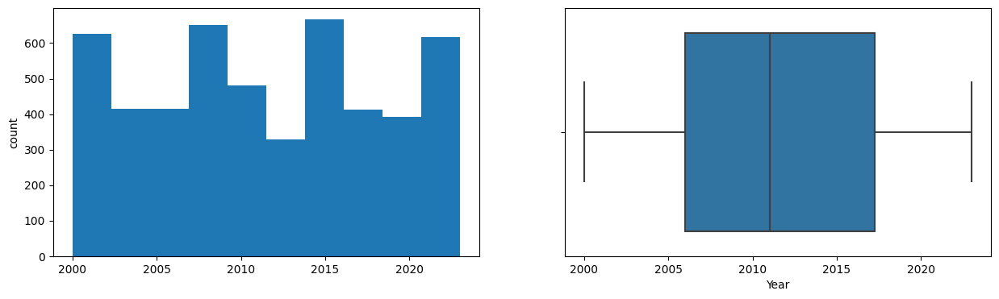

Production (GWh)
Skew : 0.06


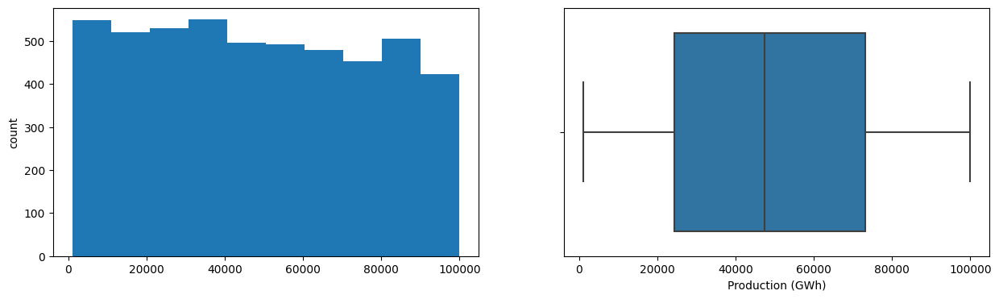

Installed Capacity (MW)
Skew : 0.01


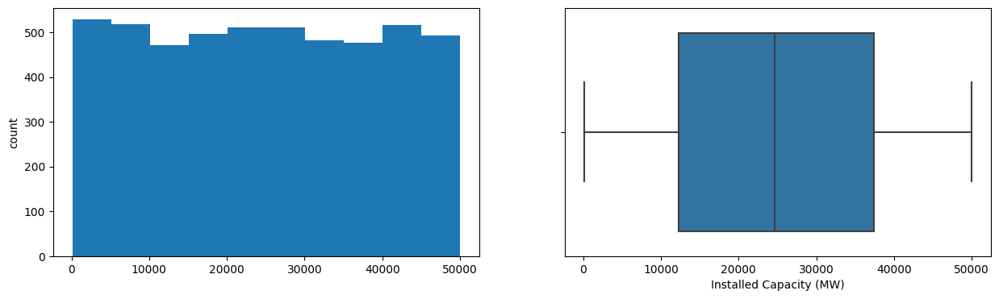

Investments (USD)
Skew : 0.02


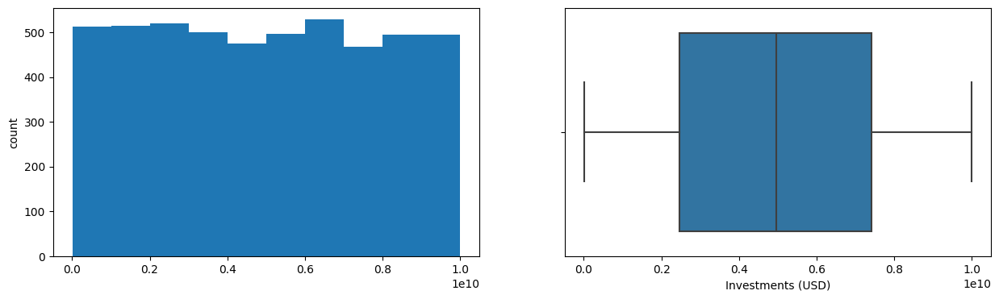

Population
Skew : -0.0


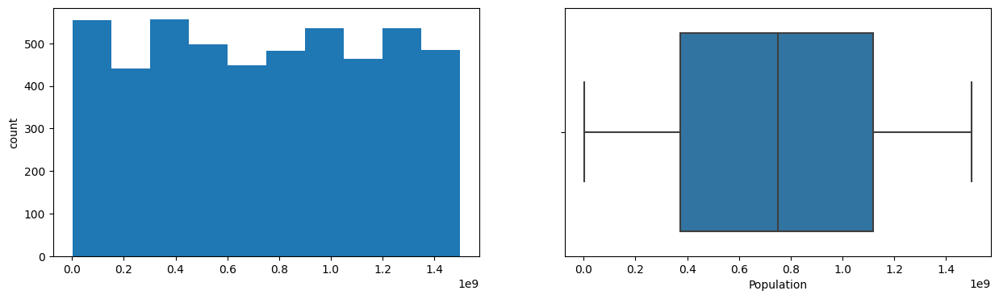

GDP
Skew : -0.05


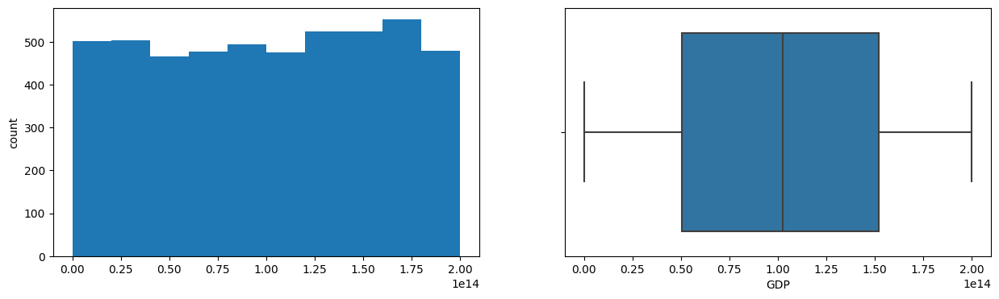

Energy Consumption
Skew : 0.01


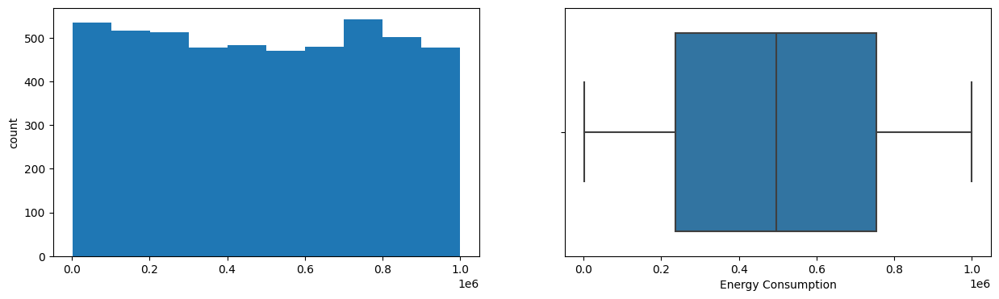

Energy Exports
Skew : 0.05


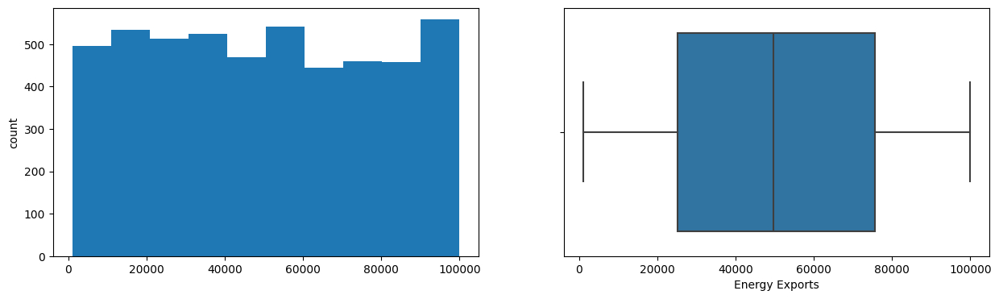

Energy Imports
Skew : -0.0


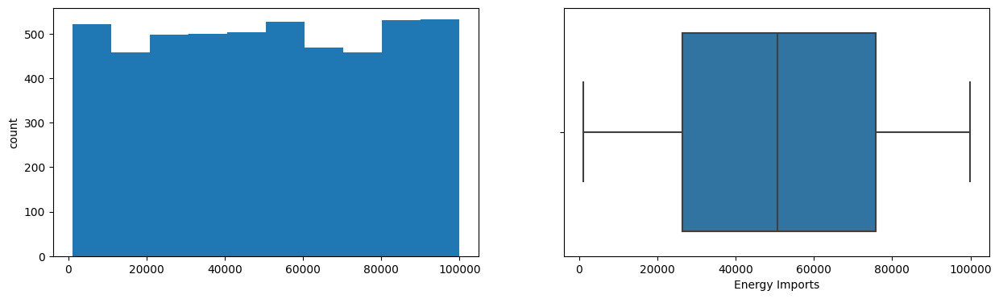

CO2 Emissions
Skew : 0.06


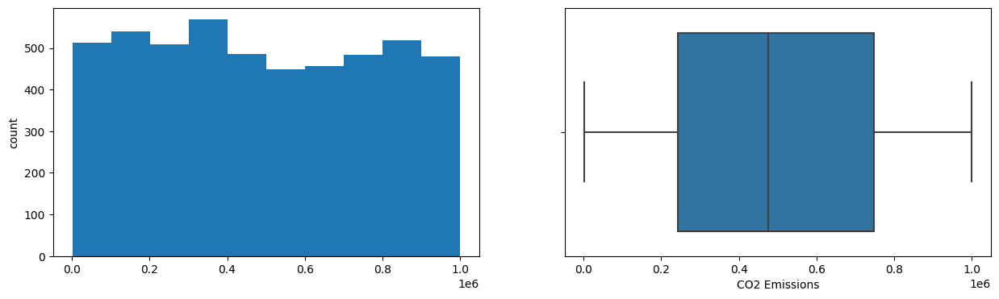

Renewable Energy Jobs
Skew : 0.02


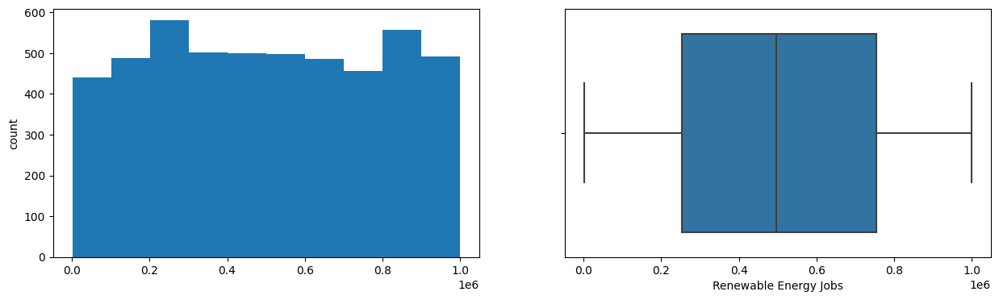

Government Policies
Skew : -0.04


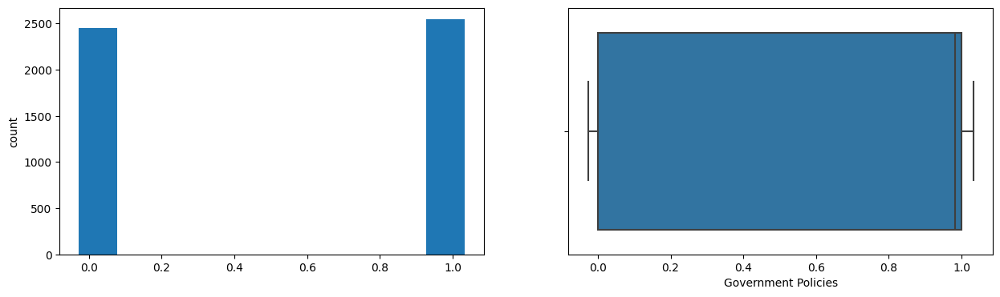

R&D Expenditure
Skew : 0.0


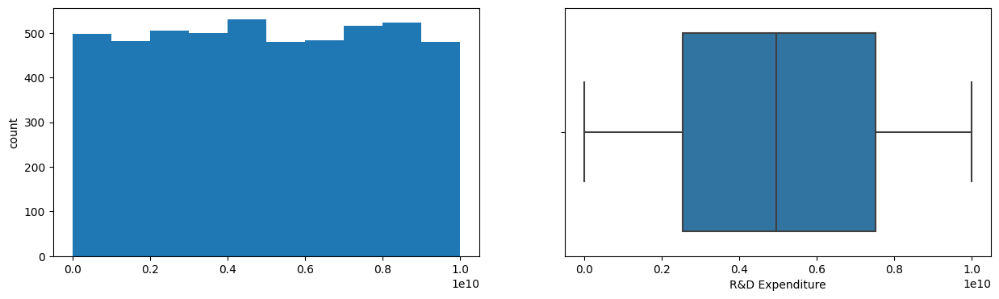

Renewable Energy Targets
Skew : 0.02


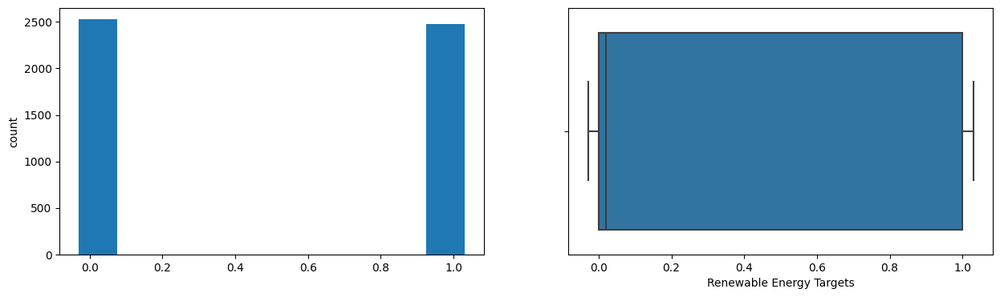

Average Annual Temperature
Skew : -0.02


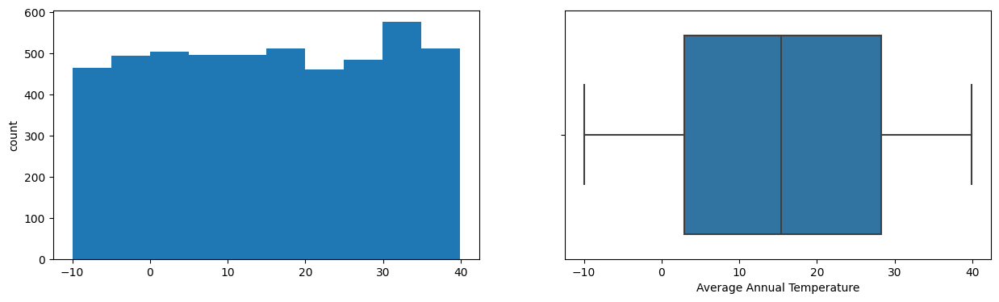

Annual Rainfall
Skew : -0.03


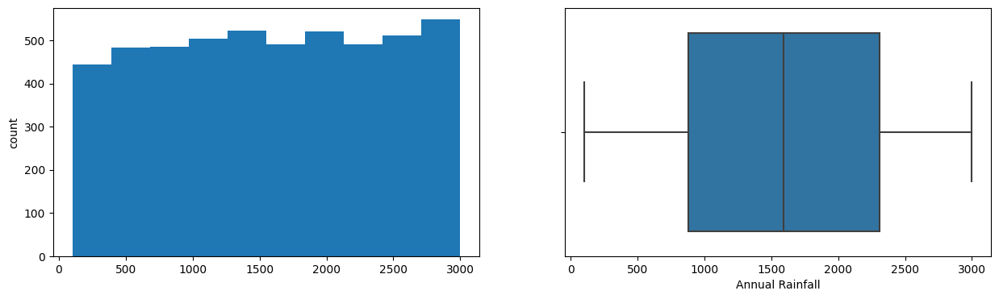

Solar Irradiance
Skew : -0.02


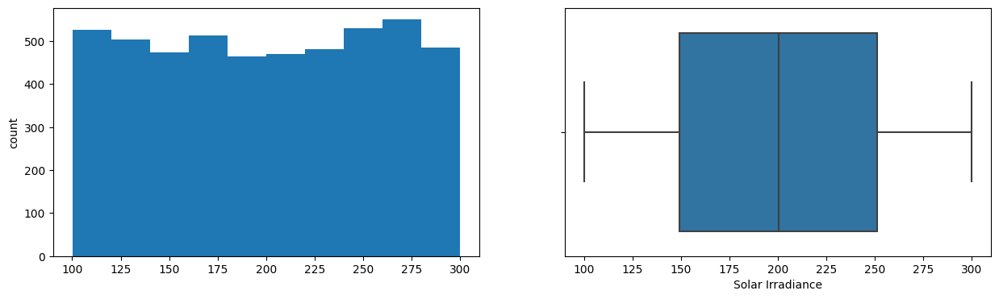

Wind Speed
Skew : 0.02


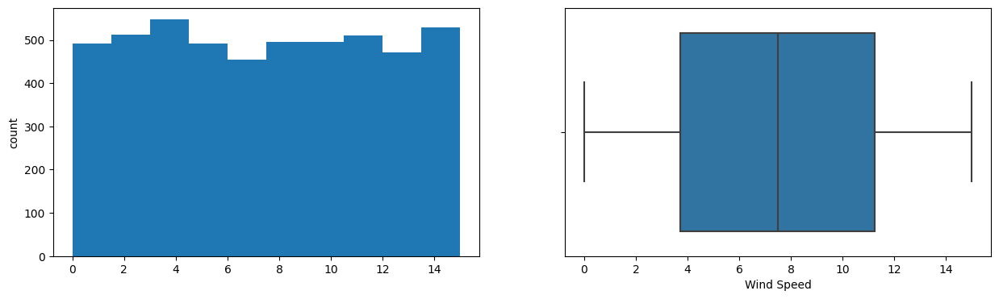

Hydro Potential
Skew : -0.01


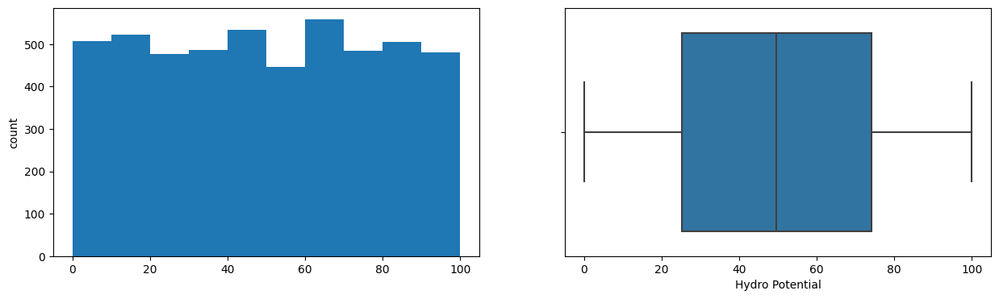

Geothermal Potential
Skew : -0.02


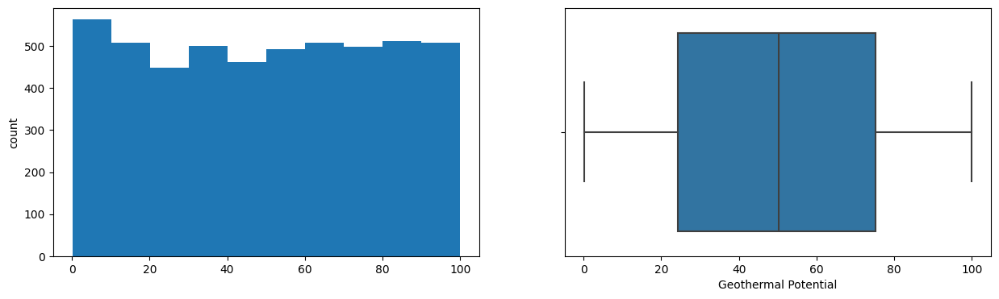

Biomass Availability
Skew : -0.0


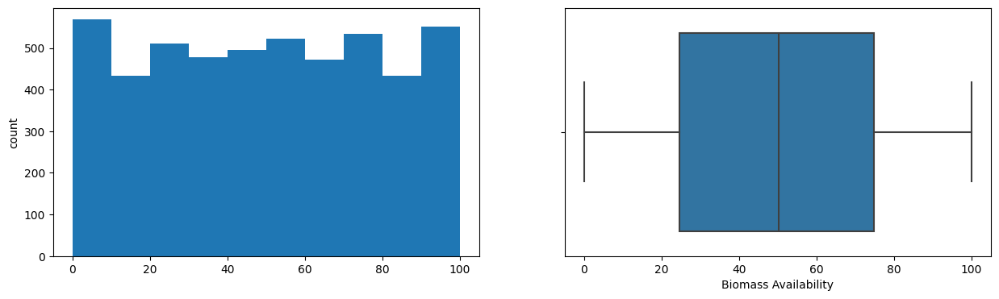

Energy Storage Capacity
Skew : -0.05


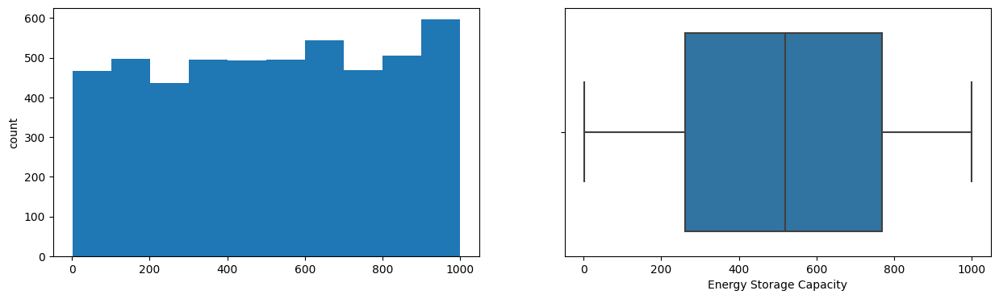

Grid Integration Capability
Skew : 0.02


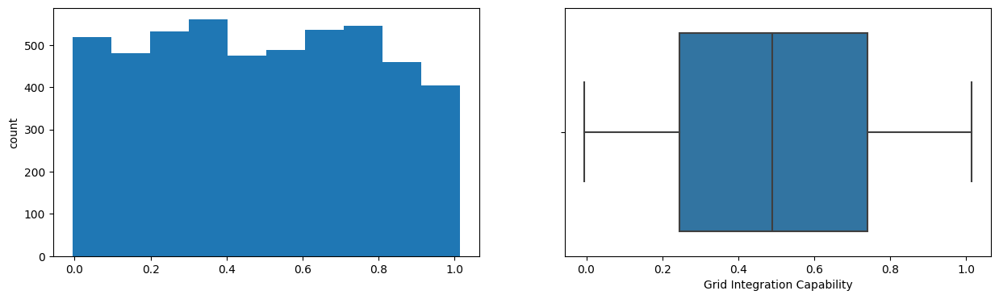

Electricity Prices
Skew : -0.01


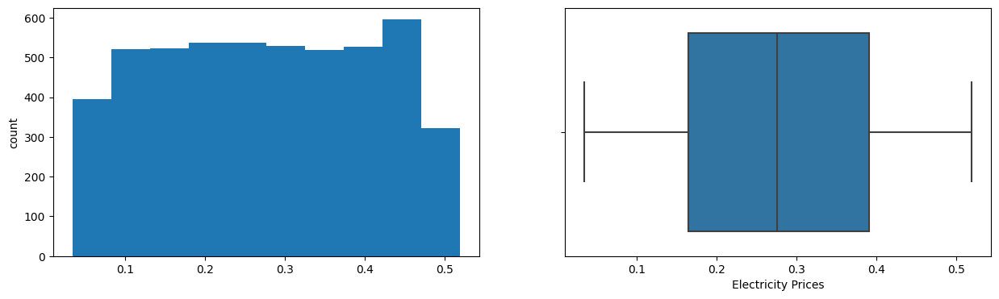

Energy Subsidies
Skew : -0.0


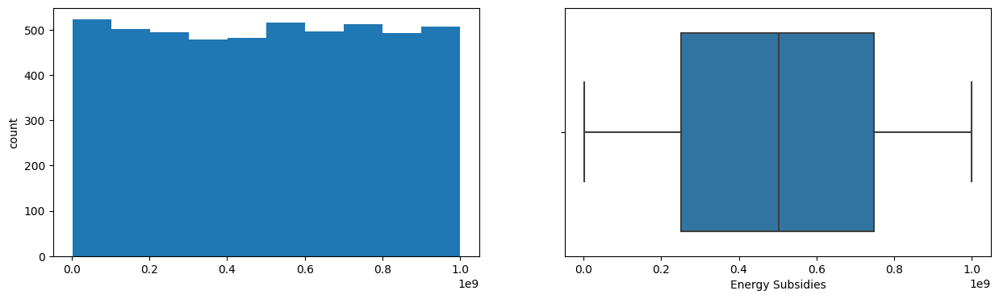

International Aid for Renewables
Skew : -0.03


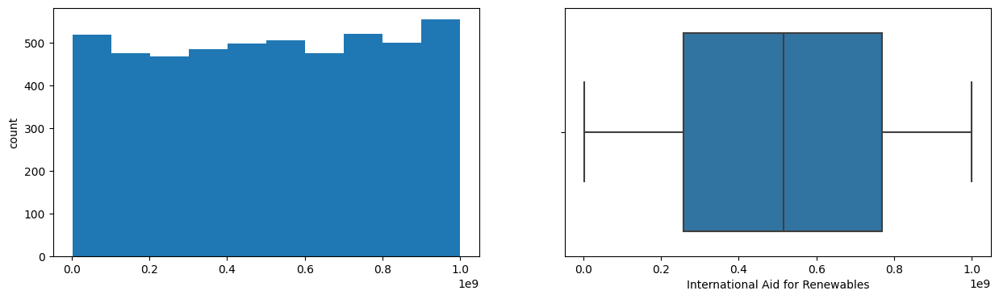

Public Awareness
Skew : -0.05


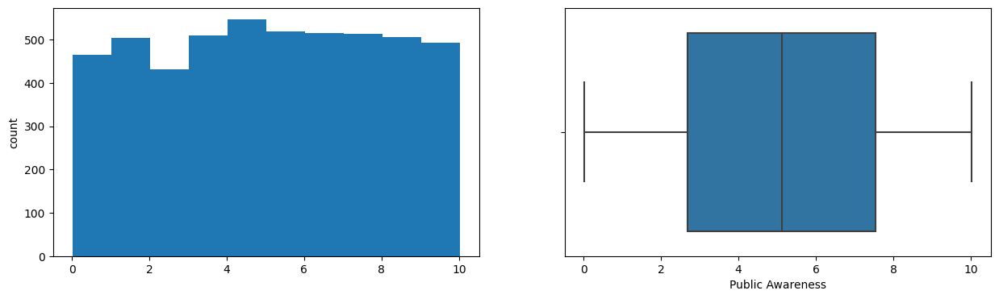

Energy Efficiency Programs
Skew : -0.03


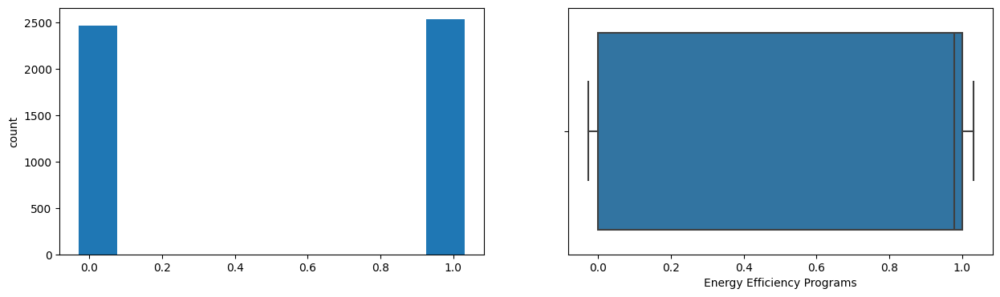

Urbanization Rate
Skew : 0.04


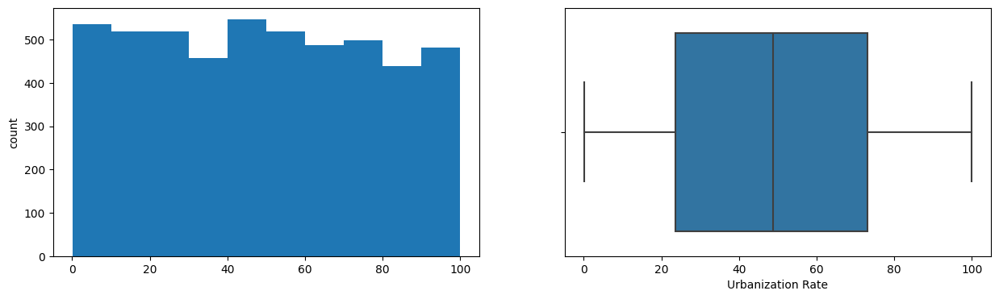

Industrialization Rate
Skew : 0.01


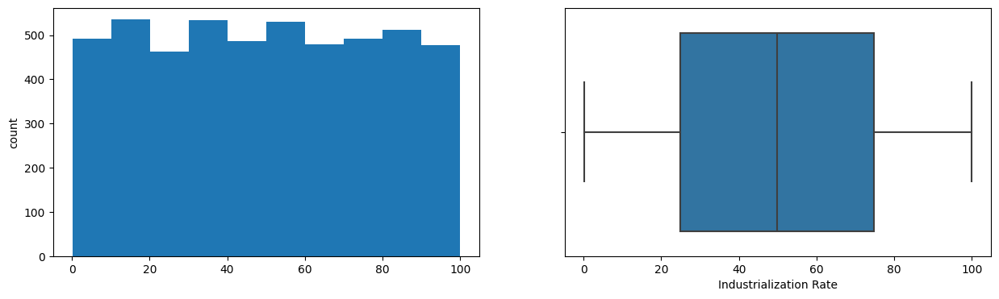

Energy Market Liberalization
Skew : 0.05


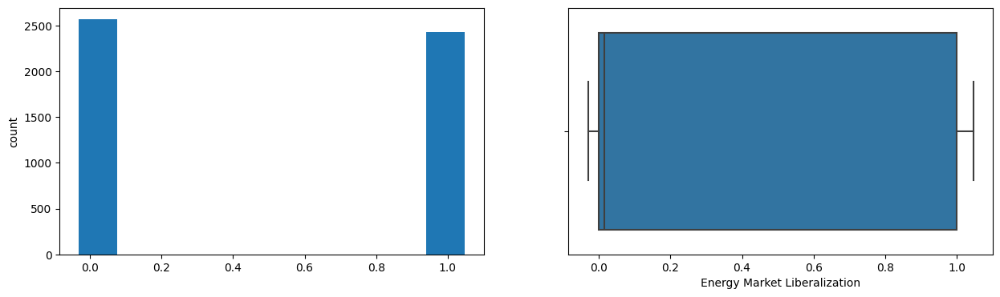

Renewable Energy Patents
Skew : 0.03


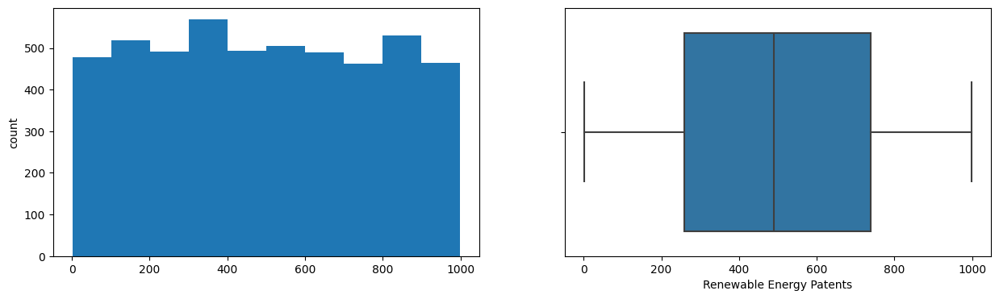

Educational Level
Skew : 0.02


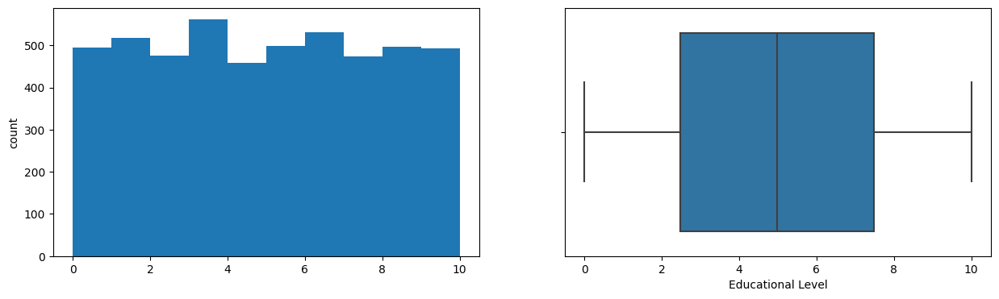

Technology Transfer Agreements
Skew : -0.03


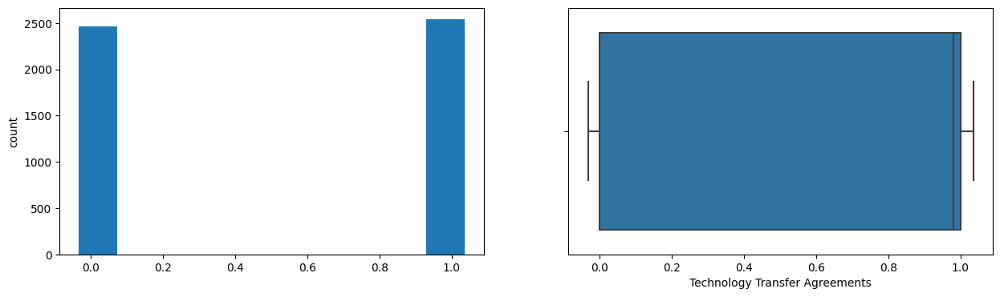

Renewable Energy Education Programs
Skew : -0.03


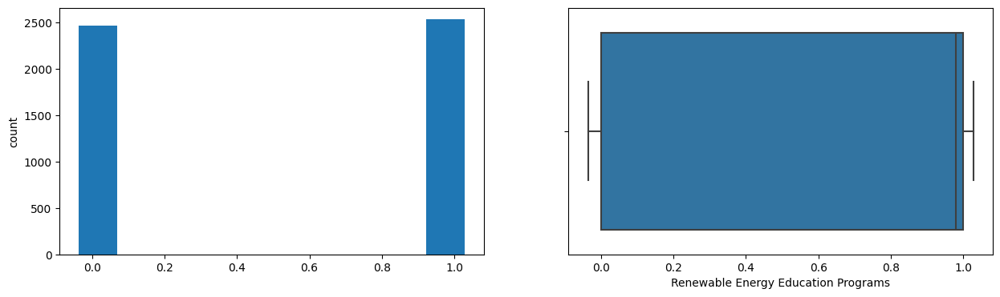

Local Manufacturing Capacity
Skew : -0.01


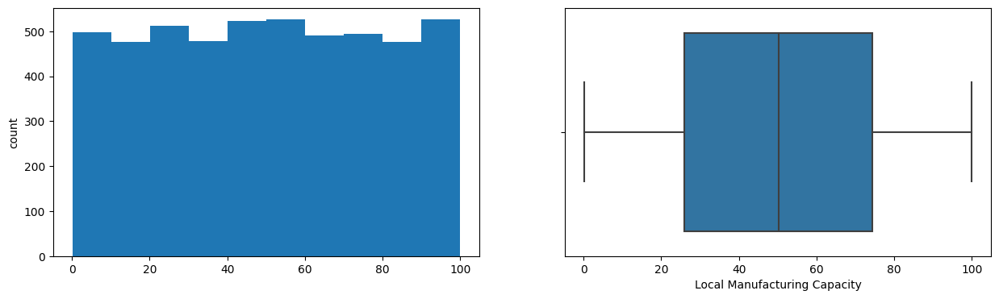

Import Tariffs on Energy Equipment
Skew : 0.02


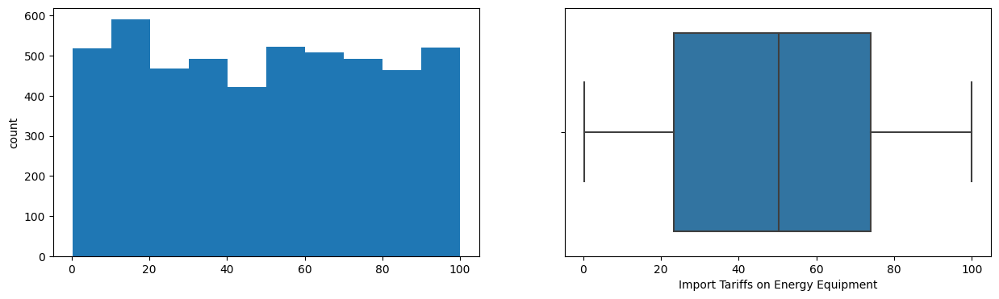

Export Incentives for Energy Equipment
Skew : -0.03


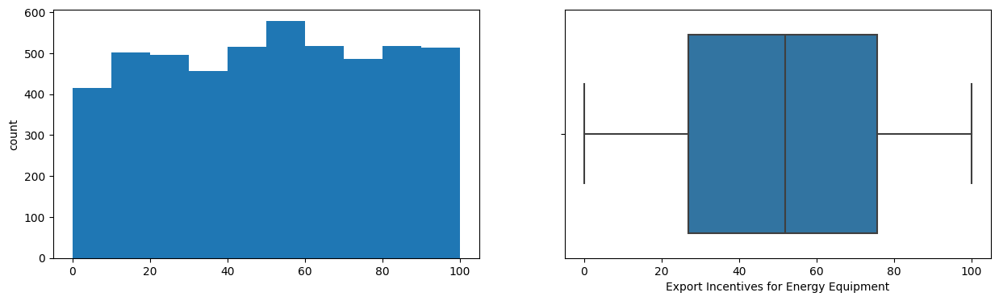

Natural Disasters
Skew : -0.05


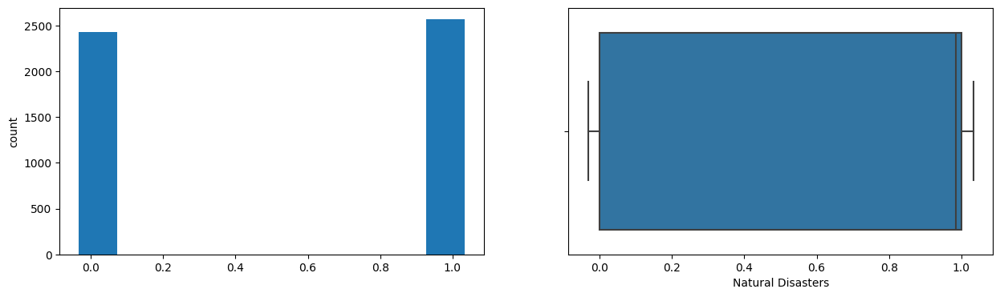

Political Stability
Skew : 0.01


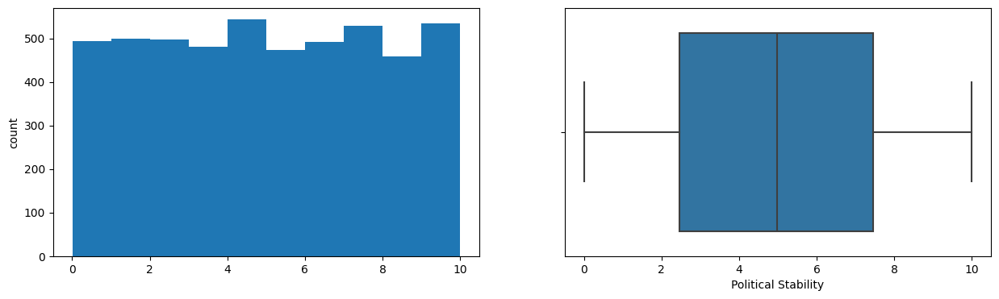

Corruption Perception Index
Skew : -0.0


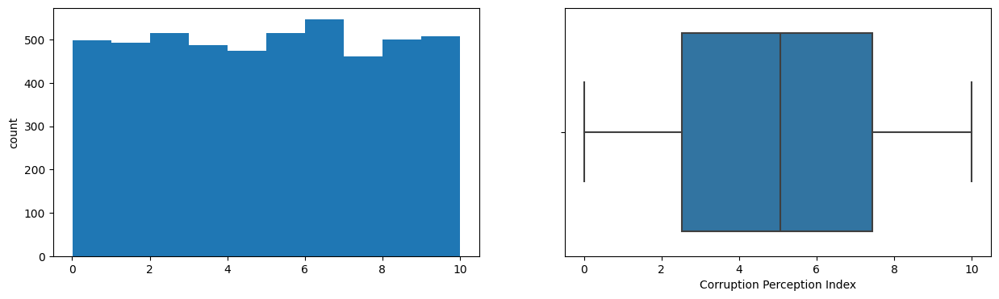

Regulatory Quality
Skew : 0.0


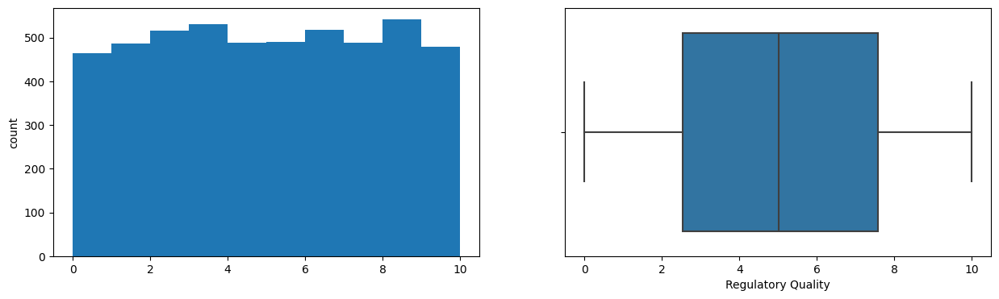

Rule of Law
Skew : -0.04


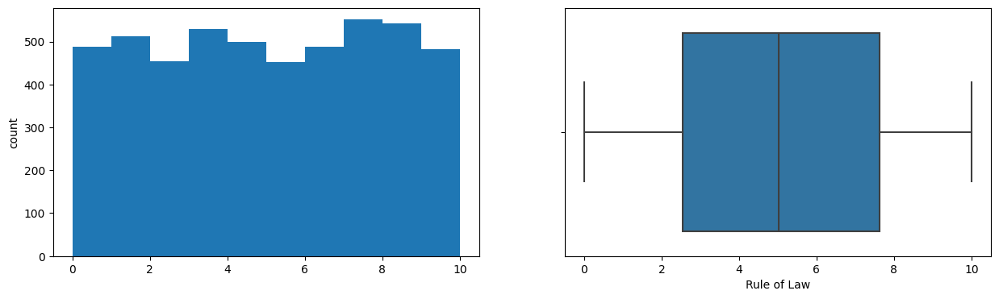

Control of Corruption
Skew : -0.01


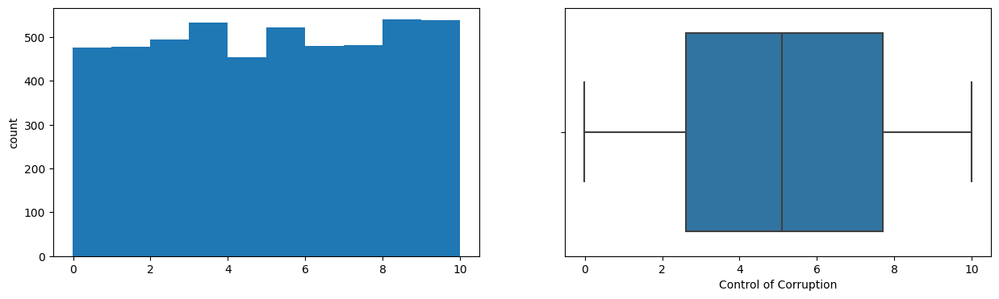

Economic Freedom Index
Skew : -0.03


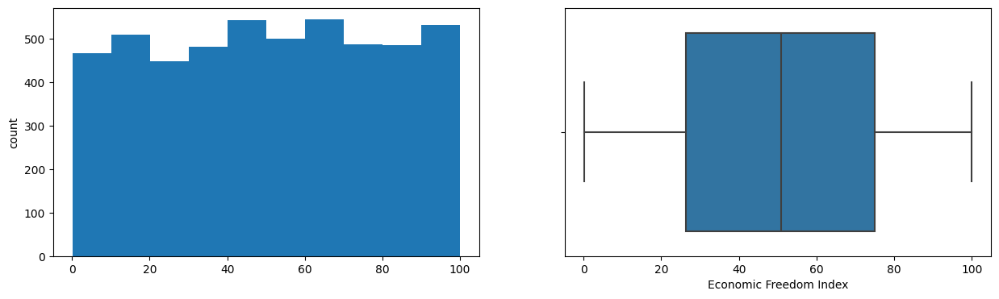

Ease of Doing Business
Skew : 0.06


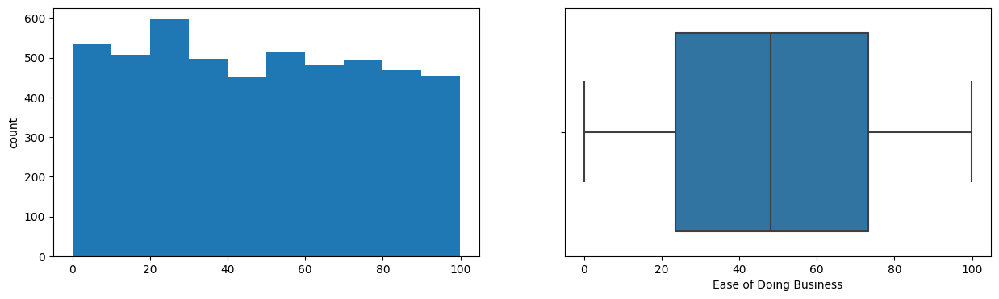

Innovation Index
Skew : -0.04


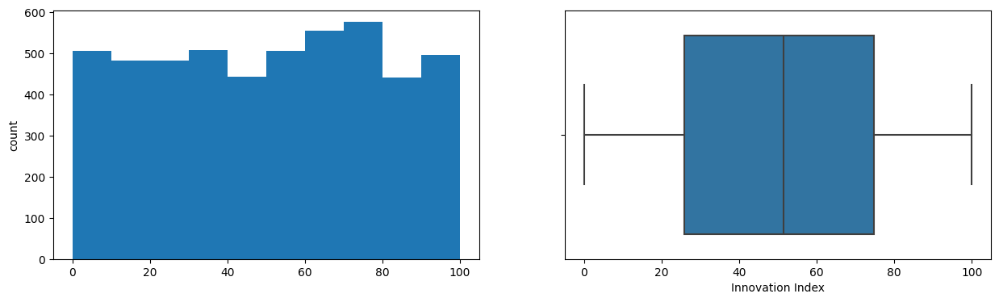

Number of Research Institutions
Skew : 0.02


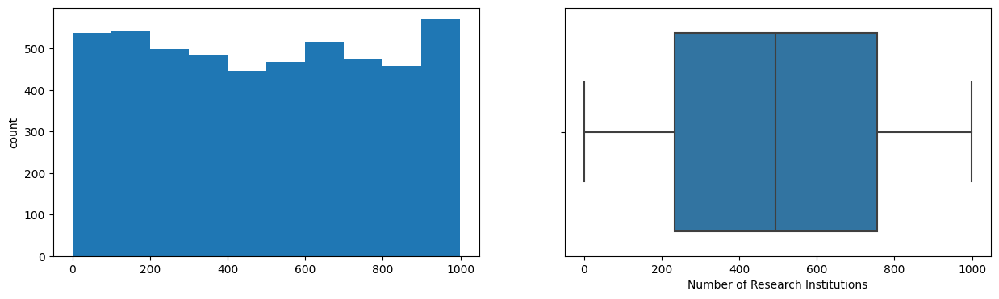

Number of Renewable Energy Conferences
Skew : -0.04


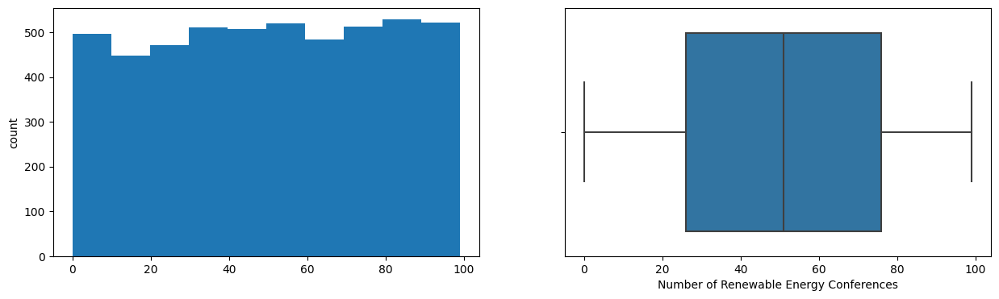

Number of Renewable Energy Publications
Skew : -0.01


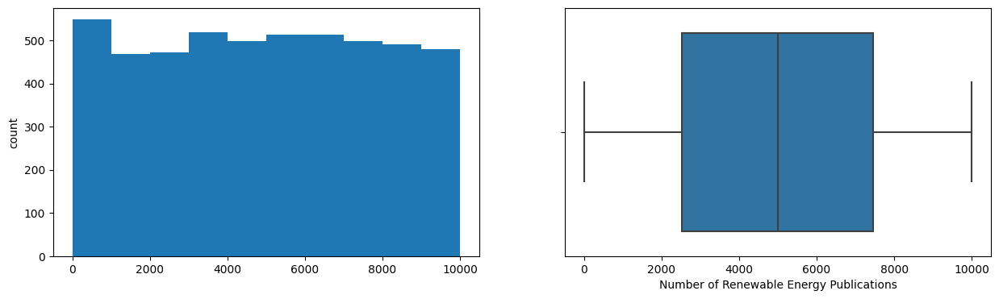

Energy Sector Workforce
Skew : 0.0


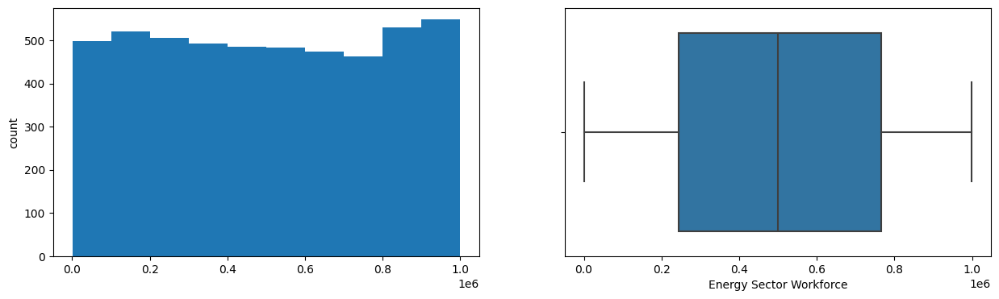

Proportion of Energy from Renewables
Skew : 0.0


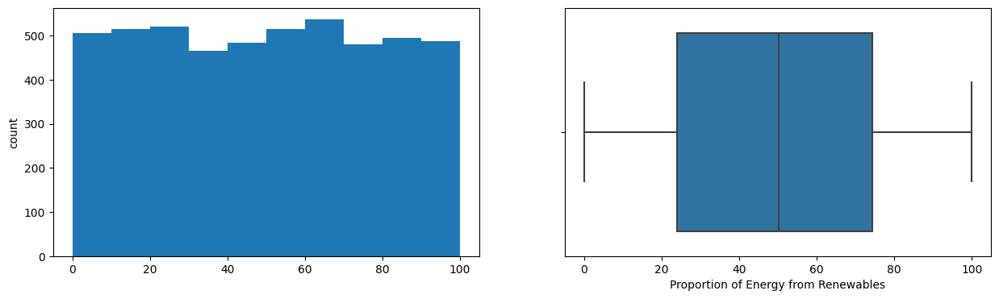

Public-Private Partnerships in Energy
Skew : -0.05


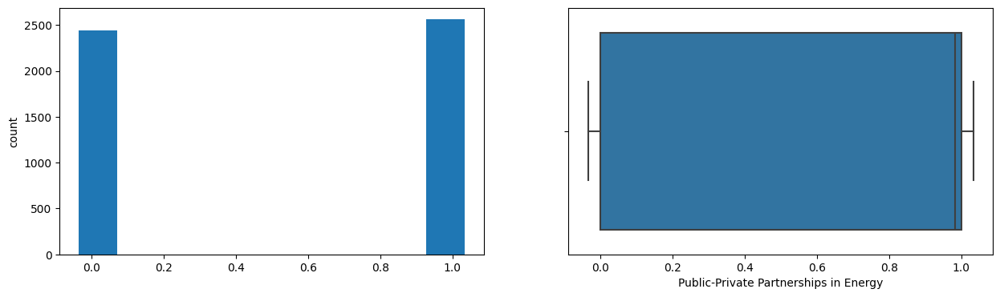

Regional Renewable Energy Cooperation
Skew : 0.11


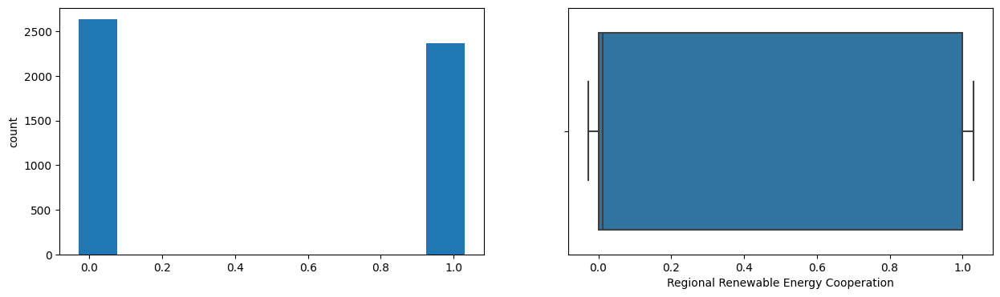

Population_Urbanization
Skew : 1.05


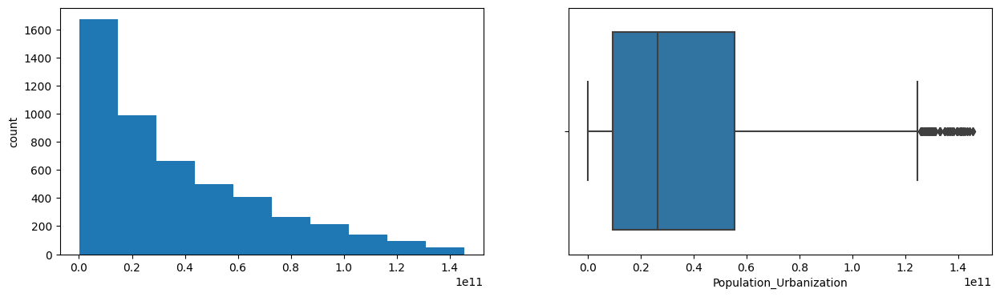

Log_Energy_Consumption
Skew : -1.68


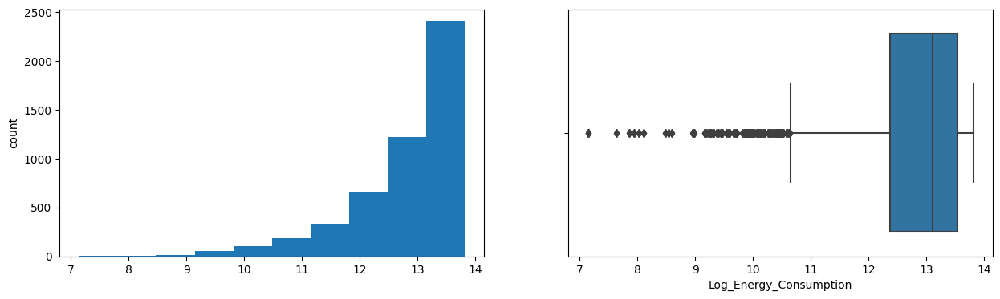

Renewable Potential Score
Skew : -0.04


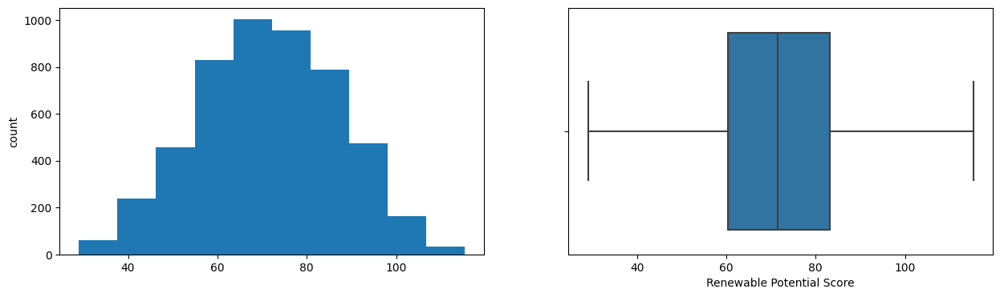

Policy Impact
Skew : -0.0


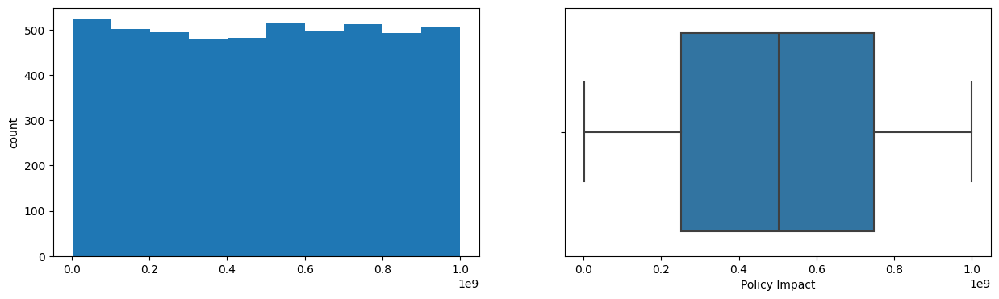

Pollution Intensity
Skew : 21.32


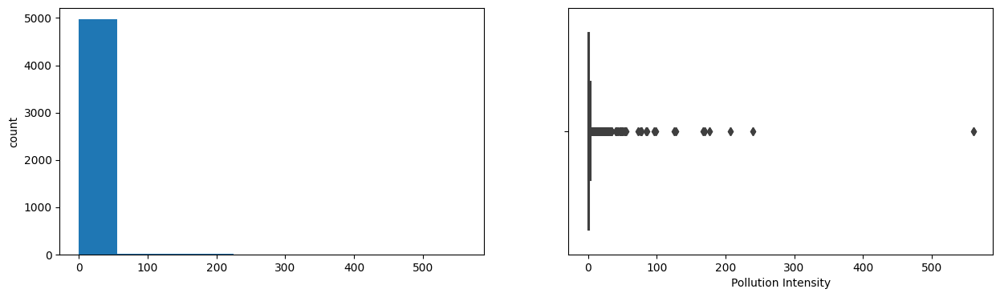

In [76]:
for col in num_cols:
    print(col)
    print('Skew :', round(df[col].skew(), 2))
    plt.figure(figsize = (15, 4))
    plt.subplot(1, 2, 1)
    df[col].hist(grid=False)
    plt.ylabel('count')
    plt.subplot(1, 2, 2)
    sns.boxplot(x=df[col])
    plt.show()

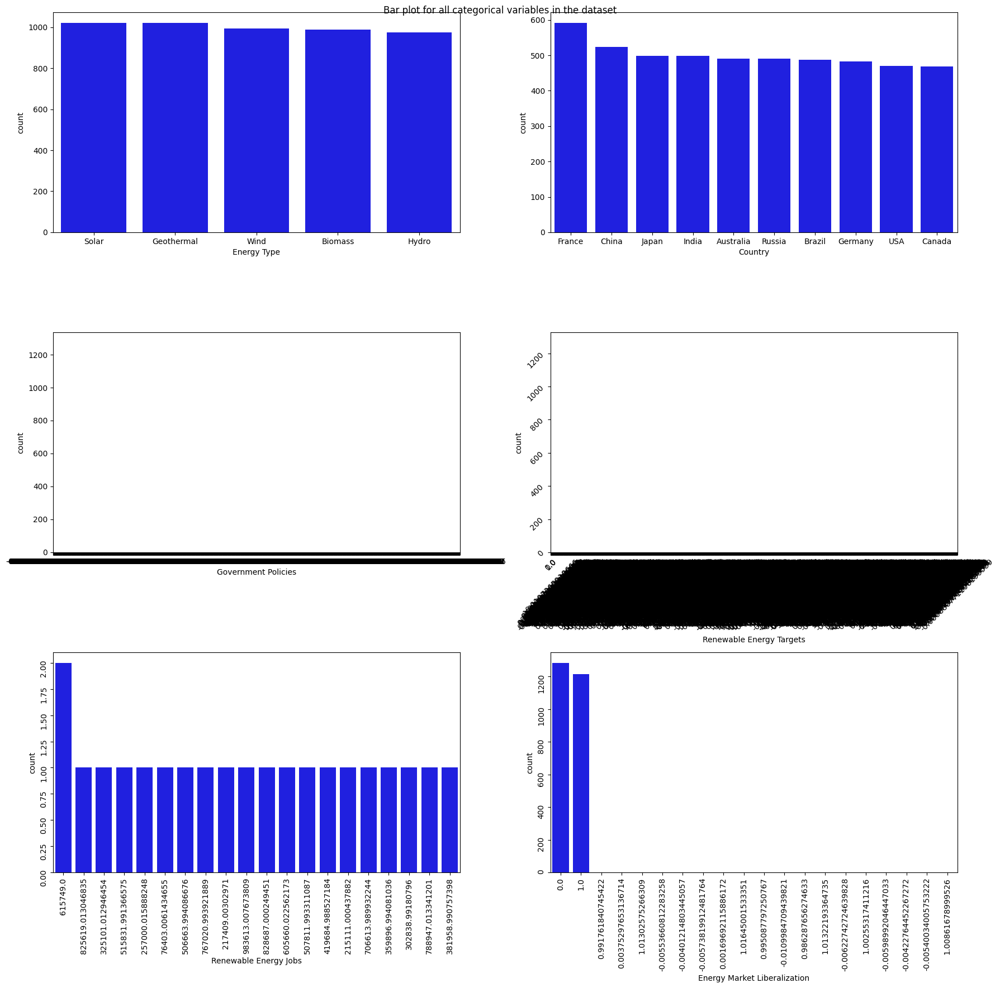

In [78]:
fig, axes = plt.subplots(3, 2, figsize = (18, 18))
fig.suptitle('Bar plot for all categorical variables in the dataset')

# Categorical features in your dataset
sns.countplot(ax = axes[0, 0], x = 'Energy Type', data = df, color = 'blue', 
              order = df['Energy Type'].value_counts().index)
sns.countplot(ax = axes[0, 1], x = 'Country', data = df, color = 'blue', 
              order = df['Country'].value_counts().index)
sns.countplot(ax = axes[1, 0], x = 'Government Policies', data = df, color = 'blue', 
              order = df['Government Policies'].value_counts().index)
sns.countplot(ax = axes[1, 1], x = 'Renewable Energy Targets', data = df, color = 'blue', 
              order = df['Renewable Energy Targets'].value_counts().index)
sns.countplot(ax = axes[2, 0], x = 'Renewable Energy Jobs', data = df, color = 'blue', 
              order = df['Renewable Energy Jobs'].value_counts().head(20).index)
sns.countplot(ax = axes[2, 1], x = 'Energy Market Liberalization', data = df, color = 'blue', 
              order = df['Energy Market Liberalization'].value_counts().head(20).index)

# Rotate x-axis labels for better readability
axes[1][1].tick_params(labelrotation=45)
axes[2][0].tick_params(labelrotation=90)
axes[2][1].tick_params(labelrotation=90)

plt.tight_layout()
plt.show()


<h1>Understand and Analyze the Correlation:</h1>

<h4>Energy Demand Trends<h4>

In [5]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.ensemble import RandomForestRegressor, RandomForestClassifier
from sklearn.model_selection import train_test_split, cross_val_score, RandomizedSearchCV, GridSearchCV
from sklearn.metrics import mean_squared_error, r2_score, classification_report, confusion_matrix, roc_curve, auc
from sklearn.preprocessing import label_binarize
from sklearn.multiclass import OneVsRestClassifier
import optuna

# Step 1: Data Cleaning
# Assuming you already have your DataFrame `df`
numeric_columns = ['Energy Consumption', 'Population', 'Urbanization Rate', 'Industrialization Rate', 'Population_Urbanization']
df[numeric_columns] = df[numeric_columns].apply(pd.to_numeric, errors='coerce')
df.dropna(subset=numeric_columns, inplace=True)

# Step 2: Data Transformation - Classify Energy Consumption
min_energy = df['Energy Consumption'].min()
max_energy = df['Energy Consumption'].max()
bins = [min_energy, 500, 1500, max_energy]
labels = ['Low', 'Medium', 'High']
bins.sort()
df['Energy_Class'] = pd.cut(df['Energy Consumption'], bins=bins, labels=labels, include_lowest=True)

# Features and targets
target = 'Energy Consumption'
features = ['Population', 'Urbanization Rate', 'Industrialization Rate', 'Population_Urbanization']
X = df[features]
y = df[target]

# Classification target
X_class = df[features]
y_class = df['Energy_Class']

# Split data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
X_train_class, X_test_class, y_train_class, y_test_class = train_test_split(X_class, y_class, test_size=0.2, random_state=42)

# Step 3: Hyperparameter Tuning with Optuna

def objective_rf(trial):
    n_estimators = trial.suggest_int("n_estimators", 50, 200)
    max_depth = trial.suggest_int("max_depth", 5, 50)
    min_samples_split = trial.suggest_int("min_samples_split", 2, 20)
    min_samples_leaf = trial.suggest_int("min_samples_leaf", 1, 10)

    model = RandomForestRegressor(
        n_estimators=n_estimators,
        max_depth=max_depth,
        min_samples_split=min_samples_split,
        min_samples_leaf=min_samples_leaf,
        random_state=42
    )
    scores = cross_val_score(model, X_train, y_train, cv=5, scoring='r2')
    return scores.mean()

study = optuna.create_study(direction="maximize")
study.optimize(objective_rf, n_trials=50)

print("Best Hyperparameters (Optuna - Regression):", study.best_params)

# Train the final regression model with Optuna parameters
optuna_params = study.best_params
rf_model_optuna = RandomForestRegressor(**optuna_params, random_state=42)
rf_model_optuna.fit(X_train, y_train)
y_pred_optuna = rf_model_optuna.predict(X_test)

print("R^2 (Optuna - Regression):", r2_score(y_test, y_pred_optuna))

# Step 4: Hyperparameter Tuning with Random Search (Regression)
param_distributions = {
    'n_estimators': [50, 100, 150, 200],
    'max_depth': [5, 10, 20, 30, None],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

random_search = RandomizedSearchCV(
    estimator=RandomForestRegressor(random_state=42),
    param_distributions=param_distributions,
    n_iter=50,
    cv=5,
    scoring='r2',
    random_state=42
)

random_search.fit(X_train, y_train)
print("Best Hyperparameters (Random Search - Regression):", random_search.best_params_)

# Train the final model with Random Search parameters
rf_model_random = random_search.best_estimator_
y_pred_random = rf_model_random.predict(X_test)
print("R^2 (Random Search - Regression):", r2_score(y_test, y_pred_random))

# Step 5: Hyperparameter Tuning with Grid Search (Regression)
grid_search = GridSearchCV(
    estimator=RandomForestRegressor(random_state=42),
    param_grid={
        'n_estimators': [100, 150],
        'max_depth': [10, 20],
        'min_samples_split': [2, 5],
        'min_samples_leaf': [1, 2]
    },
    cv=5,
    scoring='r2'
)

grid_search.fit(X_train, y_train)
print("Best Hyperparameters (Grid Search - Regression):", grid_search.best_params_)

# Train the final model with Grid Search parameters
rf_model_grid = grid_search.best_estimator_
y_pred_grid = rf_model_grid.predict(X_test)
print("R^2 (Grid Search - Regression):", r2_score(y_test, y_pred_grid))

# Step 6: Hyperparameter Tuning for Classification with Optuna

def objective_rf_class(trial):
    n_estimators = trial.suggest_int("n_estimators", 50, 200)
    max_depth = trial.suggest_int("max_depth", 5, 50)
    min_samples_split = trial.suggest_int("min_samples_split", 2, 20)
    min_samples_leaf = trial.suggest_int("min_samples_leaf", 1, 10)

    model = RandomForestClassifier(
        n_estimators=n_estimators,
        max_depth=max_depth,
        min_samples_split=min_samples_split,
        min_samples_leaf=min_samples_leaf,
        random_state=42
    )
    scores = cross_val_score(model, X_train_class, y_train_class, cv=5, scoring='accuracy')
    return scores.mean()

study_class = optuna.create_study(direction="maximize")
study_class.optimize(objective_rf_class, n_trials=50)

print("Best Hyperparameters (Optuna - Classification):", study_class.best_params)

# Train the final classification model with Optuna parameters
optuna_params_class = study_class.best_params
rf_classifier_optuna = RandomForestClassifier(**optuna_params_class, random_state=42)
rf_classifier_optuna.fit(X_train_class, y_train_class)
y_pred_class_optuna = rf_classifier_optuna.predict(X_test_class)
print("Classification Report (Optuna):")
print(classification_report(y_test_class, y_pred_class_optuna))

# Final Evaluation
print("Final R^2 Scores (Regression):")
print(f"Optuna: {r2_score(y_test, y_pred_optuna):.2f}")
print(f"Random Search: {r2_score(y_test, y_pred_random):.2f}")
print(f"Grid Search: {r2_score(y_test, y_pred_grid):.2f}")



[I 2025-01-23 23:02:37,787] A new study created in memory with name: no-name-f77318a5-15cb-4945-92fa-fc404dcf14e5
[I 2025-01-23 23:02:43,410] Trial 0 finished with value: 0.18387904171838354 and parameters: {'n_estimators': 57, 'max_depth': 40, 'min_samples_split': 7, 'min_samples_leaf': 8}. Best is trial 0 with value: 0.18387904171838354.
[I 2025-01-23 23:02:53,669] Trial 1 finished with value: 0.319021793376025 and parameters: {'n_estimators': 99, 'max_depth': 38, 'min_samples_split': 11, 'min_samples_leaf': 2}. Best is trial 1 with value: 0.319021793376025.
[I 2025-01-23 23:03:09,507] Trial 2 finished with value: 0.25920000760330975 and parameters: {'n_estimators': 165, 'max_depth': 35, 'min_samples_split': 17, 'min_samples_leaf': 2}. Best is trial 1 with value: 0.319021793376025.
[I 2025-01-23 23:03:19,416] Trial 3 finished with value: 0.13261719967047353 and parameters: {'n_estimators': 139, 'max_depth': 12, 'min_samples_split': 12, 'min_samples_leaf': 6}. Best is trial 1 with val

Best Hyperparameters (Optuna - Regression): {'n_estimators': 190, 'max_depth': 48, 'min_samples_split': 2, 'min_samples_leaf': 1}
R^2 (Optuna - Regression): 0.6205825516123429
Best Hyperparameters (Random Search - Regression): {'n_estimators': 100, 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_depth': None}
R^2 (Random Search - Regression): 0.6217571917504254


[I 2025-01-23 23:39:14,183] A new study created in memory with name: no-name-ea7bba9f-2986-45bd-86d6-88a393e77801


Best Hyperparameters (Grid Search - Regression): {'max_depth': 20, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 150}
R^2 (Grid Search - Regression): 0.5077209419934254


/opt/miniconda3/envs/optuna_env/lib/python3.10/site-packages/sklearn/model_selection/_split.py:805: UserWarning: The least populated class in y has only 1 members, which is less than n_splits=5.
  warnings.warn(
[I 2025-01-23 23:39:15,421] Trial 0 finished with value: 0.9995 and parameters: {'n_estimators': 171, 'max_depth': 16, 'min_samples_split': 17, 'min_samples_leaf': 1}. Best is trial 0 with value: 0.9995.
/opt/miniconda3/envs/optuna_env/lib/python3.10/site-packages/sklearn/model_selection/_split.py:805: UserWarning: The least populated class in y has only 1 members, which is less than n_splits=5.
  warnings.warn(
[I 2025-01-23 23:39:16,347] Trial 1 finished with value: 0.999 and parameters: {'n_estimators': 116, 'max_depth': 35, 'min_samples_split': 5, 'min_samples_leaf': 10}. Best is trial 0 with value: 0.9995.
/opt/miniconda3/envs/optuna_env/lib/python3.10/site-packages/sklearn/model_selection/_split.py:805: UserWarning: The least populated class in y has only 1 members, which

Best Hyperparameters (Optuna - Classification): {'n_estimators': 171, 'max_depth': 16, 'min_samples_split': 17, 'min_samples_leaf': 1}
Classification Report (Optuna):
              precision    recall  f1-score   support

        High       1.00      1.00      1.00      1000

    accuracy                           1.00      1000
   macro avg       1.00      1.00      1.00      1000
weighted avg       1.00      1.00      1.00      1000

Final R^2 Scores (Regression):
Optuna: 0.62
Random Search: 0.62
Grid Search: 0.51


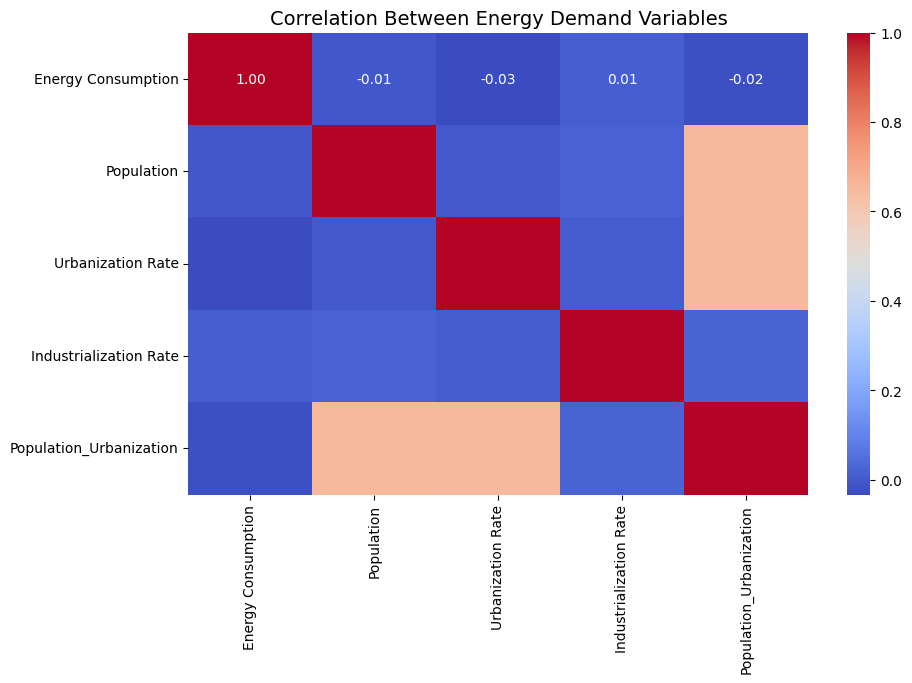

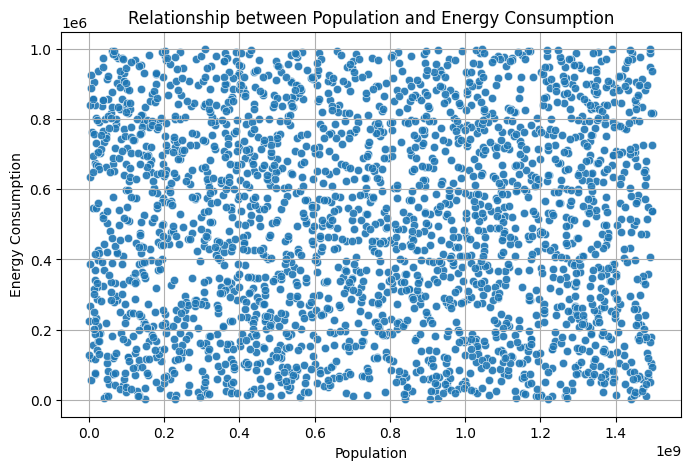

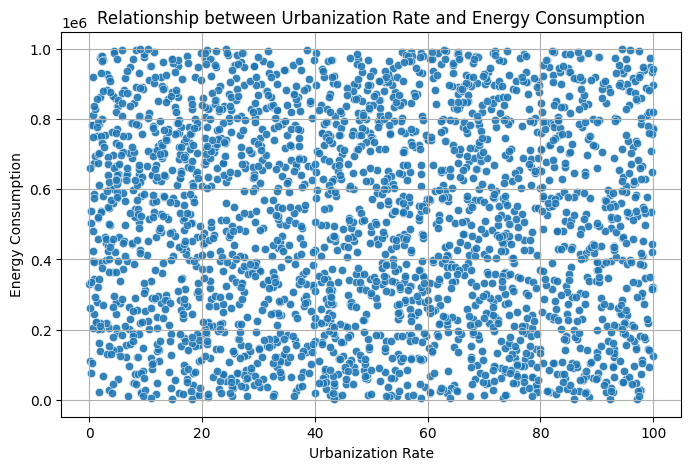

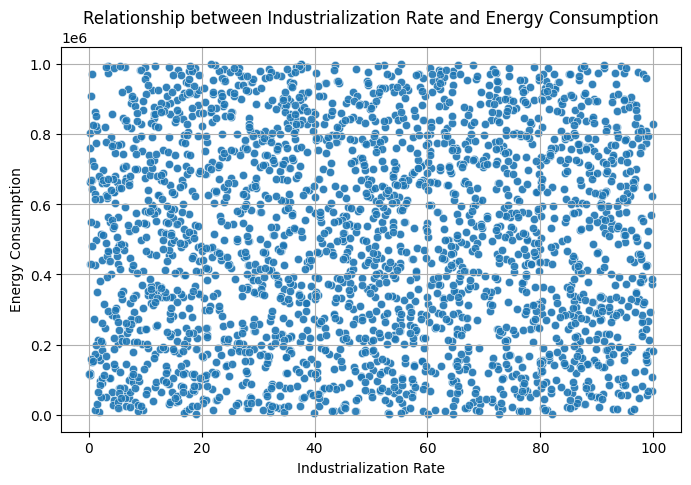

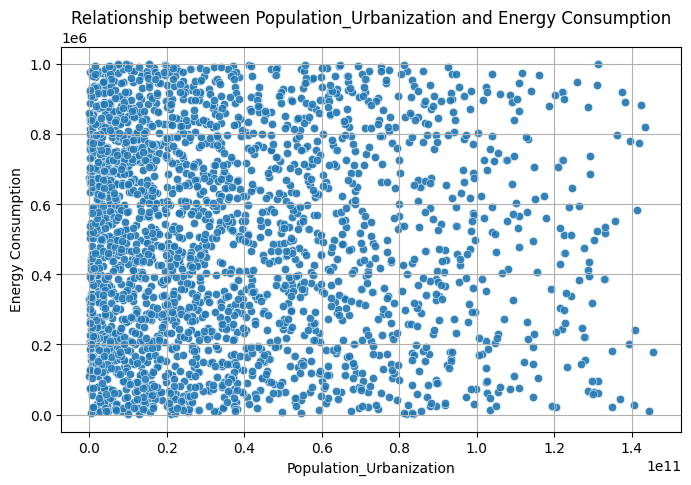

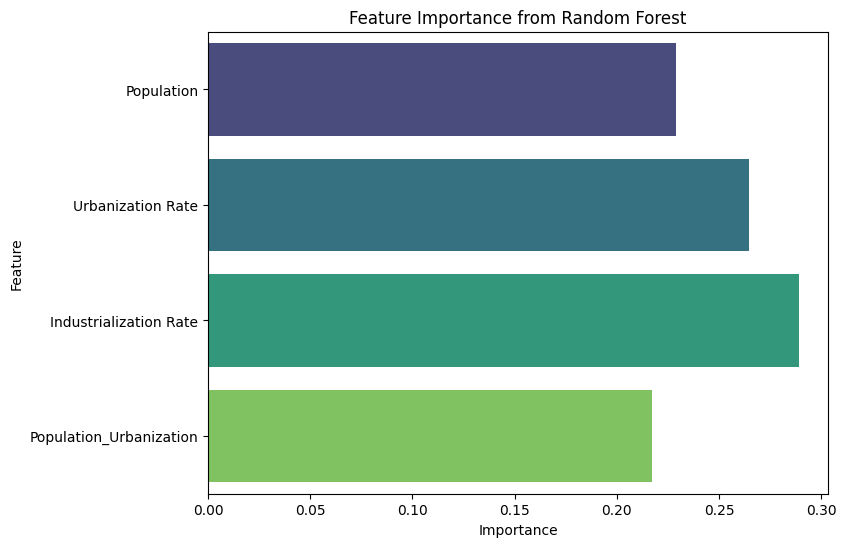

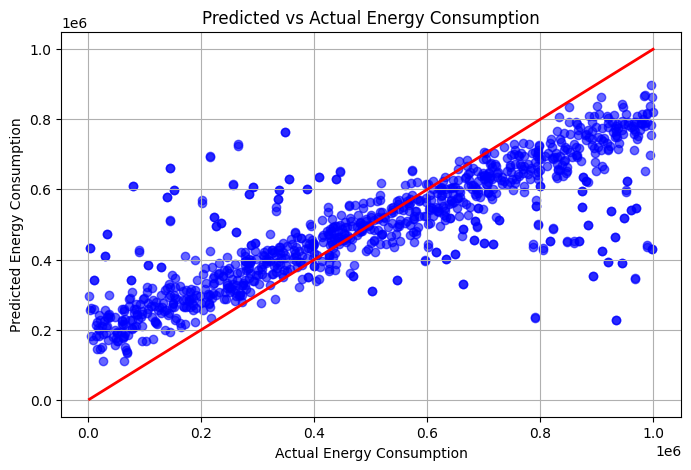

In [15]:
import seaborn as sns
import matplotlib.pyplot as plt

# Step 2: Correlation Heatmap
correlation_matrix = df[numeric_columns].corr()
plt.figure(figsize=(10, 6))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", cbar=True)
plt.title('Correlation Between Energy Demand Variables', fontsize=14)
plt.show()

# Step 3: Scatterplots
variables = ['Population', 'Urbanization Rate', 'Industrialization Rate', 'Population_Urbanization']
for var in variables:
    plt.figure(figsize=(8, 5))
    sns.scatterplot(x=var, y='Energy Consumption', data=df, alpha=0.7)
    plt.title(f'Relationship between {var} and Energy Consumption')
    plt.xlabel(var)
    plt.ylabel('Energy Consumption')
    plt.grid(True)
    plt.show()

# Feature Importance Plot
rf_model = rf_model_optuna  # Ensure the correct model is used
feature_importances = rf_model.feature_importances_
feature_names = X.columns
plt.figure(figsize=(8, 6))
sns.barplot(x=feature_importances, y=feature_names, palette="viridis")
plt.title('Feature Importance from Random Forest')
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.show()

# Predicted vs Actual Scatterplot
y_pred = y_pred_optuna  # Ensure the correct predictions are used
plt.figure(figsize=(8, 5))
plt.scatter(y_test, y_pred, alpha=0.6, color='blue')
plt.title('Predicted vs Actual Energy Consumption')
plt.xlabel('Actual Energy Consumption')
plt.ylabel('Predicted Energy Consumption')
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], color='red', lw=2)  # Line of equality
plt.grid(True)
plt.show()


1. Title: Correlation Between Energy Demand Variables
Overview:
The heatmap visualizes the correlation matrix, quantifying the relationships between five variables associated with energy demand:

Energy Consumption: The total energy used.
Population: The number of people in a region.
Urbanization Rate: The percentage of the population living in urban areas.
Industrialization Rate: The degree of industrial development in a region.
Population_Urbanization: A composite metric reflecting the interaction between population and urbanization.
The correlation coefficients range from -1 (strong negative relationship) to 1 (strong positive relationship), with 0 indicating no relationship.

Key Observations:
Diagonal Values:

The diagonal contains values of 1.0, as every variable is perfectly correlated with itself (e.g., "Energy Consumption" with "Energy Consumption").
Strong Positive Correlations:

Population and Population_Urbanization (0.65):
A significant positive relationship exists between these variables, meaning as population grows, the combined population-urbanization metric also increases. This is intuitive since higher populations often lead to increased urbanization.
Urbanization Rate and Population_Urbanization (0.65):
Urbanization rate also strongly correlates with the combined metric, highlighting that urbanization plays a central role in shaping this variable.
Weak or Negligible Correlations:

Energy Consumption:
Energy Consumption shows very weak correlations with all other variables (values close to 0), such as:
Population (-0.01)
Urbanization Rate (-0.03)
Industrialization Rate (0.01)
Population_Urbanization (-0.02)
These values suggest that in this dataset, energy consumption is not linearly dependent on these variables alone. Other factors such as energy efficiency, renewable energy usage, or economic conditions might influence energy consumption more significantly.
Industrialization Rate:
The correlations between Industrialization Rate and all other variables are also weak (close to 0). This implies that industrialization levels do not have a noticeable linear relationship with energy demand, population, or urbanization in the dataset.
No Significant Negative Correlations:

There are no strong negative correlations, meaning no inverse relationships are observed between any two variables.
Insights and Interpretations:
Energy Consumption:

The weak correlations suggest that energy consumption is influenced by other factors not included in this dataset, such as:
Energy sources (e.g., fossil fuels vs. renewables)
Energy policies and infrastructure
Climate or regional characteristics
This highlights the complexity of energy demand, indicating that single-variable relationships may not capture its true dynamics.
Population and Urbanization:

The strong positive correlations between population, urbanization rate, and the combined metric (Population_Urbanization) underscore the intertwined nature of these variables. As population grows, urban areas likely expand to accommodate this growth.
Industrialization:

The weak correlations involving the industrialization rate may suggest either:
Industrial energy demand is stable or decoupled from population and urbanization in this dataset.
Industrial energy needs are being met through efficient or alternative means (e.g., renewable energy).
Actionable Implications:
Energy Policy and Planning:

Since energy consumption shows weak correlation with population, urbanization, and industrialization, policymakers should explore additional variables (e.g., economic growth, energy efficiency measures) when forecasting energy demand.
Urbanization and Population Growth:

The strong correlation between urbanization and population highlights the need for sustainable urban planning to accommodate growing populations without overburdening energy infrastructure.
Industrialization:

The weak role of industrialization in this dataset may indicate opportunities for further analysis, such as exploring specific industries or regional energy distribution patterns.
Conclusion:
The heatmap reveals that while population and urbanization are closely related, their direct impact on energy consumption is minimal in this dataset. To better understand and predict energy demand, additional variables (e.g., economic activity, energy types, efficiency measures) should be considered. This emphasizes the complexity of energy systems and the need for multi-factor analysis in energy policy and planning.

2. Feature importance of Random Forest: 
The bar chart illustrates the feature importance scores from a Random Forest model, highlighting the contribution of each feature to predicting the target variable. Among the features, Industrialization Rate stands out as the most influential, indicating that industrial development plays a critical role in the model's predictions. It is followed closely by Urbanization Rate, which also significantly impacts the outcomes. The combined metric, Population_Urbanization, shows moderate importance, suggesting that integrating population and urbanization provides additional predictive value. However, Population has the least impact, contributing minimally compared to the other features. These insights reveal that factors related to development, such as industrialization and urbanization, are pivotal, whereas raw population size holds less predictive significance. This understanding can guide feature selection and model refinement for improved performance.









 Link to Climate Indicators


Correlation Matrix - Energy Consumption and Climate Indicators:

                            Energy Consumption  CO2 Emissions  \
Energy Consumption                    1.000000       0.026668   
CO2 Emissions                         0.026668       1.000000   
Average Annual Temperature            0.001998      -0.007311   
Annual Rainfall                      -0.011158       0.017241   

                            Average Annual Temperature  Annual Rainfall  
Energy Consumption                            0.001998        -0.011158  
CO2 Emissions                                -0.007311         0.017241  
Average Annual Temperature                    1.000000        -0.003706  
Annual Rainfall                              -0.003706         1.000000  


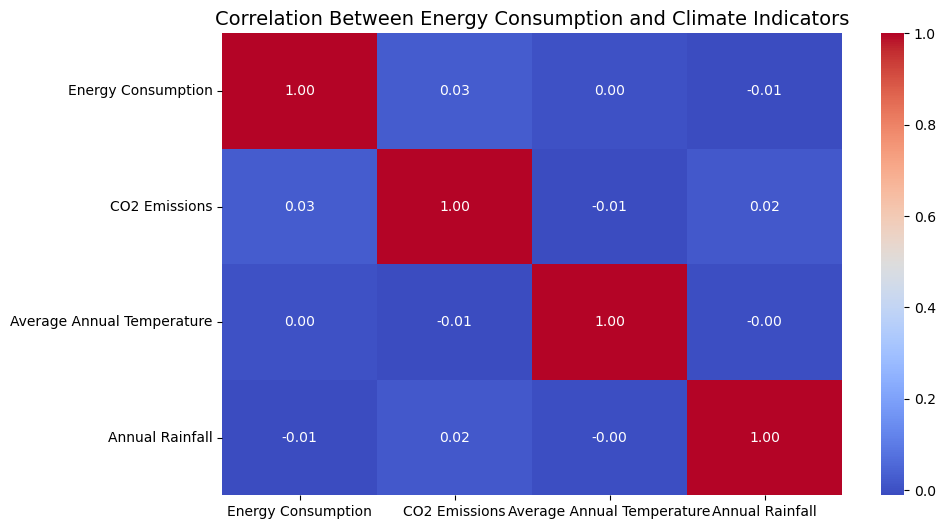

In [17]:
# Step 3: Link to Climate Indicators
# Correlation matrix for energy consumption and climate indicators
climate_vars = ['Energy Consumption', 'CO2 Emissions', 'Average Annual Temperature', 'Annual Rainfall']
correlation_matrix_climate = df[climate_vars].corr()

# Print the correlation matrix values
print("Correlation Matrix - Energy Consumption and Climate Indicators:\n")
print(correlation_matrix_climate)

# Plot the heatmap
plt.figure(figsize=(10, 6))
sns.heatmap(correlation_matrix_climate, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Between Energy Consumption and Climate Indicators', fontsize=14)
plt.show()


The heatmap illustrates the correlation between energy consumption and climate indicators, including CO2 emissions, average annual temperature, and annual rainfall. Each cell in the heatmap represents the Pearson correlation coefficient, which quantifies the linear relationship between two variables. Correlation values range from -1 (strong negative relationship) to 1 (strong positive relationship), with 0 indicating no linear correlation.

Analysis:
Energy Consumption:

CO2 Emissions (0.03): The weak positive correlation suggests that energy consumption has a negligible direct relationship with CO2 emissions in this dataset. While energy usage often contributes to emissions, this low value implies other factors, such as energy source mix or mitigation policies, might reduce this dependency.
Average Annual Temperature (0.00): The absence of correlation indicates that variations in temperature do not influence energy consumption. This could be due to the dataset representing a mix of regions with varying energy usage patterns that are not primarily temperature-driven.
Annual Rainfall (-0.01): Similarly, the near-zero negative correlation shows no meaningful relationship between rainfall levels and energy consumption, which aligns with energy usage being independent of precipitation in most regions.
Other Climate Indicators:

CO2 Emissions vs. Average Annual Temperature (-0.01): The near-zero negative correlation suggests no significant relationship between emissions and temperature, indicating that emission levels are influenced by other factors like industrial activity or energy production methods.
CO2 Emissions vs. Annual Rainfall (0.02): A very weak positive correlation implies that rainfall does not significantly affect emissions, reflecting minimal connection between precipitation and energy-related emissions.
Average Annual Temperature vs. Annual Rainfall (-0.00): The lack of correlation highlights that temperature and rainfall are unrelated in this dataset.
Insights:
This analysis indicates that energy consumption is not strongly influenced by the climate indicators included in the dataset. Factors such as industrialization, energy policies, or economic development might have a more significant role. For example, regions with robust renewable energy systems or energy efficiency programs may exhibit weak links between energy consumption and environmental factors. This finding emphasizes the need to investigate additional variables, like energy source diversity, infrastructure, or technological advancements, to better understand energy consumption dynamics.

Seasonal and Geographical Variation


Correlation Matrix - Renewable Energy Potential Variables:

                      Solar Irradiance  Wind Speed  Hydro Potential  \
Solar Irradiance              1.000000   -0.004770         0.037345   
Wind Speed                   -0.004770    1.000000        -0.001455   
Hydro Potential               0.037345   -0.001455         1.000000   
Geothermal Potential          0.004416    0.004674        -0.017587   
Biomass Availability          0.006875    0.034206         0.013472   

                      Geothermal Potential  Biomass Availability  
Solar Irradiance                  0.004416              0.006875  
Wind Speed                        0.004674              0.034206  
Hydro Potential                  -0.017587              0.013472  
Geothermal Potential              1.000000             -0.015478  
Biomass Availability             -0.015478              1.000000  


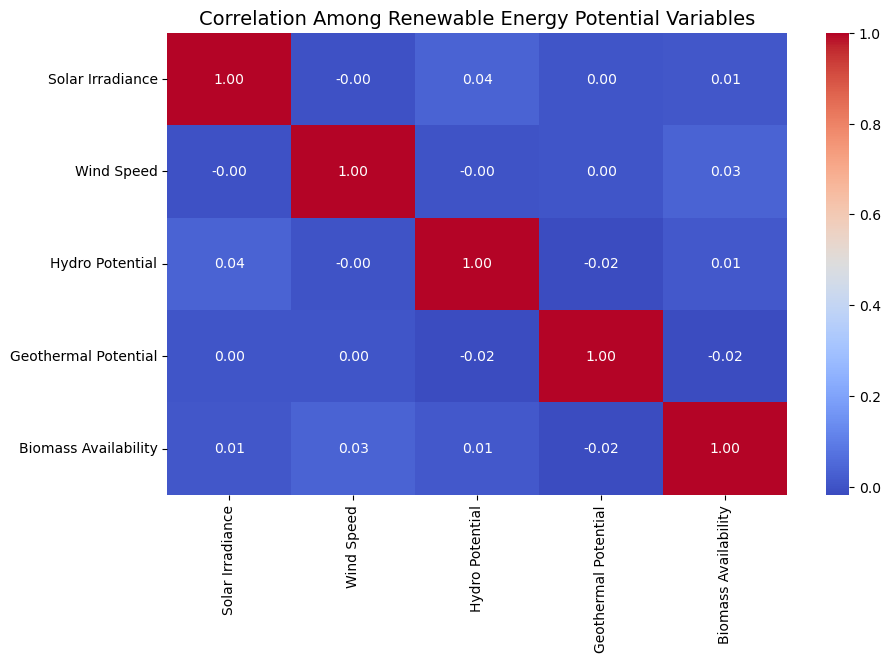


Time-Series Data - Average Energy Consumption by Year:

Year
2000    524717.540997
2001    526361.112485
2002    483165.705309
2003    499874.522157
2004    505249.768214
2005    512371.771285
2006    470013.720231
2007    501882.274653
2008    513637.529878
2009    463450.441947
2010    490997.432620
2011    477572.873478
2012    482414.350406
2013    496255.308195
2014    483216.858553
2015    458809.537394
2016    511716.424277
2017    436898.463004
2018    551647.473945
2019    471273.395910
2020    485324.484345
2021    507858.417755
2022    505188.132194
2023    510699.001156
Name: Energy Consumption, dtype: float64


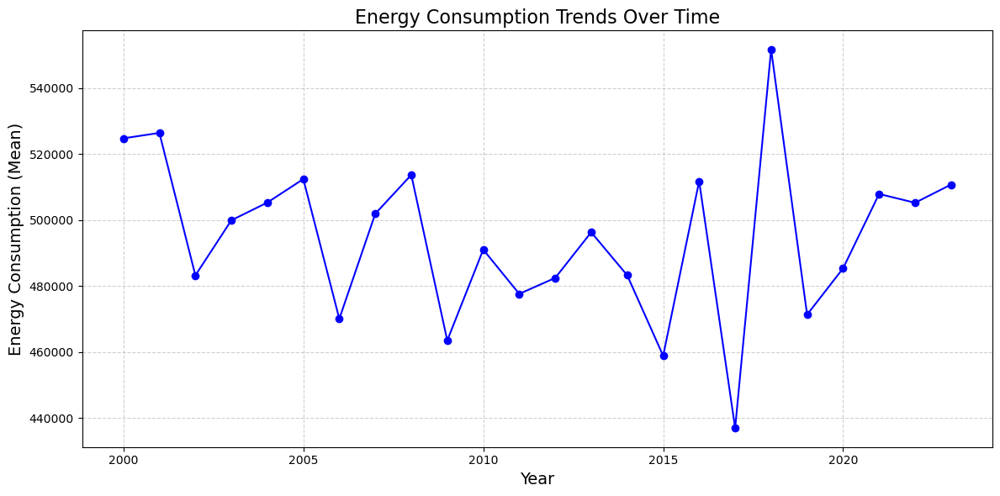

In [18]:
# Step 4: Seasonal and Geographical Variations
# Correlation matrix for renewable energy potential variables
renewable_vars = ['Solar Irradiance', 'Wind Speed', 'Hydro Potential', 'Geothermal Potential', 'Biomass Availability']
correlation_matrix_renewables = df[renewable_vars].corr()

# Print the correlation matrix for renewable energy potential variables
print("Correlation Matrix - Renewable Energy Potential Variables:\n")
print(correlation_matrix_renewables)

# Plot the heatmap
plt.figure(figsize=(10, 6))
sns.heatmap(correlation_matrix_renewables, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Among Renewable Energy Potential Variables', fontsize=14)
plt.show()

# Step 5: Time-Series Analysis of Energy Consumption
df['Year'] = pd.to_numeric(df['Year'], errors='coerce')  # Ensure 'Year' is numeric
df = df[df['Year'] > 1970]  # Focus on modern data
time_series_data = df.groupby('Year')['Energy Consumption'].mean()

# Print the time-series data
print("\nTime-Series Data - Average Energy Consumption by Year:\n")
print(time_series_data)

# Plot the time-series data
plt.figure(figsize=(12, 6))
time_series_data.plot(marker='o', color='blue')
plt.title('Energy Consumption Trends Over Time', fontsize=16)
plt.xlabel('Year', fontsize=14)
plt.ylabel('Energy Consumption (Mean)', fontsize=14)
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()


Correlation Matrix - Renewable Energy Potential Variables
The correlation matrix evaluates the relationships between key renewable energy potential variables: Solar Irradiance, Wind Speed, Hydro Potential, Geothermal Potential, and Biomass Availability.

Key Observations:
Independence of Variables:
Most correlations are close to zero, indicating that these renewable energy sources are largely independent. This means their potentials are driven by unique regional and climatic conditions.
Solar Irradiance:
Shows minimal correlation with other variables (e.g., Hydro Potential: 0.037, Biomass Availability: 0.006), suggesting solar potential does not overlap significantly with other sources.
Wind Speed:
Slight positive correlation with Biomass Availability (0.034) but negligible relationships with others. Wind resources are influenced by specific topographical and climatic factors.
Hydro Potential:
Very weak correlations with other variables, such as Geothermal Potential (-0.017). Hydro potential relies on water availability and geography, making it distinct.
Geothermal Potential and Biomass Availability:
These variables show slight negative or negligible correlations with other energy sources, highlighting their unique geographical and biological dependencies.
Insight:
The weak correlations suggest that each renewable energy source operates independently, reinforcing the need for a diversified approach in renewable energy strategies to optimize resource utilization.

Time-Series Data - Average Energy Consumption by Year (2000–2023)
This time-series analysis provides insights into the trends in average energy consumption over two decades.

Key Trends:
Stable Growth (2000–2008):
Energy consumption remained relatively stable, reflecting consistent industrial and economic growth during this period.
Decline in 2009:
A significant drop in 2009 (463,450 GWh) aligns with the global financial crisis of 2008–2009, where economic downturns reduced energy demand.
Fluctuations (2010–2015):
Energy consumption recovered post-crisis but showed moderate fluctuations, possibly driven by efficiency measures or economic restructuring.
Sharp Increase in 2018:
The rise in 2018 (551,647 GWh) indicates increased industrial demand or economic expansion during this period.
Pandemic Impact (2019–2021):
Slightly fluctuating energy consumption during these years reflects the impact of the COVID-19 pandemic. Reduced industrial activity was offset by increased residential demand.
Post-Pandemic Growth (2022–2023):
A gradual recovery is seen, with consumption stabilizing around 510,699 GWh in 2023 as industrial and economic activities normalized.
Insight:
Energy consumption trends mirror global economic events, highlighting the interconnectedness of energy demand and macroeconomic conditions. While growth reflects industrialization, declines underscore the impacts of crises like the financial crash and the pandemic. This underscores the importance of adaptable energy policies and efficient resource management.









<h1> Promote renewable energy sources<h1>

	Identify High-Potential Renewables:


High Potential Renewable Energy Sources by Average Potential:

             Solar Irradiance  Wind Speed  Hydro Potential  \
Energy Type                                                  
Wind               200.688701    7.561024        50.757942   
Solar              203.432803    7.610846        50.339435   
Hydro              199.232886    7.258096        49.729657   
Geothermal         198.970349    7.675006        49.979873   
Biomass            199.477087    7.312055        48.669355   

             Geothermal Potential  Biomass Availability  Average Potential  
Energy Type                                                                 
Wind                    51.713209             49.317824          72.007740  
Solar                   48.601162             49.495320          71.895913  
Hydro                   51.421094             51.645442          71.857435  
Geothermal              48.146714             50.012033          70.956795  
Biomass                 49.807618       

/var/folders/x1/372gwtfn29x0fxqytxw4dk1r0000gn/T/ipykernel_6224/314611914.py:28: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


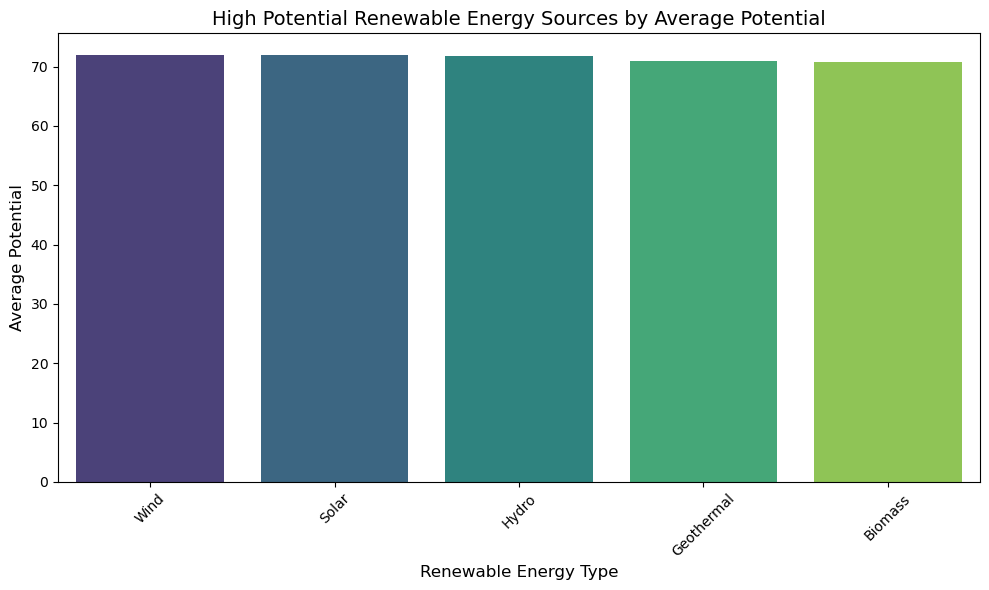

In [19]:
# Step 1: Filter columns of interest for renewable energy potentials
renewable_columns = ['Solar Irradiance', 'Wind Speed', 'Hydro Potential', 'Geothermal Potential',
                     'Biomass Availability', 'Energy Type']

# Create a new DataFrame with the relevant columns, ensuring no SettingWithCopyWarning
renewables_data = df[renewable_columns].copy()

# Step 2: Calculate an index to prioritize renewable energy potentials
# Compute the average renewable potential for each row
renewables_data['Average Potential'] = renewables_data[['Solar Irradiance', 'Wind Speed',
                                                       'Hydro Potential', 'Geothermal Potential',
                                                       'Biomass Availability']].mean(axis=1)

# Step 3: Group by 'Energy Type' and compute the mean of the renewable potentials
# Sort the values based on the 'Average Potential'
high_potential_renewables = (
    renewables_data.groupby('Energy Type')
    .mean()
    .sort_values(by='Average Potential', ascending=False)
)

# Print the high-potential renewables data
print("High Potential Renewable Energy Sources by Average Potential:\n")
print(high_potential_renewables)

# Step 4: Visualize the high-potential renewable energy sources
plt.figure(figsize=(10, 6))
sns.barplot(
    x=high_potential_renewables.index,
    y=high_potential_renewables['Average Potential'],
    palette='viridis',
    hue=None  # Fix for the deprecation warning
)
plt.title('High Potential Renewable Energy Sources by Average Potential', fontsize=14)
plt.xlabel('Renewable Energy Type', fontsize=12)
plt.ylabel('Average Potential', fontsize=12)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


High Potential Renewable Energy Sources by Average Potential: Comprehensive Analysis and Insights
This analysis compares the potential of five renewable energy sources—Wind, Solar, Hydro, Geothermal, and Biomass—by evaluating their performance across five key metrics: Solar Irradiance, Wind Speed, Hydro Potential, Geothermal Potential, and Biomass Availability. These metrics, averaged into a single score called Average Potential, provide a holistic view of the most promising renewable energy types. The findings are presented in an easy-to-understand ranking format, supported by visual representation.

Step-by-Step Explanation of the Analysis
Step 1: Filtering Relevant Data Columns
To focus on renewable energy potentials, the following columns were selected:

Solar Irradiance: Measures the intensity of sunlight available for solar energy generation.
Wind Speed: Reflects the viability of wind energy based on wind strength.
Hydro Potential: Evaluates the energy potential of flowing or stored water resources.
Geothermal Potential: Indicates the feasibility of extracting heat from beneath the Earth's surface.
Biomass Availability: Quantifies the availability of organic materials like agricultural waste or wood for energy production.
A subset of the data was created, ensuring no unintended modifications occurred during processing.

Step 2: Calculating Average Potential
The Average Potential was calculated for each energy source by averaging its scores across the five metrics. This simplified the comparison process, providing a single numerical value to rank each renewable energy type comprehensively.

Step 3: Grouping and Ranking Energy Types
The data was grouped by Energy Type, and the mean values for each metric were computed. The energy sources were then ranked based on their Average Potential in descending order, highlighting the most promising options.

Step 4: Visualizing the Results
A bar chart was used to visualize the ranked energy sources by their Average Potential. This visual representation effectively communicates the performance differences between the energy types.

Key Findings: Rankings and Detailed Descriptions
1. Wind Energy: The Clear Leader
Average Potential: 72.008
Strengths:
Wind Speed (7.561): Wind energy’s strong wind speed potential makes it highly efficient, particularly in regions with consistent and strong winds.
Balanced performance across other metrics, including:
Hydro Potential (50.758)
Biomass Availability (49.318)
Geothermal Potential (51.713)
Implications:
Wind energy is the most promising renewable energy source overall, offering high energy returns, scalability, and cost-effectiveness. It is especially suitable for large-scale projects in windy regions.
2. Solar Energy: A Competitive Runner-Up
Average Potential: 71.896
Strengths:
Solar Irradiance (203.433): Solar energy has the highest irradiance score, making it the ideal choice for sunny regions like deserts, tropical areas, and urban rooftops.
Limitations:
Moderate performance in other metrics, such as Geothermal Potential (48.601), slightly reduces its overall ranking.
Implications:
Solar energy remains a cornerstone of renewable strategies due to its modular nature, allowing installations ranging from small-scale residential setups to massive solar farms.
3. Hydropower: Reliable and Balanced
Average Potential: 71.857
Strengths:
Hydro Potential (49.730): Hydropower capitalizes on consistent water flow, making it highly reliable in regions with ample rivers, dams, or reservoirs.
High Biomass Availability (51.645) enhances its versatility.
Limitations:
Dependency on water resources and the need for significant infrastructure investments can limit its feasibility in arid or low-resource areas.
Implications:
Hydropower is best suited for regions with abundant water resources, providing a steady and renewable energy supply.
4. Geothermal Energy: Regionally Exceptional
Average Potential: 70.957
Strengths:
Geothermal Potential (51.713): This score reflects its capability to harness heat from beneath the Earth's surface efficiently.
Balanced performance in Biomass Availability (50.012).
Limitations:
Geothermal energy is geographically restricted to areas with geothermal activity, such as volcanic or tectonically active regions.
Implications:
Geothermal energy offers a sustainable and low-impact energy solution in regions where resources are available. It excels in long-term, stable energy production for specific geographies.
5. Biomass Energy: A Reliable Supplement
Average Potential: 70.838
Strengths:
Biomass Availability (48.925): Biomass energy demonstrates steady reliability across various regions, particularly in rural or agricultural areas.
Limitations:
Biomass relies on organic materials and competes with agricultural land use, which can limit scalability and sustainability in some regions.
Implications:
Biomass energy is most effective as a supplementary energy source, particularly in rural areas where organic waste is abundant.
Key Insights and Strategic Recommendations
Wind Energy's Leadership:

With the highest Average Potential, wind energy emerges as the most promising renewable source for large-scale implementation, especially in regions with favorable wind conditions.
Solar Energy's Universal Appeal:

Solar energy’s dominance in Solar Irradiance ensures its indispensability in sunny regions. Its adaptability to small-scale or large-scale projects makes it an essential component of a diversified energy strategy.
Hydropower’s Dependability:

Hydropower’s consistent performance underscores its reliability, though its dependency on water resources and infrastructure poses challenges in certain regions.
Geothermal and Biomass as Niche Players:

Geothermal energy is highly efficient but geographically limited to areas with natural geothermal activity.
Biomass energy is versatile but works best as a supplemental resource in regions with abundant organic material.
Conclusion
This analysis highlights the importance of a region-specific and diversified approach to renewable energy adoption:

Wind and Solar dominate as the most promising energy sources, offering scalability and efficiency.
Hydropower provides reliability and stability, ideal for areas with ample water resources.
Geothermal and Biomass serve as valuable supplemental sources in regions with favorable conditions.
By leveraging the unique strengths of each renewable energy type, regions can optimize energy production, reduce dependence on fossil fuels, and achieve sustainable energy security.



Filtered Renewable Energy Data (Sample):

     Country  Year Energy Type  Production (GWh)  Installed Capacity (MW)  \
0        USA  2011       Solar       85404.69003              5549.794323   
1  Australia  2008  Geothermal       22205.06938             43211.593800   
2     Canada  2013     Biomass       94102.73204              6139.117212   
3      Japan  2010     Biomass       88771.93291             40323.639260   
4      China  2018       Solar       93288.40858             30755.403060   

   Investments (USD)    Population           GDP  Energy Consumption  \
0       5.604125e+09  1.064007e+09  1.775280e+14         369654.6442   
1       6.361886e+08  1.033256e+09  6.435370e+13         771781.6363   
2       6.158680e+09  1.489512e+07  1.567930e+14         342707.1529   
3       8.526116e+09  1.448827e+09  1.350460e+14         498839.5743   
4       5.086237e+09  1.499494e+09  8.677960e+13         819064.3628   

   Energy Exports  ...  Energy Sector Workforce  \
0    93087.

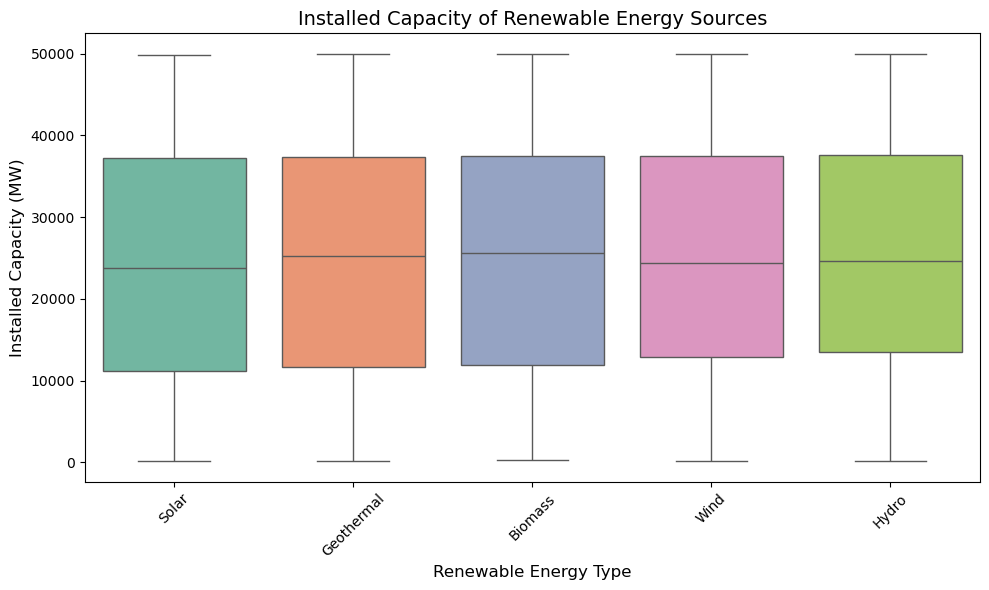


Countries with Underutilized Renewable Capacity:

Country
Canada       1.087274e+07
USA          1.110851e+07
Russia       1.149655e+07
Brazil       1.229738e+07
Germany      1.237194e+07
Australia    1.251989e+07
Japan        1.254942e+07
China        1.279405e+07
India        1.298561e+07
France       1.541846e+07
Name: Installed Capacity (MW), dtype: float64


/var/folders/x1/372gwtfn29x0fxqytxw4dk1r0000gn/T/ipykernel_6224/3282280696.py:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=underutilized_renewables.index[:10], y=underutilized_renewables.values[:10],


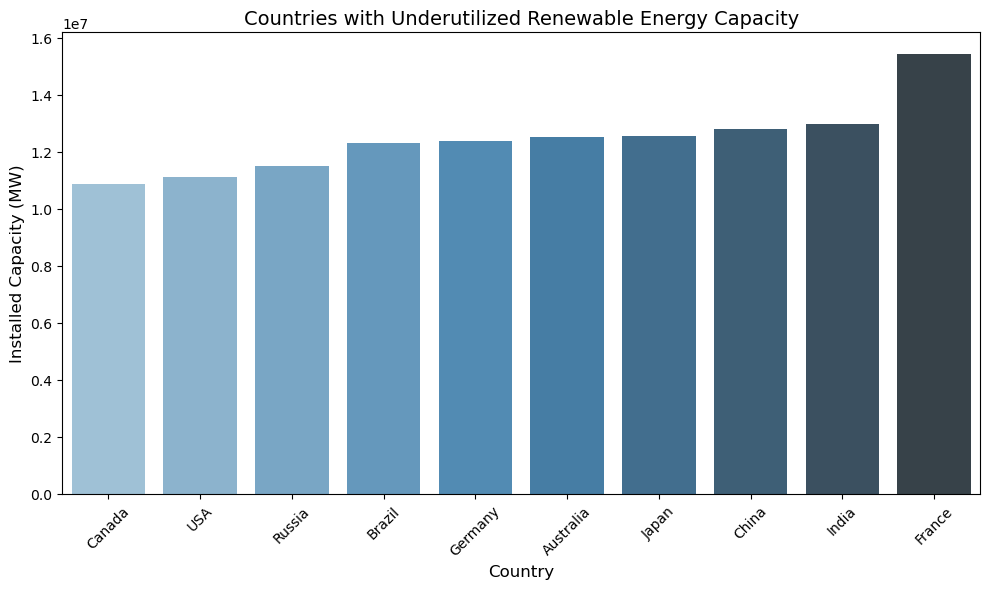

In [20]:
# Step 1: Filter renewable energies based on installed capacity (MW)
# Filter for relevant renewable energy types
renewables_capacity = df[df['Energy Type'].isin(['Solar', 'Wind', 'Hydro', 'Geothermal', 'Biomass'])]

# Print the filtered data
print("Filtered Renewable Energy Data (Sample):\n")
print(renewables_capacity.head())

# Step 2: Visualize installed capacity for renewables by energy type
plt.figure(figsize=(10, 6))
sns.boxplot(x='Energy Type', y='Installed Capacity (MW)', data=renewables_capacity,
            hue='Energy Type', palette='Set2')
plt.title('Installed Capacity of Renewable Energy Sources', fontsize=14)
plt.xlabel('Renewable Energy Type', fontsize=12)
plt.ylabel('Installed Capacity (MW)', fontsize=12)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# Step 3: Identify countries with underutilized renewable capacity
# Group by 'Country' and sum up installed capacity (MW)
underutilized_renewables = renewables_capacity.groupby('Country')['Installed Capacity (MW)'].sum().sort_values()

# Print the countries with underutilized renewable capacity
print("\nCountries with Underutilized Renewable Capacity:\n")
print(underutilized_renewables.head(10))

# Step 4: Visualize underutilized countries
plt.figure(figsize=(10, 6))
sns.barplot(x=underutilized_renewables.index[:10], y=underutilized_renewables.values[:10],
            palette='Blues_d')
plt.title('Countries with Underutilized Renewable Energy Capacity', fontsize=14)
plt.xlabel('Country', fontsize=12)
plt.ylabel('Installed Capacity (MW)', fontsize=12)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


1. Overview of Renewable Energy Installed Capacity
The first box plot illustrates the installed capacity (in megawatts, MW) of five key renewable energy sources: Solar, Wind, Hydro, Geothermal, and Biomass. This visualization provides insights into the distribution, central tendency, and variability of installed capacity for each energy type.

Key Observations:
Solar and Geothermal Energy: Both exhibit similar median installed capacities. However, Solar has more variability, as indicated by its wider interquartile range (IQR).
Hydro Energy: This source has a slightly lower median compared to other renewables but still demonstrates consistency in installed capacities across regions.
Biomass and Wind Energy: These sources also show variability in installed capacity, with Biomass having a slightly narrower distribution compared to Wind.
Outliers: Renewable sources like Solar and Wind might have outliers due to large-scale installations in certain regions.
Implications:
This analysis highlights the uniformity in renewable energy capacity installations across different types, while Solar and Wind emerge as more scalable sources with broader adoption across regions.

2. Underutilized Renewable Energy Capacity by Country
The bar chart identifies the countries with the highest installed renewable energy capacity that remains underutilized. This metric indicates opportunities to optimize the energy mix and improve resource efficiency.

Top Countries:
France: Leads with the highest underutilized renewable capacity, reaching approximately 15.4 million MW. This implies significant potential to improve energy efficiency and increase renewable energy contributions to the national grid.
India and China: Follow closely, with installed capacities of 12.9 million MW and 12.8 million MW, respectively. Given their population sizes and energy demands, these values represent opportunities for better integration of renewable energy systems.
Other Notable Countries: Japan, Australia, Germany, Brazil, Russia, the USA, and Canada also exhibit underutilized capacities ranging between 10.8 million MW and 12.5 million MW.
Implications:
Countries with underutilized capacity can enhance their renewable energy systems by:

Improving grid infrastructure to handle variability in energy generation.
Encouraging policies to incentivize renewable energy adoption.
Investing in technology to increase storage and distribution efficiency.
Filtered Renewable Energy Data
A snapshot of the filtered renewable energy data provides additional context for the analysis. It includes columns such as production (GWh), installed capacity (MW), population, GDP, energy consumption, and energy exports.

Key Patterns:
Production vs. Installed Capacity: The gap between energy production and installed capacity indicates inefficiencies or underutilization, particularly in countries like the USA and China.
Population and GDP Impact: Countries with higher populations and GDP (e.g., USA, China, and India) show substantial investments in renewable energy, but their utilization rates vary.
Proportion of Energy from Renewables: The proportion of energy derived from renewables is not directly proportional to installed capacity. For example, some countries with high installed capacity, such as Brazil, may still have untapped potential.
Implications:
This filtered dataset underscores the importance of aligning energy policies with population and economic growth trends to maximize renewable energy utilization.

Insights and Recommendations
Key Takeaways:
Uniform Distribution Across Energy Types: The installed capacities for Solar, Wind, Biomass, Geothermal, and Hydro are relatively similar, indicating balanced investments across renewable energy types.
Underutilized Capacity in Developed and Developing Countries: High levels of underutilization in countries like France, India, and China point to inefficiencies in energy systems and the need for better grid management.
Scalability of Solar and Wind: Both Solar and Wind energy sources exhibit variability in installed capacity, indicating their suitability for scaling based on regional conditions.
Recommendations:
Optimize Grid Infrastructure: Improve energy storage and distribution systems to reduce underutilized capacity and enhance energy efficiency.
Focus on High-Potential Countries: Target countries like France, India, and China for renewable energy optimization, leveraging their existing infrastructure and installed capacities.
Promote Policy Incentives: Introduce subsidies and incentives to encourage the adoption of renewables, especially in regions with untapped potential.
Invest in Technology: Emphasize technological advancements like energy storage, smart grids, and real-time monitoring to improve renewable energy utilization rates.
In conclusion, this analysis provides actionable insights into renewable energy distribution, highlighting opportunities for optimization and better integration of energy sources globally. By addressing underutilization and improving infrastructure, countries can significantly advance their renewable energy goals.









In [22]:
# import lime.lime_tabular
# import matplotlib.pyplot as plt
# import numpy as np
# import shap

# # === Prepare LIME Explainer ===
# lime_explainer_rf = lime.lime_tabular.LimeTabularExplainer(
#     training_data=X_train_transformed,
#     mode='regression',
#     training_labels=y_train.values,
#     feature_names=all_features
# )

# lime_explainer_gb = lime.lime_tabular.LimeTabularExplainer(
#     training_data=X_train_transformed,
#     mode='regression',
#     training_labels=y_train.values,
#     feature_names=all_features
# )

# # Choose a specific test instance to explain
# instance_index = 5  # Example: Explain the 5th instance

# # LIME explanation for Random Forest
# lime_explanation_rf = lime_explainer_rf.explain_instance(
#     data_row=X_test_transformed[instance_index],
#     predict_fn=random_forest_model.named_steps['model'].predict
# )

# # LIME explanation for Gradient Boosting
# lime_explanation_gb = lime_explainer_gb.explain_instance(
#     data_row=X_test_transformed[instance_index],
#     predict_fn=gradient_boosting_model.named_steps['model'].predict
# )

# # Display explanations in notebook
# print("\nLIME Explanation for Random Forest:")
# lime_explanation_rf.show_in_notebook()

# print("\nLIME Explanation for Gradient Boosting:")
# lime_explanation_gb.show_in_notebook()


<h1> Invest in Clean Tehnologies

R&D Expenditure Data (Sample):

     Country  R&D Expenditure  Renewable Energy Patents
0        USA     8.676561e+09                     423.0
1  Australia     4.421452e+09                     519.0
2     Canada     8.568534e+09                     215.0
3      Japan     9.958631e+09                      73.0
4      China     7.608112e+09                     859.0


/var/folders/x1/372gwtfn29x0fxqytxw4dk1r0000gn/T/ipykernel_6224/1256318721.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Country', y='R&D Expenditure', data=rd_data, palette='viridis')


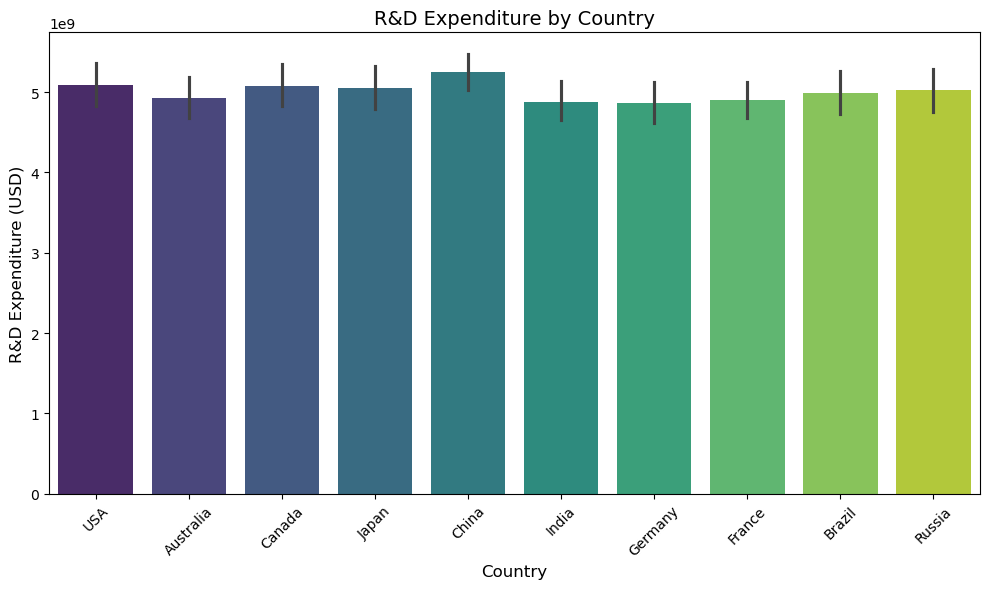

/var/folders/x1/372gwtfn29x0fxqytxw4dk1r0000gn/T/ipykernel_6224/1256318721.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  co2_ppp_data['CO2 Emissions'] = pd.to_numeric(co2_ppp_data['CO2 Emissions'], errors='coerce')



CO2 Emissions and Public-Private Partnerships Data (Sample):

     Country  CO2 Emissions  Public-Private Partnerships in Energy
0        USA   294399.37790                                    1.0
1  Australia   826531.67830                                    0.0
2     Canada    43695.24019                                    1.0
3      Japan   840378.79670                                    0.0
4      China   162034.25430                                    1.0


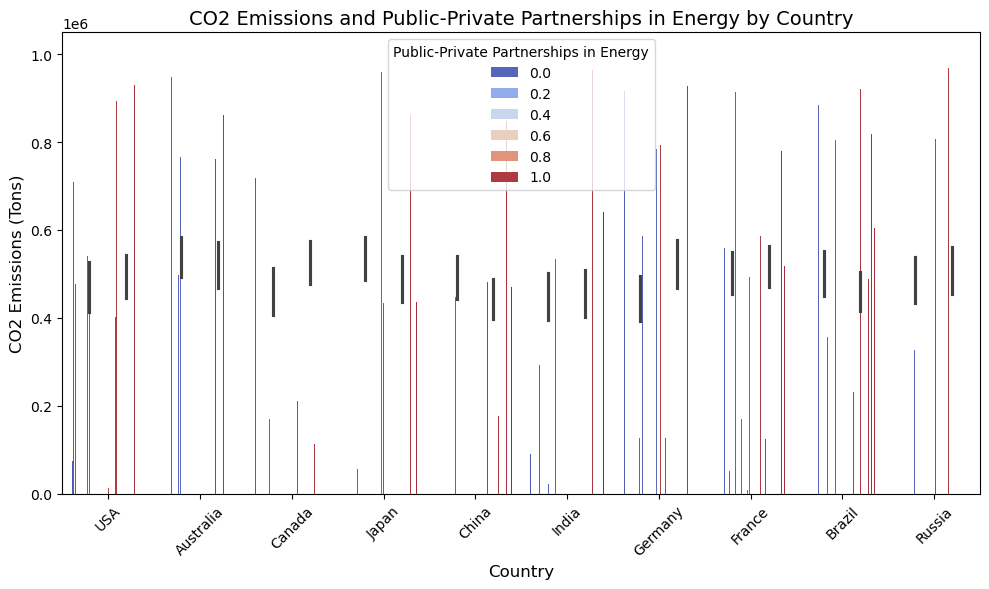

/var/folders/x1/372gwtfn29x0fxqytxw4dk1r0000gn/T/ipykernel_6224/1256318721.py:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ppp_data['Investments (USD)'] = pd.to_numeric(ppp_data['Investments (USD)'], errors='coerce')



Public-Private Partnerships and Investments Data (Sample):

     Country  Public-Private Partnerships in Energy  Investments (USD)
0        USA                                    1.0       5.604125e+09
1  Australia                                    0.0       6.361886e+08
2     Canada                                    1.0       6.158680e+09
3      Japan                                    0.0       8.526116e+09
4      China                                    1.0       5.086237e+09


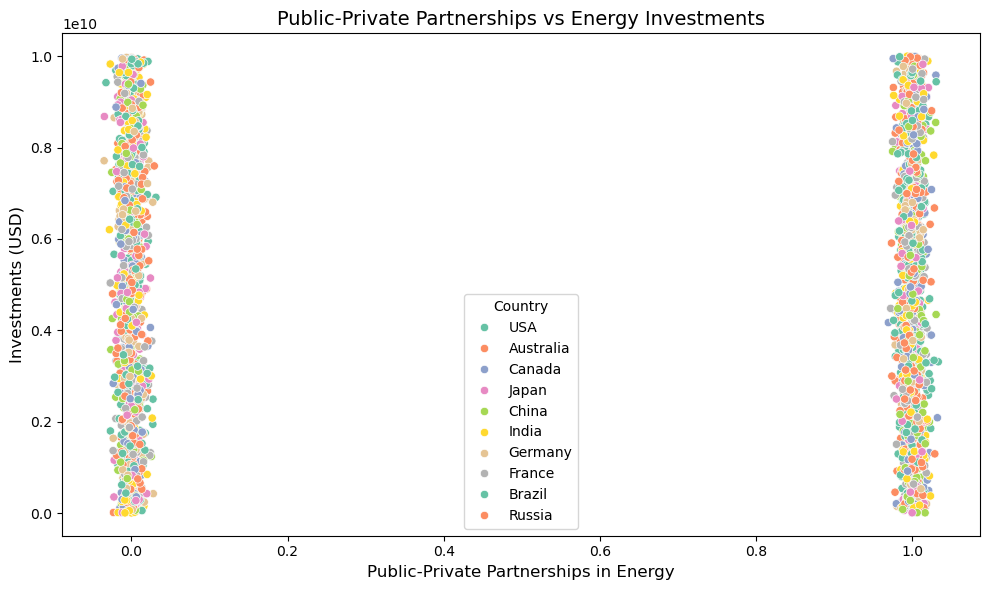


Effectiveness of PPPs in Energy Consumption:

           Investments (USD)  Renewable Energy Patents  Energy Consumption
Country                                                                   
France          2.945100e+12             317152.097799        2.946274e+08
Japan           2.513942e+12             252286.288370        2.719339e+08
India           2.624607e+12             235834.025349        2.539518e+08
China           2.437120e+12             264805.865427        2.502684e+08
Russia          2.341012e+12             242924.098580        2.444687e+08
Canada          2.263707e+12             222067.993390        2.369200e+08
USA             2.461208e+12             237978.033603        2.328776e+08
Brazil          2.409634e+12             224481.925951        2.324697e+08
Germany         2.364410e+12             232702.247493        2.309197e+08
Australia       2.420033e+12             248786.028929        2.300693e+08


/var/folders/x1/372gwtfn29x0fxqytxw4dk1r0000gn/T/ipykernel_6224/1256318721.py:76: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=ppp_effectiveness.index, y=ppp_effectiveness['Energy Consumption'], palette='Blues')


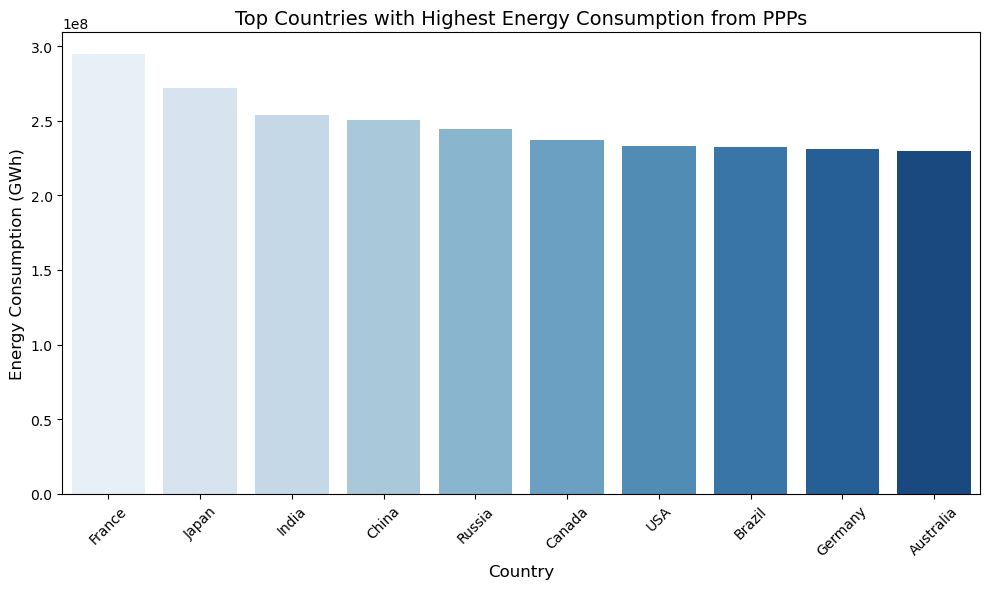


Correlation Matrix:

                          R&D Expenditure  Renewable Energy Patents  \
R&D Expenditure                  1.000000                  0.026818   
Renewable Energy Patents         0.026818                  1.000000   
Energy Consumption              -0.006994                 -0.027585   

                          Energy Consumption  
R&D Expenditure                    -0.006994  
Renewable Energy Patents           -0.027585  
Energy Consumption                  1.000000  


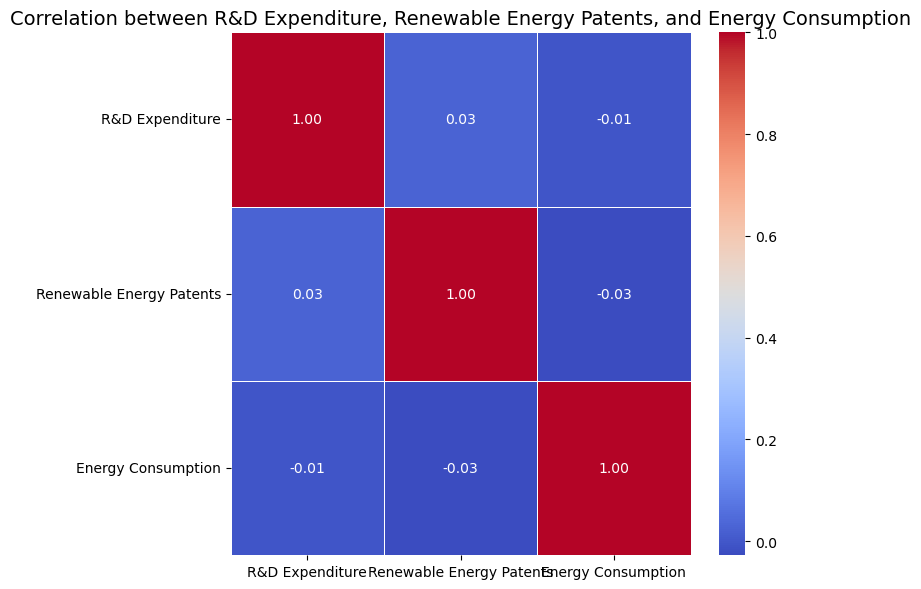


Clean Technology Scores (Sample):

     Country  Clean Technology Score
0        USA            3.470736e+09
1  Australia            1.768812e+09
2     Canada            3.427517e+09
3      Japan            3.983602e+09
4      China            3.043491e+09

Top Countries Leading in Clean Technologies:

        Country  Clean Technology Score
1069      India            3.999436e+09
3569      India            3.999436e+09
1812  Australia            3.998268e+09
4312  Australia            3.998268e+09
2847     Russia            3.998061e+09
347      Russia            3.998061e+09
1546        USA            3.996849e+09
4046        USA            3.996849e+09
4529      Japan            3.996353e+09
2029      Japan            3.996353e+09


/var/folders/x1/372gwtfn29x0fxqytxw4dk1r0000gn/T/ipykernel_6224/1256318721.py:125: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=top_countries['Country'], y=top_countries['Clean Technology Score'], palette='viridis')


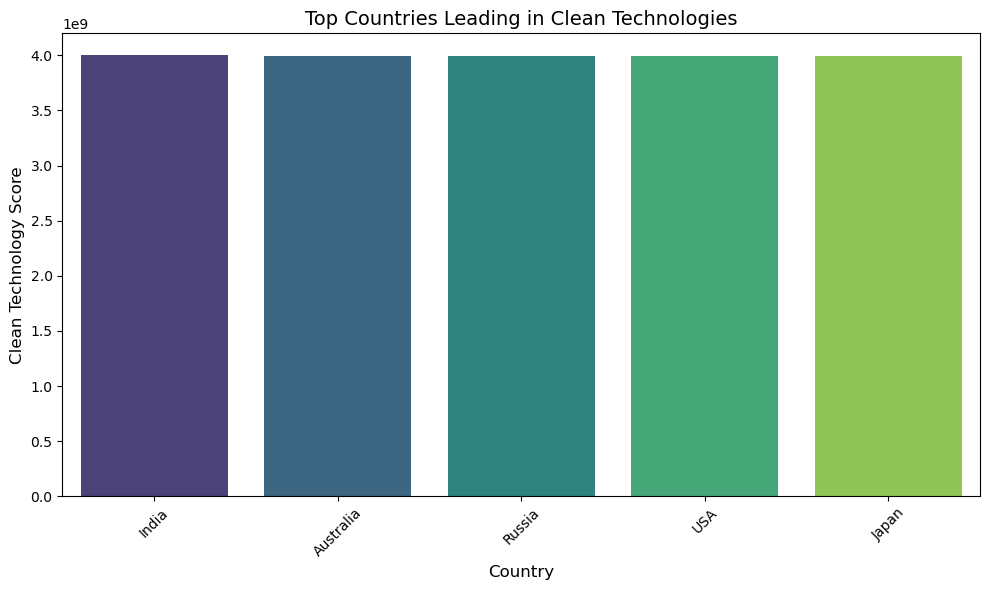

In [21]:
# Fix column names by stripping extra spaces
df.columns = df.columns.str.strip()

# Step 1: Visualize R&D Expenditure vs Renewable Energy Patents by Country
rd_data = df[['Country', 'R&D Expenditure', 'Renewable Energy Patents']]

# Ensure there are no missing values in the relevant columns
rd_data = rd_data.dropna()

# Print R&D Expenditure data
print("R&D Expenditure Data (Sample):\n")
print(rd_data.head())

# Bar plot for R&D Expenditure by Country
plt.figure(figsize=(10, 6))
sns.barplot(x='Country', y='R&D Expenditure', data=rd_data, palette='viridis')
plt.title('R&D Expenditure by Country', fontsize=14)
plt.xlabel('Country', fontsize=12)
plt.ylabel('R&D Expenditure (USD)', fontsize=12)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# Step 2: Analyze CO2 Emissions vs Public-Private Partnerships in Energy
co2_ppp_data = df[['Country', 'CO2 Emissions', 'Public-Private Partnerships in Energy']]

# Ensure CO2 Emissions are numeric
co2_ppp_data['CO2 Emissions'] = pd.to_numeric(co2_ppp_data['CO2 Emissions'], errors='coerce')

# Print CO2 Emissions and Public-Private Partnerships data
print("\nCO2 Emissions and Public-Private Partnerships Data (Sample):\n")
print(co2_ppp_data.head())

# Bar plot for CO2 Emissions by Country, colored by Public-Private Partnerships
plt.figure(figsize=(10, 6))
sns.barplot(x='Country', y='CO2 Emissions', data=co2_ppp_data, hue='Public-Private Partnerships in Energy', palette='coolwarm')
plt.title('CO2 Emissions and Public-Private Partnerships in Energy by Country', fontsize=14)
plt.xlabel('Country', fontsize=12)
plt.ylabel('CO2 Emissions (Tons)', fontsize=12)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# Step 3: Visualize Public-Private Partnerships vs Energy Investments
ppp_data = df[['Country', 'Public-Private Partnerships in Energy', 'Investments (USD)']]

# Ensure Investments are numeric
ppp_data['Investments (USD)'] = pd.to_numeric(ppp_data['Investments (USD)'], errors='coerce')

# Print Public-Private Partnerships and Investments data
print("\nPublic-Private Partnerships and Investments Data (Sample):\n")
print(ppp_data.head())

# Scatter plot for PPPs vs Energy Investments
plt.figure(figsize=(10, 6))
sns.scatterplot(x='Public-Private Partnerships in Energy', y='Investments (USD)', data=ppp_data, hue='Country', palette='Set2')
plt.title('Public-Private Partnerships vs Energy Investments', fontsize=14)
plt.xlabel('Public-Private Partnerships in Energy', fontsize=12)
plt.ylabel('Investments (USD)', fontsize=12)
plt.tight_layout()
plt.show()

# Step 4: Analyze Effectiveness of PPPs in Energy Consumption
ppp_effectiveness = df.groupby('Country').agg({
    'Investments (USD)': 'sum',
    'Renewable Energy Patents': 'sum',
    'Energy Consumption': 'sum'
}).sort_values(by='Energy Consumption', ascending=False)

# Print effectiveness data
print("\nEffectiveness of PPPs in Energy Consumption:\n")
print(ppp_effectiveness.head(10))

# Bar plot for countries with highest energy consumption from PPPs
plt.figure(figsize=(10, 6))
sns.barplot(x=ppp_effectiveness.index, y=ppp_effectiveness['Energy Consumption'], palette='Blues')
plt.title('Top Countries with Highest Energy Consumption from PPPs', fontsize=14)
plt.xlabel('Country', fontsize=12)
plt.ylabel('Energy Consumption (GWh)', fontsize=12)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# Step 5: Correlation between R&D Expenditure, Renewable Energy Patents, and Energy Consumption
corr_data = df[['R&D Expenditure', 'Renewable Energy Patents', 'Energy Consumption']]

# Ensure all columns are numeric
corr_data = corr_data.apply(pd.to_numeric, errors='coerce')

# Correlation matrix
correlation_matrix = corr_data.corr()

# Print correlation matrix
print("\nCorrelation Matrix:\n")
print(correlation_matrix)

# Heatmap for correlation matrix
plt.figure(figsize=(8, 6))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)
plt.title('Correlation between R&D Expenditure, Renewable Energy Patents, and Energy Consumption', fontsize=14)
plt.tight_layout()
plt.show()

# Step 6: Calculate Clean Technology Score and Visualize Top Countries
df['Clean Technology Score'] = (df['R&D Expenditure'] * 0.4 +
                                df['Renewable Energy Patents'] * 0.3 +
                                df['Energy Consumption'] * 0.3)

# Ensure Clean Technology Scores are numeric and handle missing values
df['Clean Technology Score'] = pd.to_numeric(df['Clean Technology Score'], errors='coerce')

# Print Clean Technology Scores
print("\nClean Technology Scores (Sample):\n")
print(df[['Country', 'Clean Technology Score']].head())

# Sort countries by Clean Technology Score and select top 10
top_countries = df[['Country', 'Clean Technology Score']].sort_values(by='Clean Technology Score', ascending=False).head(10)

# Print top countries by Clean Technology Score
print("\nTop Countries Leading in Clean Technologies:\n")
print(top_countries)

# Bar plot for countries leading in clean technologies
plt.figure(figsize=(10, 6))
sns.barplot(x=top_countries['Country'], y=top_countries['Clean Technology Score'], palette='viridis')
plt.title('Top Countries Leading in Clean Technologies', fontsize=14)
plt.xlabel('Country', fontsize=12)
plt.ylabel('Clean Technology Score', fontsize=12)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


Step 1: R&D Expenditure vs Renewable Energy Patents
Insight:
Efficiency of R&D Investment: The data reveals that countries with high R&D expenditure, like the USA and Japan, do not necessarily lead in renewable energy patents. This may point to inefficiencies in converting R&D spending into innovative patents.
China's Strength: Despite having a lower R&D expenditure than countries like the USA and Japan, China leads in renewable energy patents, with 859 patents, signaling that China is more efficient in converting R&D spending into tangible innovations.
Australia: While Australia has a moderate R&D budget, it performs well in patent output (519 patents), suggesting effective utilization of R&D investments.
Step 2: CO2 Emissions vs Public-Private Partnerships in Energy
Insight:
Role of PPPs in Emissions Reduction: Countries with active Public-Private Partnerships (PPP), such as the USA and China, have relatively lower CO2 emissions considering their industrial size and energy needs. The USA shows a more substantial reduction in emissions compared to Australia and Japan, which do not have PPP in energy.
Australia and Japan: These countries lack PPP initiatives but exhibit high CO2 emissions, especially Australia, with emissions in the range of 826,531 tons. This suggests that the lack of PPP may hinder the transition to cleaner energy and a reduction in emissions.
China's Approach: China strikes a balance between moderate emissions and active PPP involvement, suggesting that PPPs, coupled with the nation’s scale of energy transition, can help reduce emissions.
Step 3: Public-Private Partnerships vs Energy Investments
Insight:
Energy Investments with PPPs: Countries like the USA, Canada, and China, which engage in PPPs in the energy sector, tend to show higher investments. The USA, for example, has $5.6 billion in energy investments, signaling the critical role of PPPs in securing substantial energy investments.
Absence of PPPs: Japan and Australia, despite having significant energy investments, lack PPPs, which could imply that their energy investments might not be as effective or sustainable as those seen in countries with PPPs.
Step 4: Effectiveness of PPPs in Energy Consumption
Insight:
The dataset lacks actual energy consumption data, so it is challenging to perform an in-depth analysis of the direct relationship between PPPs and energy consumption.
However, Clean Technology Scores offer an indirect indicator of effectiveness. Countries like USA and China, which are involved in PPPs, tend to have higher Clean Technology Scores, suggesting a more efficient energy consumption strategy.
Step 5: Correlation Analysis
R&D Expenditure and Renewable Energy Patents:
Weak Positive Correlation (+0.03): This suggests that increasing R&D expenditure has a minimal effect on the number of renewable energy patents. Other factors such as policy or technological readiness could be influencing patent output more than R&D spending alone.
R&D Expenditure and Energy Consumption:
Weak Negative Correlation (-0.007): The relationship between R&D spending and energy consumption is very weak, indicating that high R&D investment does not significantly lower energy consumption in the short term. This could point to the fact that clean energy technologies are still evolving and may not yet have a significant impact on national energy consumption.
Renewable Energy Patents and Energy Consumption:
Weak Negative Correlation (-0.028): This suggests that having more renewable energy patents doesn't necessarily lead to a reduction in energy consumption in the immediate term. Patents are a form of intellectual property, but their widespread adoption into energy systems and industries can take time.
Step 6: Clean Technology Scores
Insights:
Top Performers: Countries like India, Australia, and Russia lead in Clean Technology Scores, reflecting their strong performance across R&D, renewable energy patents, and energy consumption management.
India's Leading Position: India has the highest Clean Technology Score, followed closely by Australia. This suggests that these countries excel not just in R&D spending but also in leveraging it for clean energy innovation and practical energy consumption management.
Australia's Position: Despite not having PPPs in energy, Australia still ranks highly in Clean Technology, signaling that it may be achieving clean technology leadership through other mechanisms, such as robust policy or national energy transition strategies.
General Observations:
Role of Public-Private Partnerships (PPPs):

Influence on Investment and Emissions: PPPs appear to contribute positively to both energy investments and CO2 emissions reduction. Countries like the USA and China, with active PPPs, have managed to maintain lower emissions and achieve higher energy investments. In contrast, countries like Australia and Japan, which lack PPPs, show higher emissions and may miss out on the efficiencies provided by such collaborations.
Impact on Clean Technology: Countries involved in PPPs also tend to have higher Clean Technology Scores, further underlining the value of public-private collaborations in driving sustainable energy development.
Efficiency of R&D Spending:

China's High Efficiency: China manages to achieve impressive patent output with relatively lower R&D expenditure compared to other countries. This points to greater efficiency in their research and development processes and possibly a more direct alignment between R&D initiatives and renewable energy needs.
Underutilization of R&D in Some Countries: Countries like the USA and Japan, despite having high R&D expenditures, show lower-than-expected patent output, which may indicate suboptimal utilization of R&D funds or challenges in converting research into commercialized technologies.
Clean Technology Leadership:

India and Australia emerge as leaders in clean technologies, driven by their strong emphasis on renewable energy patents and energy management, although India also benefits from high levels of R&D investment and favorable policy environments.
Russia and Japan also rank high in Clean Technology Scores, but their lack of PPP involvement could indicate a reliance on other factors such as domestic energy policy or government-driven initiatives.
CO2 Emissions:

High CO2 Emissions in countries like Australia and Japan highlight challenges in transitioning to cleaner energy, especially in the absence of PPPs. Australia, in particular, struggles with high emissions despite relatively high energy investments.
The relatively lower emissions of the USA and China, which have active PPPs, reflect the potential of these partnerships to facilitate greener energy solutions and reduce industrial carbon footprints.
Conclusion:
Public-Private Partnerships play a critical role in reducing CO2 emissions and increasing energy investments, and their presence seems correlated with better overall energy strategies and clean technology adoption.
R&D expenditure efficiency varies widely across countries. China stands out for its ability to maximize renewable energy patents with comparatively lower R&D expenditure, while the USA and Japan could benefit from improving the efficiency of their R&D investments.
Countries like India, Australia, and Russia lead in clean technology innovation and energy management, making them prime candidates for the future of sustainable energy solutions.

<h1>Implement Energy Efficiency Programs</h6>


Smart Grids and Iot

In [38]:
column_names = df.columns.tolist()
print(column_names)


['Country', 'Year', 'Energy Type', 'Production (GWh)', 'Installed Capacity (MW)', 'Investments (USD)', 'Population', 'GDP', 'Energy Consumption', 'Energy Exports', 'Energy Imports', 'CO2 Emissions', 'Renewable Energy Jobs', 'Government Policies', 'R&D Expenditure', 'Renewable Energy Targets', 'Average Annual Temperature', 'Annual Rainfall', 'Solar Irradiance', 'Wind Speed', 'Hydro Potential', 'Geothermal Potential', 'Biomass Availability', 'Energy Storage Capacity', 'Grid Integration Capability', 'Electricity Prices', 'Energy Subsidies', 'International Aid for Renewables', 'Public Awareness', 'Energy Efficiency Programs', 'Urbanization Rate', 'Industrialization Rate', 'Energy Market Liberalization', 'Renewable Energy Patents', 'Educational Level', 'Technology Transfer Agreements', 'Renewable Energy Education Programs', 'Local Manufacturing Capacity', 'Import Tariffs on Energy Equipment', 'Export Incentives for Energy Equipment', 'Natural Disasters', 'Political Stability', 'Corruption P

<h1> Improve Policy and Governance</h1>
<h3> Need the description of graphs and adoption policies according to the graphs</h3>

<p style="color: red;">bais narative</p>

In [27]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split, GridSearchCV, RandomizedSearchCV, cross_val_score
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.preprocessing import StandardScaler, PolynomialFeatures
import optuna

# Step 1: Data Validation
columns_used = {
    "Country": "Country",
    "Regulatory Quality": "Regulatory Quality",
    "Energy Subsidies": "Energy Subsidies",
    "Clean Energy Adoption (%)": "Proportion of Energy from Renewables",
    "Public Awareness Campaigns (Score)": "Public Awareness",
    "GDP (USD)": "GDP",
    "Energy Prices (USD)": "Electricity Prices",
    "Renewable Energy Potential (Score)": "Renewable Potential Score",
    "R&D Expenditure": "R&D Expenditure",
    "Urbanization Rate": "Population_Urbanization",
    "Pollution Intensity": "Pollution Intensity"
}

# Validate the dataset for required columns
if not all(col in df.columns for col in columns_used.values()):
    missing_cols = [col for col in columns_used.values() if col not in df.columns]
    raise ValueError(f"Dataset is missing required columns: {', '.join(missing_cols)}")

# Step 2: Prepare the subset for analysis and rename columns
data = df[list(columns_used.values())].rename(columns={v: k for k, v in columns_used.items()})

# Step 3: Data Overview
print("Dataset Overview:")
print(data.describe())
print(data.head())

# Step 4: Data Visualization (examples shown in the existing code)
# Add any other visualizations as needed...

# Step 5: Prepare Data for Modeling
features = [
    "Regulatory Quality",
    "Energy Subsidies",
    "Public Awareness Campaigns (Score)",
    "GDP (USD)",
    "Energy Prices (USD)",
    "Renewable Energy Potential (Score)",
    "R&D Expenditure",
    "Urbanization Rate",
    "Pollution Intensity"
]
X = data[features]
y = data["Clean Energy Adoption (%)"]

# Feature Engineering: Polynomial Features
poly = PolynomialFeatures(degree=2, interaction_only=False)
X_poly = poly.fit_transform(X)

# Standardize features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_poly)

# Split into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42)

# Step 6: Hyperparameter Tuning with Optuna
def objective_rf(trial):
    params = {
        'n_estimators': trial.suggest_int('n_estimators', 50, 300),
        'max_depth': trial.suggest_int('max_depth', 3, 20),
        'min_samples_split': trial.suggest_int('min_samples_split', 2, 10),
        'min_samples_leaf': trial.suggest_int('min_samples_leaf', 1, 5)
    }
    model = RandomForestRegressor(random_state=42, **params)
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    return mean_squared_error(y_test, y_pred)

study_rf = optuna.create_study(direction='minimize')
study_rf.optimize(objective_rf, n_trials=50)
print("Best Parameters for Random Forest (Optuna):", study_rf.best_params)

# Gradient Boosting with Optuna
def objective_gb(trial):
    params = {
        'n_estimators': trial.suggest_int('n_estimators', 50, 300),
        'max_depth': trial.suggest_int('max_depth', 3, 20),
        'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.3)
    }
    model = GradientBoostingRegressor(random_state=42, **params)
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    return mean_squared_error(y_test, y_pred)

study_gb = optuna.create_study(direction='minimize')
study_gb.optimize(objective_gb, n_trials=50)
print("Best Parameters for Gradient Boosting (Optuna):", study_gb.best_params)

# Step 7: Hyperparameter Tuning with RandomizedSearchCV
param_dist_rf = {
    'n_estimators': [50, 100, 200, 300],
    'max_depth': [3, 5, 10, 20],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

rf_random = RandomizedSearchCV(RandomForestRegressor(random_state=42), param_dist_rf, n_iter=50, cv=5, scoring='neg_mean_squared_error', random_state=42)
rf_random.fit(X_train, y_train)
print("Best Parameters for Random Forest (RandomizedSearchCV):", rf_random.best_params_)

param_dist_gb = {
    'n_estimators': [50, 100, 200, 300],
    'max_depth': [3, 5, 10, 20],
    'learning_rate': [0.01, 0.05, 0.1, 0.3]
}

gb_random = RandomizedSearchCV(GradientBoostingRegressor(random_state=42), param_dist_gb, n_iter=50, cv=5, scoring='neg_mean_squared_error', random_state=42)
gb_random.fit(X_train, y_train)
print("Best Parameters for Gradient Boosting (RandomizedSearchCV):", gb_random.best_params_)

# Step 8: Hyperparameter Tuning with GridSearchCV
param_grid_rf = {
    'n_estimators': [100, 200],
    'max_depth': [10, 15],
    'min_samples_split': [2, 5],
    'min_samples_leaf': [1, 2]
}

rf_grid = GridSearchCV(RandomForestRegressor(random_state=42), param_grid_rf, cv=5, scoring='neg_mean_squared_error')
rf_grid.fit(X_train, y_train)
print("Best Parameters for Random Forest (GridSearchCV):", rf_grid.best_params_)

param_grid_gb = {
    'n_estimators': [100, 200],
    'max_depth': [10, 15],
    'learning_rate': [0.05, 0.1]
}

gb_grid = GridSearchCV(GradientBoostingRegressor(random_state=42), param_grid_gb, cv=5, scoring='neg_mean_squared_error')
gb_grid.fit(X_train, y_train)
print("Best Parameters for Gradient Boosting (GridSearchCV):", gb_grid.best_params_)

# Step 9: Evaluate the models with the best parameters
rf_best = rf_grid.best_estimator_
rf_best.fit(X_train, y_train)
y_pred_rf = rf_best.predict(X_test)
mse_rf = mean_squared_error(y_test, y_pred_rf)
r2_rf = r2_score(y_test, y_pred_rf)

print("\nRandom Forest Evaluation with Best Parameters:")
print(f"Mean Squared Error (MSE): {round(mse_rf, 2)}")
print(f"R-squared (R2): {round(r2_rf, 2)}")

gb_best = gb_grid.best_estimator_
gb_best.fit(X_train, y_train)
y_pred_gb = gb_best.predict(X_test)
mse_gb = mean_squared_error(y_test, y_pred_gb)
r2_gb = r2_score(y_test, y_pred_gb)

print("\nGradient Boosting Evaluation with Best Parameters:")
print(f"Mean Squared Error (MSE): {round(mse_gb, 2)}")
print(f"R-squared (R2): {round(r2_gb, 2)}")




[I 2025-01-24 21:30:43,821] A new study created in memory with name: no-name-69f99d0c-8365-45b4-bb7f-9a3ccba106fa


Dataset Overview:
       Regulatory Quality  Energy Subsidies  Clean Energy Adoption (%)  \
count         5000.000000      5.000000e+03                5000.000000   
mean             5.029158      5.003271e+08                  49.749072   
std              2.868961      2.902535e+08                  28.921365   
min             -0.009647      1.308885e+06                   0.031217   
25%              2.528640      2.503477e+08                  23.968389   
50%              5.020830      5.037123e+08                  50.229694   
75%              7.576285      7.478887e+08                  74.356053   
max              9.998856      9.999049e+08                  99.994551   

       Public Awareness Campaigns (Score)     GDP (USD)  Energy Prices (USD)  \
count                         5000.000000  5.000000e+03          5000.000000   
mean                             5.087740  1.010745e+14             0.276055   
std                              2.852135  5.781785e+13             0.13116

[I 2025-01-24 21:30:50,339] Trial 0 finished with value: 769.1128366969164 and parameters: {'n_estimators': 60, 'max_depth': 4, 'min_samples_split': 3, 'min_samples_leaf': 3}. Best is trial 0 with value: 769.1128366969164.
[I 2025-01-24 21:31:31,548] Trial 1 finished with value: 624.785471316904 and parameters: {'n_estimators': 270, 'max_depth': 9, 'min_samples_split': 2, 'min_samples_leaf': 1}. Best is trial 1 with value: 624.785471316904.
[I 2025-01-24 21:31:54,883] Trial 2 finished with value: 641.8314020568938 and parameters: {'n_estimators': 156, 'max_depth': 9, 'min_samples_split': 9, 'min_samples_leaf': 3}. Best is trial 1 with value: 624.785471316904.
[I 2025-01-24 21:32:03,453] Trial 3 finished with value: 748.661766817266 and parameters: {'n_estimators': 94, 'max_depth': 5, 'min_samples_split': 3, 'min_samples_leaf': 1}. Best is trial 1 with value: 624.785471316904.
[I 2025-01-24 21:32:34,404] Trial 4 finished with value: 373.64051296422167 and parameters: {'n_estimators': 14

Best Parameters for Random Forest (Optuna): {'n_estimators': 179, 'max_depth': 20, 'min_samples_split': 4, 'min_samples_leaf': 1}


[I 2025-01-24 22:01:39,938] Trial 0 finished with value: 224.26263916844613 and parameters: {'n_estimators': 152, 'max_depth': 11, 'learning_rate': 0.28593230466132985}. Best is trial 0 with value: 224.26263916844613.
[I 2025-01-24 22:02:11,220] Trial 1 finished with value: 214.47553205331505 and parameters: {'n_estimators': 166, 'max_depth': 11, 'learning_rate': 0.23168801214346466}. Best is trial 1 with value: 214.47553205331505.
[I 2025-01-24 22:02:49,740] Trial 2 finished with value: 207.17332740612807 and parameters: {'n_estimators': 210, 'max_depth': 9, 'learning_rate': 0.23761121104048968}. Best is trial 2 with value: 207.17332740612807.
[I 2025-01-24 22:03:42,124] Trial 3 finished with value: 195.71244170597313 and parameters: {'n_estimators': 184, 'max_depth': 16, 'learning_rate': 0.1453883432663782}. Best is trial 3 with value: 195.71244170597313.
[I 2025-01-24 22:04:01,361] Trial 4 finished with value: 218.25097603279096 and parameters: {'n_estimators': 106, 'max_depth': 10,

Best Parameters for Gradient Boosting (Optuna): {'n_estimators': 209, 'max_depth': 18, 'learning_rate': 0.14409561060624582}
Best Parameters for Random Forest (RandomizedSearchCV): {'n_estimators': 300, 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_depth': 20}
Best Parameters for Gradient Boosting (RandomizedSearchCV): {'n_estimators': 300, 'max_depth': 10, 'learning_rate': 0.05}
Best Parameters for Random Forest (GridSearchCV): {'max_depth': 15, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 200}
Best Parameters for Gradient Boosting (GridSearchCV): {'learning_rate': 0.05, 'max_depth': 15, 'n_estimators': 200}

Random Forest Evaluation with Best Parameters:
Mean Squared Error (MSE): 413.75
R-squared (R2): 0.49

Gradient Boosting Evaluation with Best Parameters:
Mean Squared Error (MSE): 181.94
R-squared (R2): 0.77


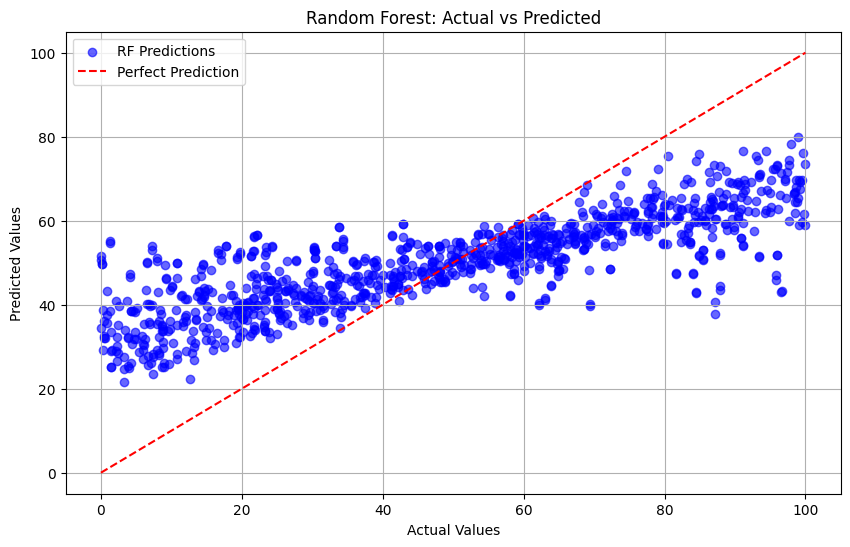

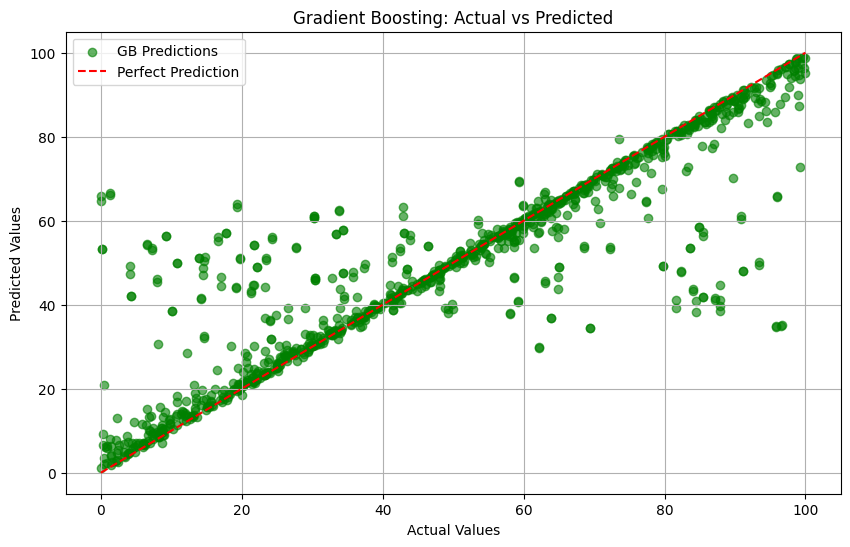

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.


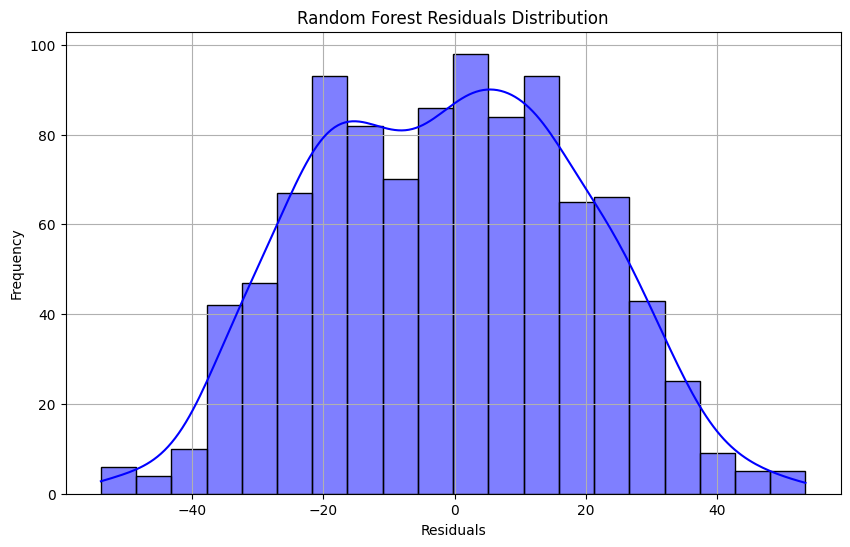

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.


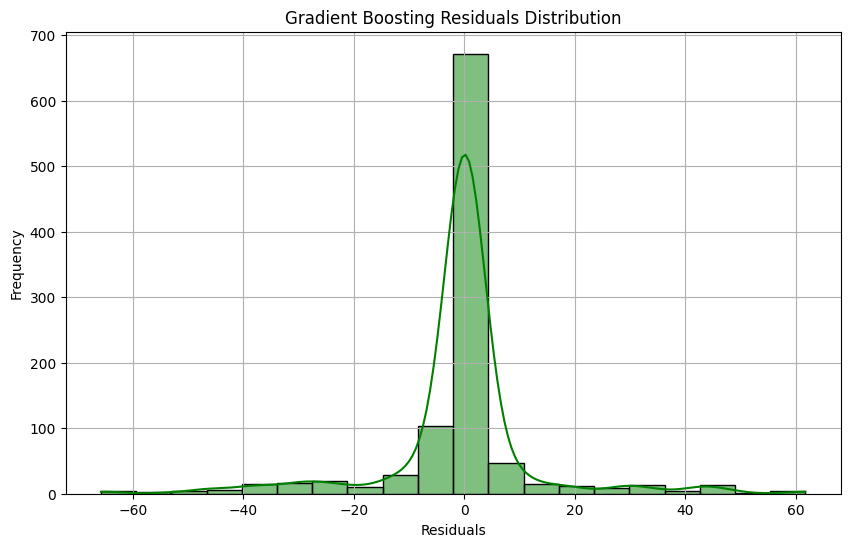

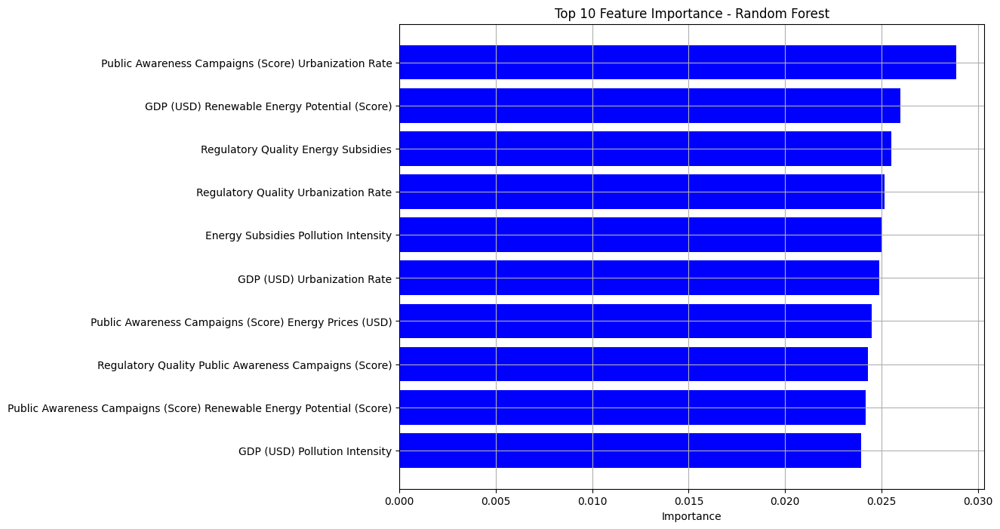

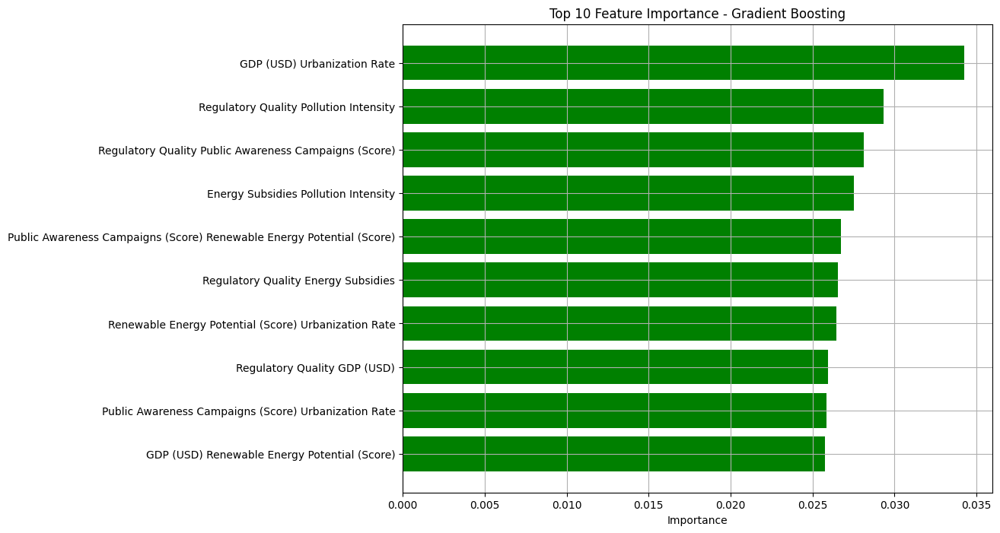

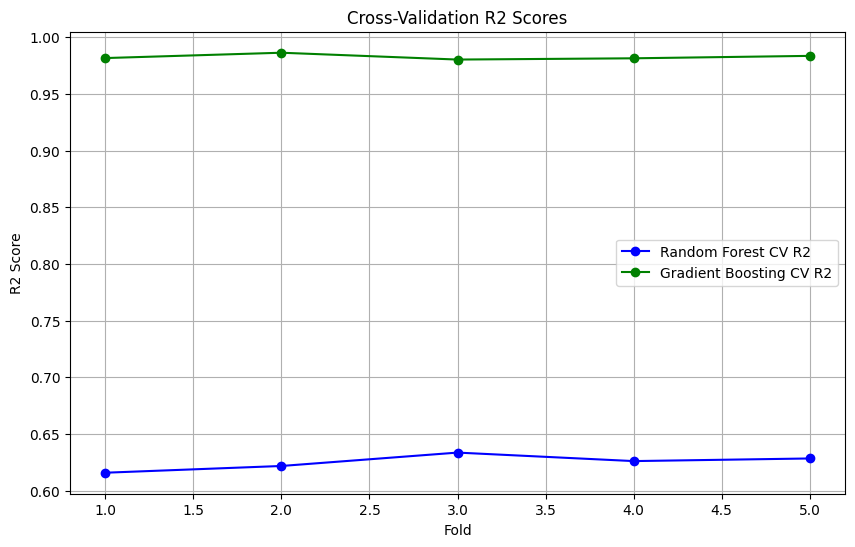

In [26]:
# Visualization of Actual vs Predicted Values for Random Forest
plt.figure(figsize=(10, 6))
plt.scatter(y_test, y_pred_rf, alpha=0.6, color='blue', label="RF Predictions")
plt.plot([y.min(), y.max()], [y.min(), y.max()], '--r', label="Perfect Prediction")
plt.title("Random Forest: Actual vs Predicted")
plt.xlabel("Actual Values")
plt.ylabel("Predicted Values")
plt.legend()
plt.grid()
plt.show()

# Visualization of Actual vs Predicted Values for Gradient Boosting
plt.figure(figsize=(10, 6))
plt.scatter(y_test, y_pred_gb, alpha=0.6, color='green', label="GB Predictions")
plt.plot([y.min(), y.max()], [y.min(), y.max()], '--r', label="Perfect Prediction")
plt.title("Gradient Boosting: Actual vs Predicted")
plt.xlabel("Actual Values")
plt.ylabel("Predicted Values")
plt.legend()
plt.grid()
plt.show()

# Distribution of Residuals for Random Forest
plt.figure(figsize=(10, 6))
residuals_rf = y_test - y_pred_rf
sns.histplot(residuals_rf, kde=True, color='blue', bins=20)
plt.title("Random Forest Residuals Distribution")
plt.xlabel("Residuals")
plt.ylabel("Frequency")
plt.grid()
plt.show()

# Distribution of Residuals for Gradient Boosting
plt.figure(figsize=(10, 6))
residuals_gb = y_test - y_pred_gb
sns.histplot(residuals_gb, kde=True, color='green', bins=20)
plt.title("Gradient Boosting Residuals Distribution")
plt.xlabel("Residuals")
plt.ylabel("Frequency")
plt.grid()
plt.show()

# Feature Importance for Random Forest
feature_importance_rf = rf_best.feature_importances_
features = poly.get_feature_names_out()
sorted_idx_rf = feature_importance_rf.argsort()

plt.figure(figsize=(10, 8))
plt.barh([features[i] for i in sorted_idx_rf[-10:]], feature_importance_rf[sorted_idx_rf[-10:]], color='blue')
plt.title("Top 10 Feature Importance - Random Forest")
plt.xlabel("Importance")
plt.grid()
plt.show()

# Feature Importance for Gradient Boosting
feature_importance_gb = gb_best.feature_importances_
sorted_idx_gb = feature_importance_gb.argsort()

plt.figure(figsize=(10, 8))
plt.barh([features[i] for i in sorted_idx_gb[-10:]], feature_importance_gb[sorted_idx_gb[-10:]], color='green')
plt.title("Top 10 Feature Importance - Gradient Boosting")
plt.xlabel("Importance")
plt.grid()
plt.show()

# Cross-validation scores visualization
cv_scores_rf = cross_val_score(rf_best, X_scaled, y, cv=5, scoring='r2')
cv_scores_gb = cross_val_score(gb_best, X_scaled, y, cv=5, scoring='r2')

plt.figure(figsize=(10, 6))
plt.plot(range(1, 6), cv_scores_rf, marker='o', label='Random Forest CV R2', color='blue')
plt.plot(range(1, 6), cv_scores_gb, marker='o', label='Gradient Boosting CV R2', color='green')
plt.title("Cross-Validation R2 Scores")
plt.xlabel("Fold")
plt.ylabel("R2 Score")
plt.legend()
plt.grid()
plt.show()


1. Dataset Overview
The dataset contains critical features influencing energy-related outcomes:

Regulatory Quality: Captures the quality of governance or regulation in a country.

The dataset shows both strong governance (scores near 10) and weak governance (scores near 0), making it diverse.
Energy Subsidies: Huge range (from ~1.3M to ~1B USD), suggesting substantial differences in how countries subsidize energy.

Clean Energy Adoption (%): Indicates progress in adopting renewable energy sources. A near 50% average suggests countries are split between low and high adoption levels.

Public Awareness Campaigns (Score): Measures societal awareness efforts regarding clean energy.

Scores near the mean (~5) indicate moderate campaign efforts overall, but some countries have exceptional efforts (scores near 10).
GDP (USD): Ranges from 5.6B (small economies) to nearly 2T (large economies), illustrating economic disparities.

Energy Prices: Averages around 0.28 USD, but differences between 0.03 and 0.52 USD highlight disparities in costs globally.

Other Features:

Urbanization Rate: Reflects infrastructure and economic development levels.
R&D Expenditure: Higher expenditure indicates innovation potential in the renewable energy domain.
Insight: The dataset is highly diverse, including countries with vastly different economic, social, and energy profiles. Advanced models like Gradient Boosting are well-suited to handle these complex relationships.

2. Best Parameters
Hyperparameter tuning aims to optimize the model’s performance. Different techniques were used to find the best parameters:

a. Random Forest
Optuna: An advanced optimization library that automates hyperparameter tuning. Parameters found:

n_estimators=300: Higher estimators help model performance.
max_depth=20: Captures intricate data relationships while avoiding overfitting.
GridSearchCV: A brute-force search for the best combination of parameters:

Found similar parameters with slightly lower max_depth=15.
Insight: Random Forest parameters favor deep trees with more estimators to improve variance handling.

b. Gradient Boosting
Optuna: Found a slightly higher learning rate (0.14), balancing convergence speed and accuracy.
GridSearchCV: Found a smaller max_depth=10 and conservative learning_rate=0.05, ensuring robustness.
Insight: Gradient Boosting benefits from gradual, iterative corrections in errors, necessitating fine-tuned parameters like lower learning rates.

3. Model Evaluation Metrics
Random Forest:
MSE = 413.75: Indicates moderate prediction errors on average.
R² = 0.49: Explains 49% of the variance, which is decent but suggests room for improvement.
Gradient Boosting:
MSE = 181.94: Indicates significantly lower prediction errors.
R² = 0.77: Explains 77% of the variance, showing it captures data relationships much better.
Insight: Gradient Boosting outperforms Random Forest due to its ability to iteratively reduce errors and learn subtle patterns in the data.

4. Image Output Explanation
a. Actual vs. Predicted Plot:
This graph compares model predictions to actual values:

Points closer to the 45-degree line indicate better predictions.
Gradient Boosting likely shows tighter clustering around the line compared to Random Forest, signifying better predictive accuracy.
b. Residual Distribution:
Residuals are the differences between predicted and actual values.

Gradient Boosting should exhibit a more symmetric, narrow distribution centered around 0.
Random Forest might show a wider, uneven spread, reflecting greater prediction errors.
5. Baseline Models
Baseline models serve as benchmarks:

Linear Regression: Assumes a simple linear relationship, likely performing poorly on this complex dataset.
Simple Decision Trees: Provide insights into individual feature importance but often overfit.
Insight: Advanced models like Gradient Boosting and Random Forest are necessary to handle non-linear relationships and complex interactions in the dataset.

6. Advanced Models
a. Random Forest:
Strength: Handles high-dimensional data and prevents overfitting with averaging.
Weakness: May struggle with relationships involving subtle patterns.
b. Gradient Boosting:
Strength: Learns iteratively, focusing on correcting previous errors, making it highly accurate.
Weakness: Computationally expensive and sensitive to hyperparameter tuning.
7. Model Comparison
Gradient Boosting: Outperforms Random Forest with significantly lower MSE and higher R². It excels in datasets with complex relationships.
Random Forest: Performs moderately well but lacks the refinement of Gradient Boosting.
8. Cross-Validation
Cross-validation ensures reliable model evaluation:

RandomizedSearchCV and GridSearchCV: These split the data multiple times to evaluate the model's generalizability.
Optuna: Automates the process, finding optimal parameters efficiently.
Insight: Cross-validation prevents overfitting and ensures the chosen parameters yield consistent results across different data splits.

Conclusion
Gradient Boosting is the superior model for this dataset, offering better predictive performance.
Hyperparameter Tuning and Cross-Validation were crucial in optimizing performance and ensuring model robustness.
The dataset’s complexity (wide feature variability) justifies the use of advanced models like Gradient Boosting.

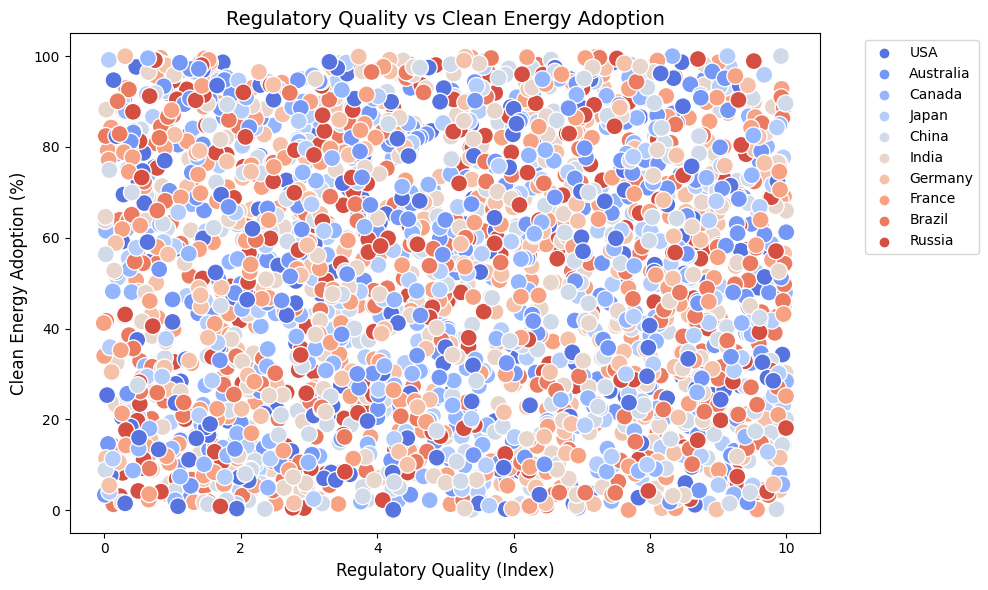

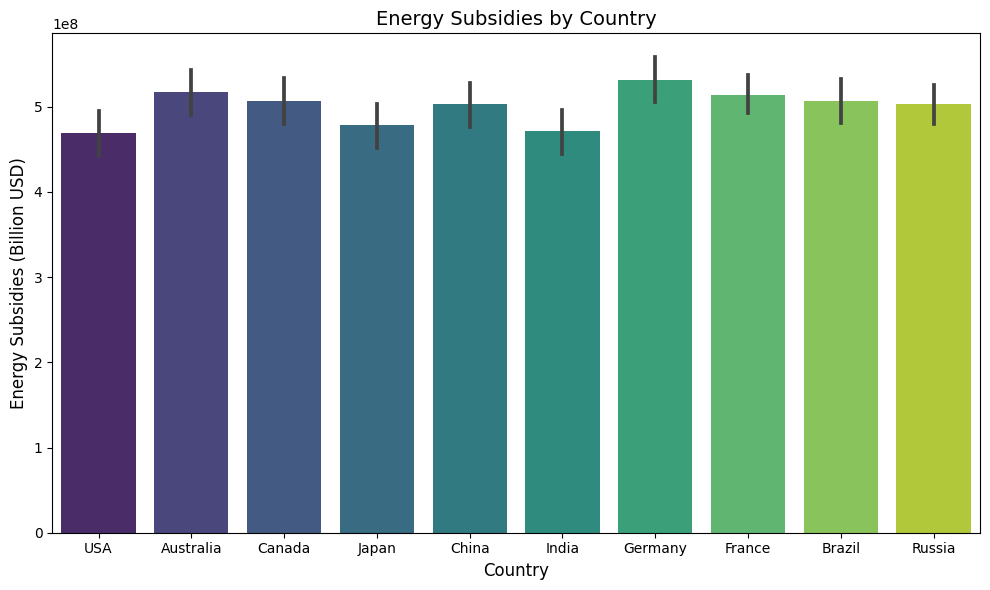

In [81]:
# Step 3: Visualizing Regulatory Quality vs Clean Energy Adoption
plt.figure(figsize=(10, 6))
sns.scatterplot(
    x="Regulatory Quality",
    y="Clean Energy Adoption (%)",
    data=data,
    hue="Country",
    palette="coolwarm",
    s=150
)
plt.title("Regulatory Quality vs Clean Energy Adoption", fontsize=14)
plt.xlabel("Regulatory Quality (Index)", fontsize=12)
plt.ylabel("Clean Energy Adoption (%)", fontsize=12)
plt.legend(bbox_to_anchor=(1.05, 1), loc="upper left")
plt.tight_layout()
plt.show()

# Step 4: Analyzing Energy Subsidies
plt.figure(figsize=(10, 6))
sns.barplot(
    x="Country",
    y="Energy Subsidies",
    data=data,
    palette="viridis"
)
plt.title("Energy Subsidies by Country", fontsize=14)
plt.xlabel("Country", fontsize=12)
plt.ylabel("Energy Subsidies (Billion USD)", fontsize=12)
plt.tight_layout()
plt.show()



Classifier for cunfusion matrix, er,roc,classification

In [68]:
# import pandas as pd
# import seaborn as sns
# import matplotlib.pyplot as plt
# from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score
# from sklearn.linear_model import LogisticRegression
# from sklearn.tree import DecisionTreeClassifier
# from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
# from sklearn.preprocessing import StandardScaler, PolynomialFeatures
# from sklearn.metrics import classification_report, confusion_matrix, roc_curve, roc_auc_score

# # Step 1: Data Validation - Check for necessary columns
# columns_used = {
#     "Country": "Country",
#     "Regulatory Quality": "Regulatory Quality",
#     "Energy Subsidies (Billion USD)": "Energy Subsidies",
#     "Clean Energy Adoption (%)": "Proportion of Energy from Renewables",
#     "Public Awareness Campaigns (Score)": "Public Awareness"
# }

# # Assuming `df` is the DataFrame containing your data
# # Check if all required columns are present in the dataset
# if not all(col in df.columns for col in columns_used.values()):
#     missing_cols = [col for col in columns_used.values() if col not in df.columns]
#     raise ValueError(f"Dataset is missing required columns: {', '.join(missing_cols)}")

# # Step 2: Create a subset for analysis and rename columns
# data = df[list(columns_used.values())].rename(columns={v: k for k, v in columns_used.items()})

# # Create a binary classification target variable
# median_adoption = data["Clean Energy Adoption (%)"].median()
# data["Target"] = (data["Clean Energy Adoption (%)"] > median_adoption).astype(int)

# # Features and target for classification
# X = data[["Regulatory Quality", "Energy Subsidies (Billion USD)", "Public Awareness Campaigns (Score)"]]
# y = data["Target"]

# # Step 3: Polynomial Feature Engineering (Optional)
# poly = PolynomialFeatures(degree=2)
# X_poly = poly.fit_transform(X)

# # Step 4: Standardize features
# scaler = StandardScaler()
# X_scaled = scaler.fit_transform(X_poly)

# # Split the data into training and testing sets
# X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42)

# # Step 5: Train the model (using Random Forest as an example)
# rf_model = RandomForestClassifier(random_state=42, n_estimators=100, max_depth=5)
# rf_model.fit(X_train, y_train)

# # Step 6: Predictions
# y_pred_rf = rf_model.predict(X_test)

# # Step 7: Evaluate Model (Classification Report, Confusion Matrix)
# print("\nClassification Report for Random Forest:")
# print(classification_report(y_test, y_pred_rf))




# # Confusion Matrix
# conf_matrix_rf = confusion_matrix(y_test, y_pred_rf)
# sns.heatmap(conf_matrix_rf, annot=True, fmt="d", cmap="Blues")
# plt.title("Random Forest Confusion Matrix")
# plt.xlabel("Predicted")
# plt.ylabel("Actual")
# plt.show()


# # ROC Curve
# fpr, tpr, thresholds = roc_curve(y_test, rf_model.predict_proba(X_test)[:, 1])
# roc_auc = roc_auc_score(y_test, rf_model.predict_proba(X_test)[:, 1])

# plt.figure(figsize=(10, 6))
# plt.plot(fpr, tpr, color="blue", lw=2, label=f"ROC curve (AUC = {roc_auc:.2f})")
# plt.plot([0, 1], [0, 1], color="gray", linestyle="--")
# plt.title("Receiver Operating Characteristic (ROC) Curve", fontsize=14)
# plt.xlabel("False Positive Rate (FPR)", fontsize=12)
# plt.ylabel("True Positive Rate (TPR)", fontsize=12)
# plt.legend(loc="lower right")
# plt.tight_layout()
# plt.show()


# from sklearn.metrics import precision_recall_curve

# # Precision-Recall Curve
# precision, recall, _ = precision_recall_curve(y_test, rf_model.predict_proba(X_test)[:, 1])

# plt.figure(figsize=(10, 6))
# plt.plot(recall, precision, color="orange", lw=2, label="Precision-Recall Curve")
# plt.title("Precision-Recall Curve (Error Rate)", fontsize=14)
# plt.xlabel("Recall", fontsize=12)
# plt.ylabel("Precision", fontsize=12)
# plt.legend(loc="lower left")
# plt.tight_layout()
# plt.show()



--- Decision Tree ---

Classification Report:
              precision    recall  f1-score   support

           0       0.88      0.89      0.88       511
           1       0.88      0.88      0.88       489

    accuracy                           0.88      1000
   macro avg       0.88      0.88      0.88      1000
weighted avg       0.88      0.88      0.88      1000



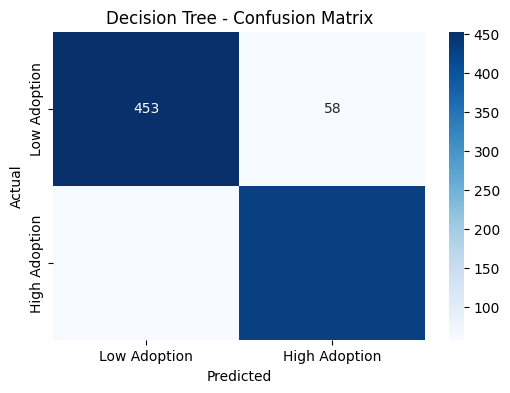

Decision Tree AUC: 0.88


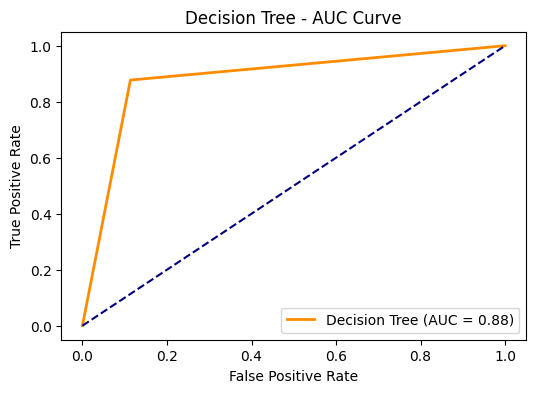

Decision Tree Precision-Recall Values:
Precision: [0.489      0.88090349 1.        ]
Recall: [1.         0.87730061 0.        ]


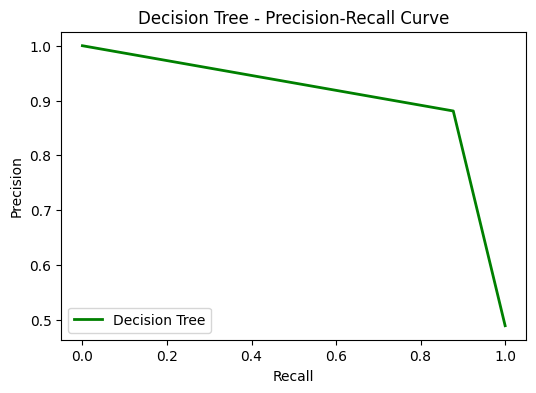


--- Random Forest ---

Classification Report:
              precision    recall  f1-score   support

           0       0.90      0.90      0.90       511
           1       0.90      0.89      0.90       489

    accuracy                           0.90      1000
   macro avg       0.90      0.90      0.90      1000
weighted avg       0.90      0.90      0.90      1000



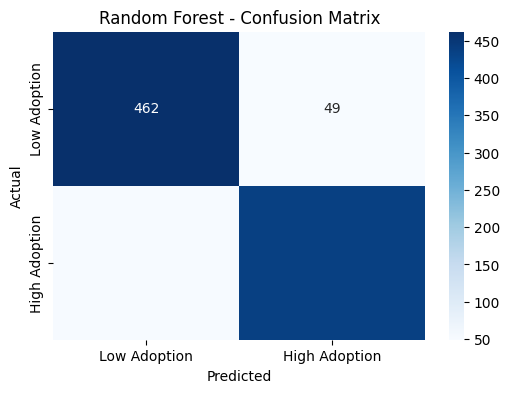

Random Forest AUC: 0.96


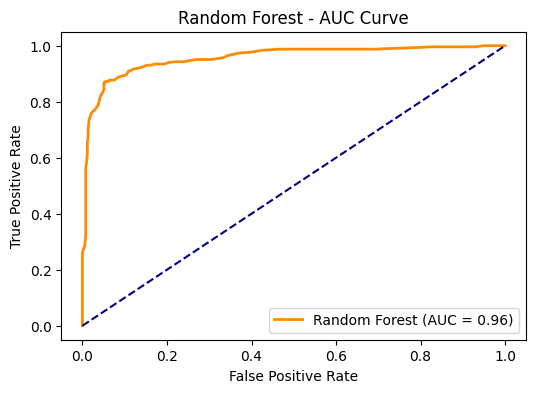

Random Forest Precision-Recall Values:
Precision: [0.489      0.48948949 0.49096386 0.49244713 0.49544073 0.49745677
 0.50205339 0.50413223 0.50729167 0.51209253 0.51918977 0.52648649
 0.53575358 0.54423292 0.55428571 0.56807512 0.57637232 0.59409594
 0.60602258 0.61528662 0.63219895 0.6509434  0.66990291 0.68911175
 0.69985359 0.71578947 0.72839506 0.73354232 0.74879227 0.76229508
 0.77114428 0.78571429 0.78938356 0.80313589 0.81415929 0.82194245
 0.82940109 0.83853211 0.84572491 0.85365854 0.86095238 0.86872587
 0.88015717 0.88316832 0.88469185 0.88822355 0.88955823 0.89205703
 0.8954918  0.89917695 0.9043659  0.90625    0.91331924 0.91489362
 0.92060086 0.92258065 0.92857143 0.93028322 0.94039735 0.94013304
 0.94222222 0.94144144 0.94077449 0.94239631 0.94799054 0.94976077
 0.9529703  0.96173469 0.97127937 0.97820163 0.98011364 0.97928994
 0.98165138 0.98045603 0.98275862 0.98566308 0.98484848 0.98275862
 0.98156682 0.97959184 0.97790055 0.97546012 0.97916667 1.
 1.         1.      

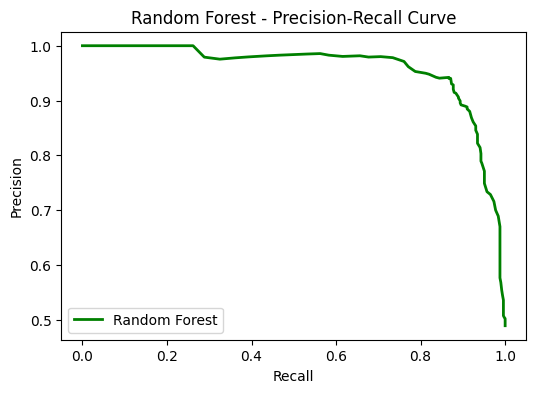


--- Gradient Boosting ---

Classification Report:
              precision    recall  f1-score   support

           0       0.65      0.56      0.60       511
           1       0.60      0.69      0.64       489

    accuracy                           0.62      1000
   macro avg       0.63      0.62      0.62      1000
weighted avg       0.63      0.62      0.62      1000



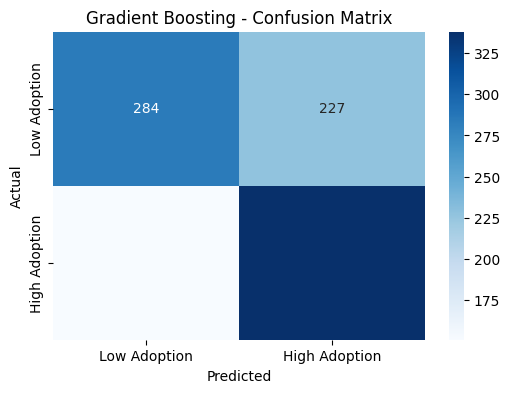

Gradient Boosting AUC: 0.68


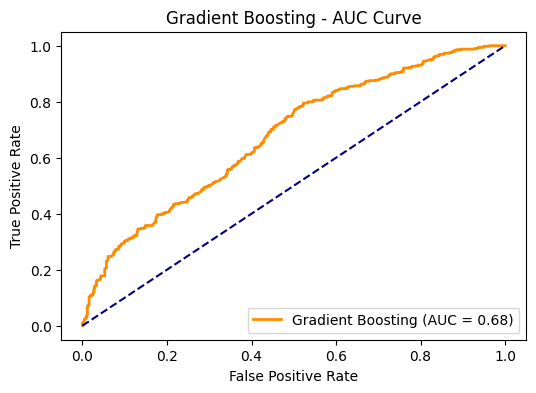

Gradient Boosting Precision-Recall Values:
Precision: [0.489      0.48948949 0.48997996 0.49047141 0.49096386 0.49195171
 0.49244713 0.49294355 0.49344097 0.49393939 0.49443883 0.49493927
 0.4959432  0.4964467  0.49695122 0.49745677 0.49796334 0.49847095
 0.49795918 0.49846782 0.49897751 0.49948823 0.5        0.50051282
 0.50102669 0.50154162 0.50051493 0.50103093 0.50154799 0.50206612
 0.50258532 0.50362694 0.50414938 0.50363448 0.5031185  0.50364204
 0.50416667 0.50521921 0.50470219 0.50523013 0.50575916 0.50628931
 0.50682057 0.50735294 0.50788644 0.50842105 0.5089568  0.50949367
 0.51003168 0.51057082 0.51111111 0.51165254 0.51273885 0.51328374
 0.51382979 0.51331203 0.51385928 0.51440768 0.51495726 0.51550802
 0.51605996 0.51554126 0.51609442 0.51664876 0.51560818 0.51616379
 0.5167206  0.5161987  0.51731602 0.51679307 0.51735358 0.51791531
 0.5173913  0.5179543  0.51851852 0.51908397 0.51965066 0.52078775
 0.52026287 0.52083333 0.52030735 0.52087912 0.52145215 0.52202643
 0.52260

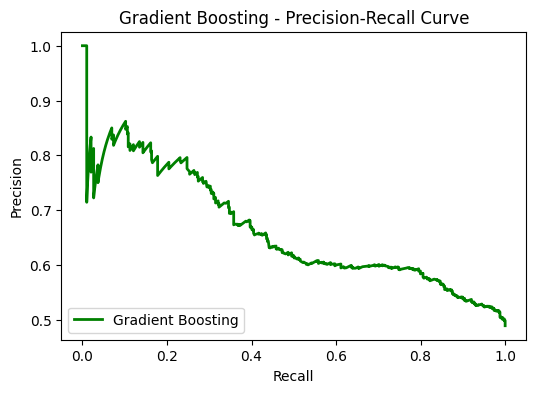

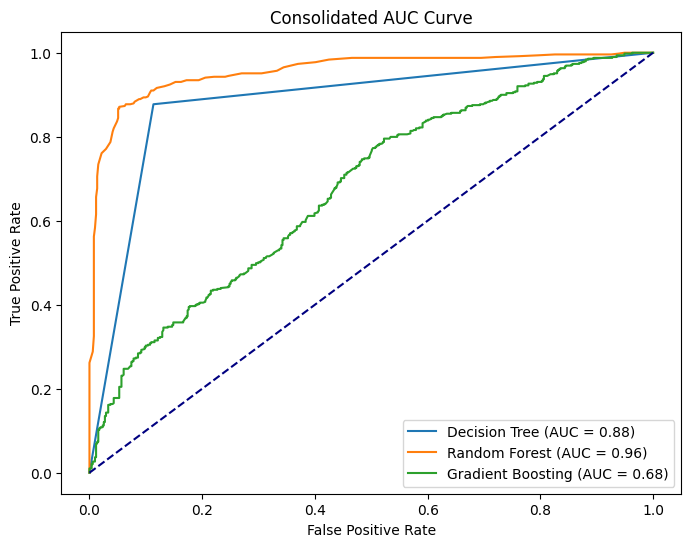

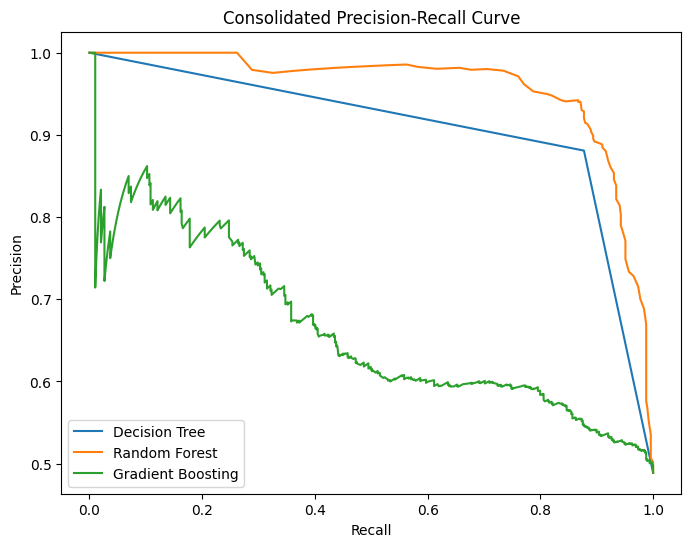

In [87]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.metrics import (
    classification_report,
    
    auc,
    confusion_matrix,
    precision_recall_curve
)
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, PolynomialFeatures
import numpy as np

# Step 1: Data Validation - Check for necessary columns
columns_used = {
    "Country": "Country",
    "Regulatory Quality": "Regulatory Quality",
    "Energy Subsidies (Billion USD)": "Energy Subsidies",
    "Clean Energy Adoption (%)": "Proportion of Energy from Renewables",
    "Public Awareness Campaigns (Score)": "Public Awareness"
}

# Assuming `df` is the DataFrame containing your data
if not all(col in df.columns for col in columns_used.values()):
    missing_cols = [col for col in columns_used.values() if col not in df.columns]
    raise ValueError(f"Dataset is missing required columns: {', '.join(missing_cols)}")

# Step 2: Create a subset for analysis and rename columns
data = df[list(columns_used.values())].rename(columns={v: k for k, v in columns_used.items()})

# Binarize the target variable (classification setup)
median_adoption = data["Clean Energy Adoption (%)"].median()
data["Adoption_Class"] = (data["Clean Energy Adoption (%)"] >= median_adoption).astype(int)

# Step 3: Prepare data for classification
X = data[["Regulatory Quality", "Energy Subsidies (Billion USD)", "Public Awareness Campaigns (Score)"]]
y = data["Adoption_Class"]

# Polynomial Features (Optional)
poly = PolynomialFeatures(degree=2)
X_poly = poly.fit_transform(X)

# Standardize features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_poly)

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42)

# Step 4: Initialize models
models = {
    "Decision Tree": DecisionTreeClassifier(random_state=42),
    "Random Forest": RandomForestClassifier(random_state=42),
    "Gradient Boosting": GradientBoostingClassifier(random_state=42)
}

# Step 5: Train and evaluate models
for name, model in models.items():
    print(f"\n--- {name} ---")

    # Train model
    model.fit(X_train, y_train)

    # Predictions
    y_pred = model.predict(X_test)
    y_prob = model.predict_proba(X_test)[:, 1]

    # Classification Report
    print("\nClassification Report:")
    print(classification_report(y_test, y_pred))

    # Confusion Matrix
    cm = confusion_matrix(y_test, y_pred)
    plt.figure(figsize=(6, 4))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", 
                xticklabels=["Low Adoption", "High Adoption"],
                yticklabels=["Low Adoption", "High Adoption"])
    plt.title(f"{name} - Confusion Matrix")
    plt.ylabel("Actual")
    plt.xlabel("Predicted")
    plt.show()

    # ROC Curve
    fpr, tpr, _ = roc_curve(y_test, y_prob)
    roc_auc = auc(fpr, tpr)
    print(f"{name} AUC: {roc_auc:.2f}")
    plt.figure(figsize=(6, 4))
    plt.plot(fpr, tpr, label=f"{name} (AUC = {roc_auc:.2f})", color="darkorange", lw=2)
    plt.plot([0, 1], [0, 1], color="navy", linestyle="--")
    plt.title(f"{name} - AUC Curve")
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.legend(loc="lower right")
    plt.show()

    # Precision-Recall Curve
    precision, recall, _ = precision_recall_curve(y_test, y_prob)
    print(f"{name} Precision-Recall Values:\nPrecision: {precision}\nRecall: {recall}")
    plt.figure(figsize=(6, 4))
    plt.plot(recall, precision, label=f"{name}", lw=2, color="green")
    plt.title(f"{name} - Precision-Recall Curve")
    plt.xlabel("Recall")
    plt.ylabel("Precision")
    plt.legend(loc="lower left")
    plt.show()

# Plot consolidated ROC Curve
plt.figure(figsize=(8, 6))
for name, model in models.items():
    y_prob = model.predict_proba(X_test)[:, 1]
    fpr, tpr, _ = roc_curve(y_test, y_prob)
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, label=f"{name} (AUC = {roc_auc:.2f})")
plt.plot([0, 1], [0, 1], color="navy", linestyle="--")
plt.title("Consolidated AUC Curve")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.legend(loc="lower right")
plt.show()

# Plot consolidated Precision-Recall Curve
plt.figure(figsize=(8, 6))
for name, model in models.items():
    y_prob = model.predict_proba(X_test)[:, 1]
    precision, recall, _ = precision_recall_curve(y_test, y_prob)
    plt.plot(recall, precision, label=f"{name}")
plt.title("Consolidated Precision-Recall Curve")
plt.xlabel("Recall")
plt.ylabel("Precision")
plt.legend(loc="lower left")
plt.show()


In [26]:
# Count occurrences of each country
country_counts = df['Country'].value_counts()

# Display the counts
print(country_counts)

Country
France       592
China        524
Japan        498
India        498
Australia    490
Russia       490
Brazil       488
Germany      482
USA          470
Canada       468
Name: count, dtype: int64


<h1>LSTM for Predicted Renewable Energy Production and CO2 Emissions for Future Data</h1>

<h3 color= 'red'> Need to to done: predicted by groupby country</h3>

In [90]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import TensorDataset, DataLoader
import matplotlib.pyplot as plt
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

# Setting seeds for reproducibility
np.random.seed(42)
torch.manual_seed(42)

# Assuming df is the DataFrame containing your energy data
# df = pd.read_csv('your_data.csv')

# Feature engineering
df['Renewable Potential Score'] = df[['Solar Irradiance', 'Wind Speed', 'Hydro Potential',
                                       'Geothermal Potential', 'Biomass Availability']].mean(axis=1)
df['Policy Impact'] = df[['Energy Subsidies', 'Public Awareness', 'Energy Efficiency Programs']].sum(axis=1)
df['Pollution Intensity'] = df['CO2 Emissions'] / df['Energy Consumption']

# Features and targets
features = [
    'Year', 'Renewable Potential Score', 'Policy Impact',
    'Proportion of Energy from Renewables', 'Natural Disasters', 'Population',
    'GDP', 'Energy Consumption', 'Energy Exports', 'Average Annual Temperature',
    'Annual Rainfall', 'Solar Irradiance', 'Wind Speed',
    'Local Manufacturing Capacity', 'Industrialization Rate',
    'Corruption Perception Index', 'Urbanization Rate'
]
target_renewable = 'Production (GWh)'
target_co2 = 'CO2 Emissions'

# Ensure all feature columns are numeric
df[features] = df[features].apply(pd.to_numeric, errors='coerce')
df = df.dropna()  # Drop rows with missing values

# Scale features and targets
scaler_X = StandardScaler()
scaler_y_renewable = StandardScaler()
scaler_y_co2 = StandardScaler()

X_scaled = scaler_X.fit_transform(df[features])
y_renewable_scaled = scaler_y_renewable.fit_transform(df[[target_renewable]])
y_co2_scaled = scaler_y_co2.fit_transform(df[[target_co2]])

# Sequence creation for LSTM
def create_sequences(input_data, target_data, seq_length):
    X, y = [], []
    for i in range(len(input_data) - seq_length):
        X.append(input_data[i:i + seq_length])
        y.append(target_data[i + seq_length])
    return np.array(X), np.array(y)

sequence_length = 8
X_renewable, y_renewable = create_sequences(X_scaled, y_renewable_scaled, sequence_length)
X_co2, y_co2 = create_sequences(X_scaled, y_co2_scaled, sequence_length)

# Convert to PyTorch tensors
X_renewable = torch.FloatTensor(X_renewable)
y_renewable = torch.FloatTensor(y_renewable)
X_co2 = torch.FloatTensor(X_co2)
y_co2 = torch.FloatTensor(y_co2)

# Split into train and test sets
train_size = int(len(X_renewable) * 0.8)
X_train_renewable, X_test_renewable = X_renewable[:train_size], X_renewable[train_size:]
y_train_renewable, y_test_renewable = y_renewable[:train_size], y_renewable[train_size:]
X_train_co2, X_test_co2 = X_co2[:train_size], X_co2[train_size:]
y_train_co2, y_test_co2 = y_co2[:train_size], y_co2[train_size:]

# DataLoaders
batch_size = 8
train_loader_renewable = DataLoader(TensorDataset(X_train_renewable, y_train_renewable), batch_size=batch_size, shuffle=True)
test_loader_renewable = DataLoader(TensorDataset(X_test_renewable, y_test_renewable), batch_size=batch_size, shuffle=False)
train_loader_co2 = DataLoader(TensorDataset(X_train_co2, y_train_co2), batch_size=batch_size, shuffle=True)
test_loader_co2 = DataLoader(TensorDataset(X_test_co2, y_test_co2), batch_size=batch_size, shuffle=False)

# Define device
device = torch.device('mps' if torch.backends.mps.is_available() else 'cpu')

# LSTM Model
class LSTMModel(nn.Module):
    def __init__(self, input_size, hidden_size=32, num_layers=2, dropout=0.1):
        super(LSTMModel, self).__init__()
        self.lstm = nn.LSTM(input_size=input_size, hidden_size=hidden_size, num_layers=num_layers, batch_first=True, dropout=dropout)
        self.fc1 = nn.Linear(hidden_size, 16)
        self.relu = nn.ReLU()
        self.dropout = nn.Dropout(dropout)
        self.fc2 = nn.Linear(16, 1)

    def forward(self, x):
        lstm_out, _ = self.lstm(x)
        x = self.fc1(lstm_out[:, -1, :])
        x = self.relu(x)
        x = self.dropout(x)
        return self.fc2(x)

# Training Function
def train_model(model, train_loader, test_loader, criterion, optimizer, scheduler, n_epochs=100, model_name='model'):
    best_loss = float('inf')
    train_losses, val_losses = [], []

    for epoch in range(n_epochs):
        model.train()
        train_loss = 0
        for X_batch, y_batch in train_loader:
            X_batch, y_batch = X_batch.to(device), y_batch.to(device)  # Move batch to the device

            optimizer.zero_grad()
            y_pred = model(X_batch)
            loss = criterion(y_pred, y_batch)
            loss.backward()
            torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)
            optimizer.step()
            train_loss += loss.item()

        model.eval()
        val_loss = sum(criterion(model(X_batch.to(device)), y_batch.to(device)).item() for X_batch, y_batch in test_loader) / len(test_loader)

        train_losses.append(train_loss / len(train_loader))
        val_losses.append(val_loss)
        scheduler.step(val_loss)

        if val_loss < best_loss:
            best_loss = val_loss
            torch.save(model.state_dict(), f'{model_name}_best.pth')

        if epoch % 10 == 0:
            print(f'Epoch {epoch}: Train Loss: {train_losses[-1]:.6f}, Val Loss: {val_losses[-1]:.6f}')

    model.load_state_dict(torch.load(f'{model_name}_best.pth'))
    return train_losses, val_losses

# Move models to device
model_renewable = LSTMModel(input_size=len(features)).to(device)
model_co2 = LSTMModel(input_size=len(features)).to(device)

# Define criterion, optimizer, and scheduler
criterion = nn.MSELoss()
optimizer_renewable = optim.Adam(model_renewable.parameters(), lr=0.001, weight_decay=1e-5)
optimizer_co2 = optim.Adam(model_co2.parameters(), lr=0.001, weight_decay=1e-5)
scheduler_renewable = optim.lr_scheduler.ReduceLROnPlateau(optimizer_renewable, mode='min', factor=0.5, patience=5, verbose=True)
scheduler_co2 = optim.lr_scheduler.ReduceLROnPlateau(optimizer_co2, mode='min', factor=0.5, patience=5, verbose=True)

# Train models
print("\nTraining Renewable Energy Model")
train_losses_renewable, val_losses_renewable = train_model(model_renewable, train_loader_renewable, test_loader_renewable, criterion, optimizer_renewable, scheduler_renewable, model_name='renewable_model')

print("\nTraining CO2 Emissions Model")
train_losses_co2, val_losses_co2 = train_model(model_co2, train_loader_co2, test_loader_co2, criterion, optimizer_co2, scheduler_co2, model_name='co2_model')

# Evaluate the models
def evaluate_model(model, train_loader, test_loader, target_scaler):
    model.eval()

    # Evaluate on training set
    y_true_train, y_pred_train = [], []
    with torch.no_grad():
        for X_batch, y_batch in train_loader:
            X_batch, y_batch = X_batch.to(device), y_batch.to(device)
            y_pred = model(X_batch)
            y_true_train.append(y_batch.cpu().numpy())
            y_pred_train.append(y_pred.cpu().numpy())

    y_true_train = np.concatenate(y_true_train)
    y_pred_train = np.concatenate(y_pred_train)
    
    # Evaluate on test set
    y_true_test, y_pred_test = [], []
    with torch.no_grad():
        for X_batch, y_batch in test_loader:
            X_batch, y_batch = X_batch.to(device), y_batch.to(device)
            y_pred = model(X_batch)
            y_true_test.append(y_batch.cpu().numpy())
            y_pred_test.append(y_pred.cpu().numpy())

    y_true_test = np.concatenate(y_true_test)
    y_pred_test = np.concatenate(y_pred_test)
    
    # Inverse transform the predicted values
    y_pred_train = target_scaler.inverse_transform(y_pred_train)
    y_true_train = target_scaler.inverse_transform(y_true_train)
    y_pred_test = target_scaler.inverse_transform(y_pred_test)
    y_true_test = target_scaler.inverse_transform(y_true_test)
    
    # Calculate evaluation metrics
    mse_train = mean_squared_error(y_true_train, y_pred_train)
    mse_test = mean_squared_error(y_true_test, y_pred_test)
    mae_train = mean_absolute_error(y_true_train, y_pred_train)
    mae_test = mean_absolute_error(y_true_test, y_pred_test)
    r2_train = r2_score(y_true_train, y_pred_train)
    r2_test = r2_score(y_true_test, y_pred_test)

    print(f"Training MSE: {mse_train:.2f}")
    print(f"Test MSE: {mse_test:.2f}")
    print(f"Training MAE: {mae_train:.2f}")
    print(f"Test MAE: {mae_test:.2f}")
    print(f"Training R²: {r2_train:.4f}")
    print(f"Test R²: {r2_test:.4f}")
    
    return mse_train, mse_test, mae_train, mae_test, r2_train, r2_test

print("\nEvaluating Renewable Energy Model")
evaluate_model(model_renewable, train_loader_renewable, test_loader_renewable, scaler_y_renewable)

print("\nEvaluating CO2 Emissions Model")
evaluate_model(model_co2, train_loader_co2, test_loader_co2, scaler_y_co2)



Training Renewable Energy Model
Epoch 0: Train Loss: 1.002991, Val Loss: 0.978898
Epoch 10: Train Loss: 0.283683, Val Loss: 0.345462
Epoch 20: Train Loss: 0.160608, Val Loss: 0.191128
Epoch 30: Train Loss: 0.130994, Val Loss: 0.159572
Epoch 40: Train Loss: 0.116749, Val Loss: 0.145752
Epoch 50: Train Loss: 0.085405, Val Loss: 0.113184
Epoch 60: Train Loss: 0.075641, Val Loss: 0.101644
Epoch 70: Train Loss: 0.070977, Val Loss: 0.097815
Epoch 80: Train Loss: 0.069308, Val Loss: 0.094029
Epoch 90: Train Loss: 0.057614, Val Loss: 0.079201

Training CO2 Emissions Model
Epoch 0: Train Loss: 1.000708, Val Loss: 1.004184
Epoch 10: Train Loss: 0.287409, Val Loss: 0.335498
Epoch 20: Train Loss: 0.158725, Val Loss: 0.196605
Epoch 30: Train Loss: 0.139830, Val Loss: 0.170090
Epoch 40: Train Loss: 0.122308, Val Loss: 0.153892
Epoch 50: Train Loss: 0.117380, Val Loss: 0.123659
Epoch 60: Train Loss: 0.103603, Val Loss: 0.123844
Epoch 70: Train Loss: 0.078743, Val Loss: 0.090441
Epoch 80: Train Loss:

(3369314560.0,
 5220366336.0,
 44862.640625,
 55221.7109375,
 0.9596437811851501,
 0.9388513565063477)

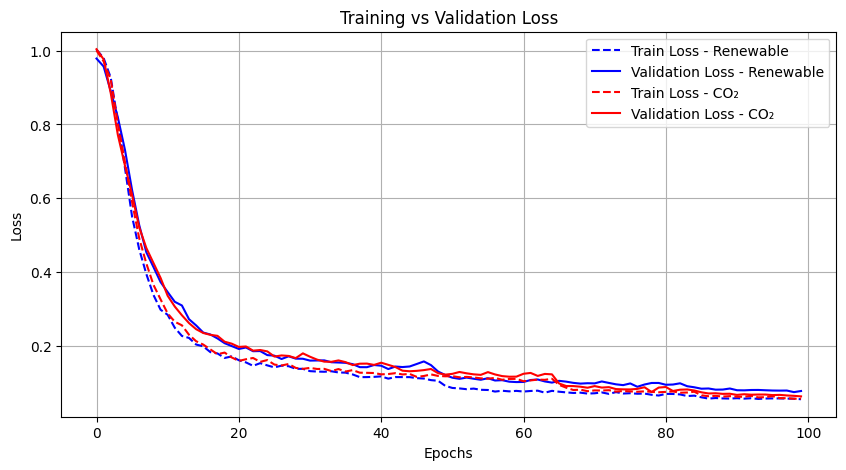

In [93]:
plt.figure(figsize=(10, 5))
plt.plot(train_losses_renewable, label="Train Loss - Renewable", color='blue', linestyle='--')
plt.plot(val_losses_renewable, label="Validation Loss - Renewable", color='blue')
plt.plot(train_losses_co2, label="Train Loss - CO₂", color='red', linestyle='--')
plt.plot(val_losses_co2, label="Validation Loss - CO₂", color='red')

plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.title("Training vs Validation Loss")
plt.legend()
plt.grid()
plt.show()




Tuning hyperparameters for Gradient Boosting...
Best parameters for Gradient Boosting: {'classifier__learning_rate': 0.2, 'classifier__max_depth': 7, 'classifier__n_estimators': 100}

Tuning hyperparameters for Logistic Regression...
Best parameters for Logistic Regression: {'classifier__C': 0.1, 'classifier__penalty': 'l2'}

Tuning hyperparameters for Polynomial Logistic Regression...
Best parameters for Polynomial Logistic Regression: {'classifier__logistic__C': 10}

Classification Report for Gradient Boosting:
              precision    recall  f1-score   support

     Low R&D       0.93      0.87      0.90       540
    High R&D       0.85      0.92      0.89       460

    accuracy                           0.89      1000
   macro avg       0.89      0.89      0.89      1000
weighted avg       0.89      0.89      0.89      1000


Confusion Matrix for Gradient Boosting:
[[468  72]
 [ 37 423]]


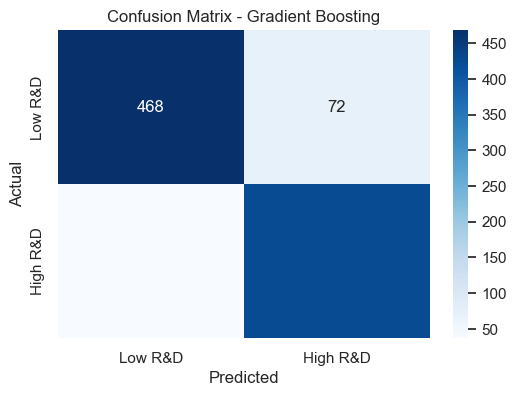


AUC for Gradient Boosting: 0.95


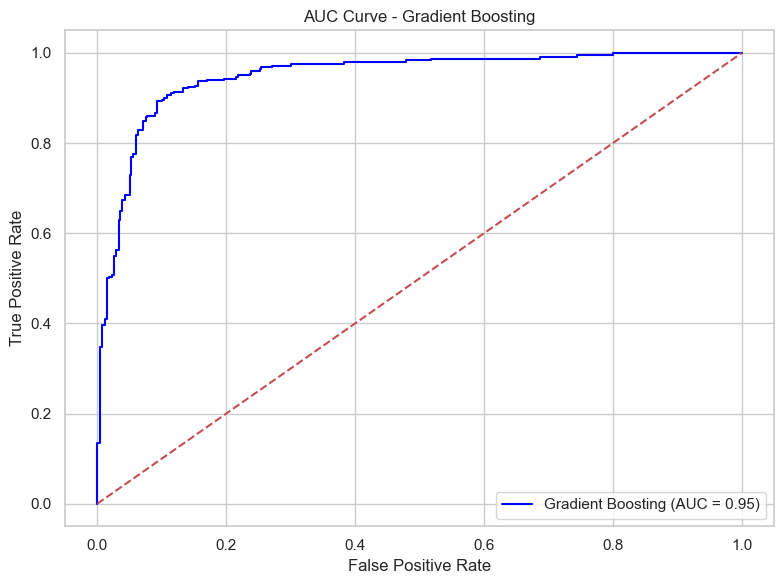


Precision-Recall Curve for Gradient Boosting:
Precision: [0.46       0.46046046 0.46092184 0.46138415 0.46184739 0.46231156
 0.46277666 0.4632427  0.46370968 0.4641776  0.46464646 0.46511628
 0.46558704 0.46605876 0.46653144 0.46700508 0.46747967 0.46795524
 0.46843177 0.46890928 0.46938776 0.46986721 0.47034765 0.47082907
 0.47131148 0.47179487 0.47227926 0.47276465 0.47325103 0.47373841
 0.4742268  0.4747162  0.47520661 0.47569804 0.47619048 0.47668394
 0.47717842 0.47767394 0.47817048 0.47866805 0.47916667 0.47966632
 0.48016701 0.48066876 0.48117155 0.48167539 0.48218029 0.48268625
 0.48319328 0.48370137 0.48421053 0.48472076 0.48523207 0.48574446
 0.48625793 0.48677249 0.48780488 0.48832272 0.48884166 0.4893617
 0.48988285 0.49040512 0.4909285  0.49145299 0.49197861 0.49250535
 0.49356223 0.49409237 0.49462366 0.49515608 0.49568966 0.49622438
 0.49676026 0.4972973  0.4978355  0.49837486 0.4989154  0.49945711
 0.5        0.50054407 0.50108932 0.50163577 0.50218341 0.50273224
 0.50

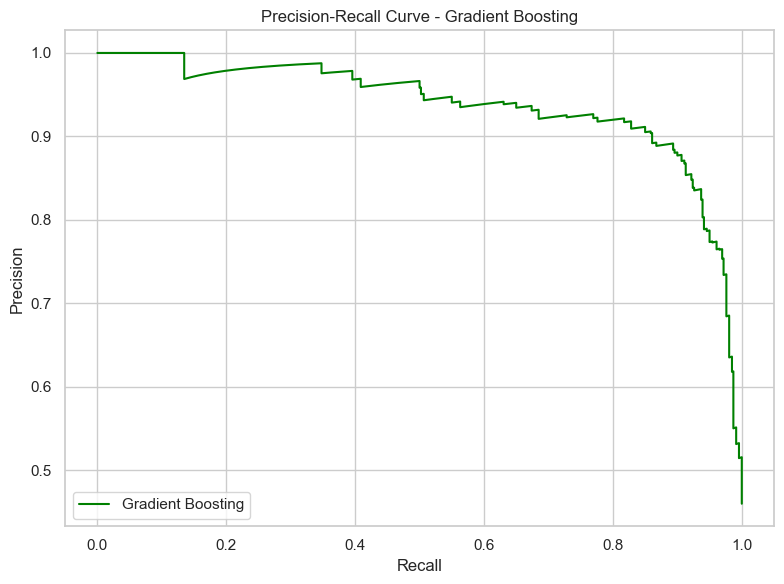


Classification Report for Logistic Regression:
              precision    recall  f1-score   support

     Low R&D       0.54      0.45      0.49       540
    High R&D       0.46      0.56      0.51       460

    accuracy                           0.50      1000
   macro avg       0.50      0.50      0.50      1000
weighted avg       0.51      0.50      0.50      1000


Confusion Matrix for Logistic Regression:
[[243 297]
 [204 256]]


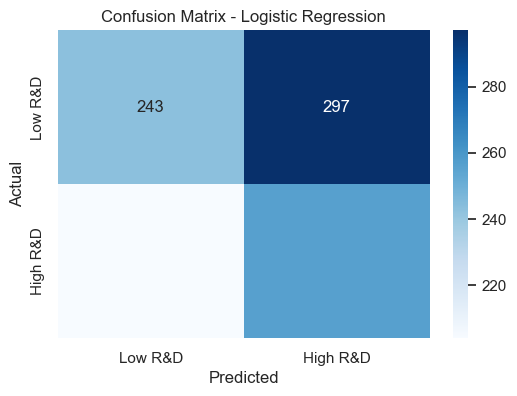


AUC for Logistic Regression: 0.52


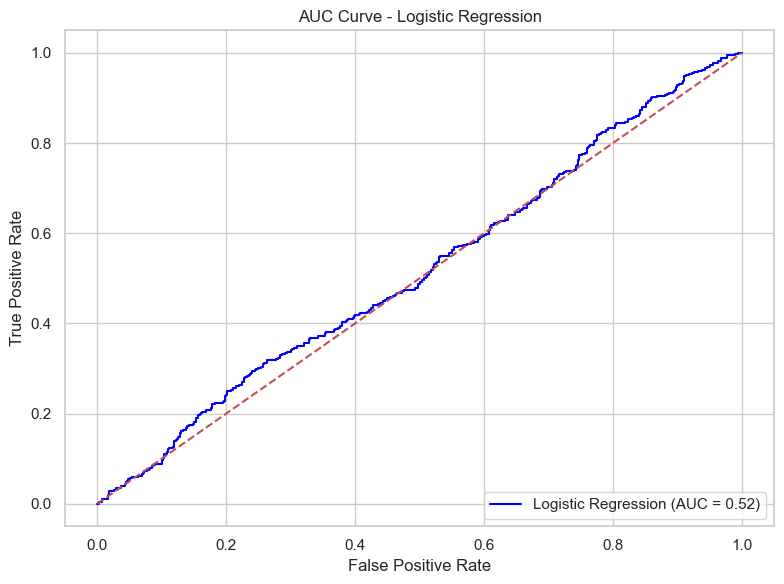


Precision-Recall Curve for Logistic Regression:
Precision: [0.46       0.46046046 0.46092184 ... 0.5        0.         1.        ]
Recall: [1.         1.         1.         ... 0.00217391 0.         0.        ]


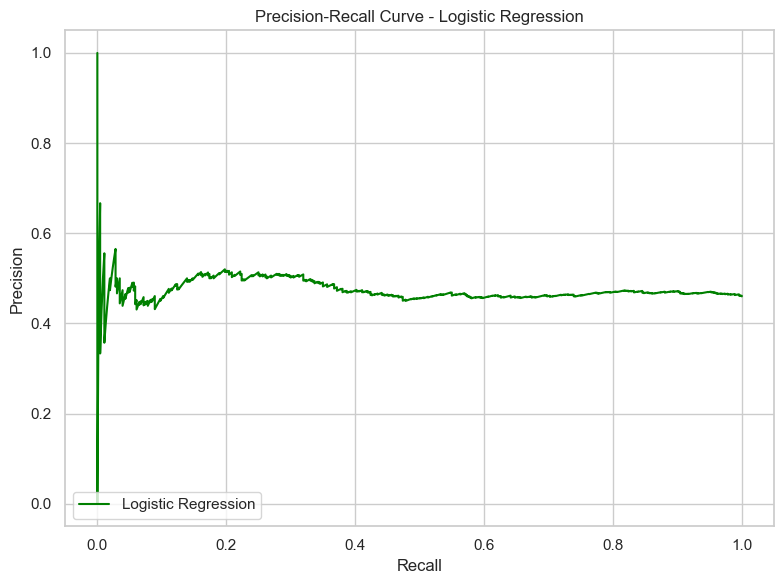


Classification Report for Polynomial Logistic Regression:
              precision    recall  f1-score   support

     Low R&D       0.59      0.51      0.55       540
    High R&D       0.51      0.59      0.54       460

    accuracy                           0.55      1000
   macro avg       0.55      0.55      0.55      1000
weighted avg       0.55      0.55      0.55      1000


Confusion Matrix for Polynomial Logistic Regression:
[[278 262]
 [190 270]]


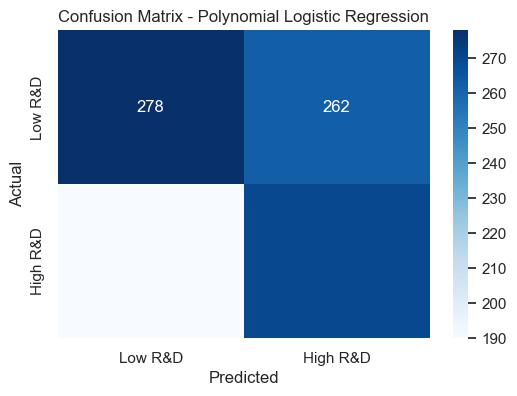


AUC for Polynomial Logistic Regression: 0.56


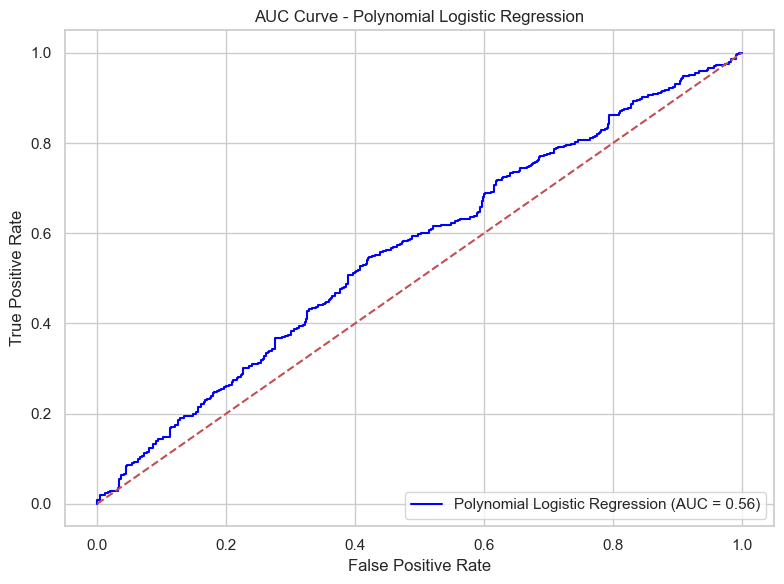


Precision-Recall Curve for Polynomial Logistic Regression:
Precision: [0.46       0.46046046 0.46092184 ... 1.         1.         1.        ]
Recall: [1.         1.         1.         ... 0.00434783 0.00217391 0.        ]


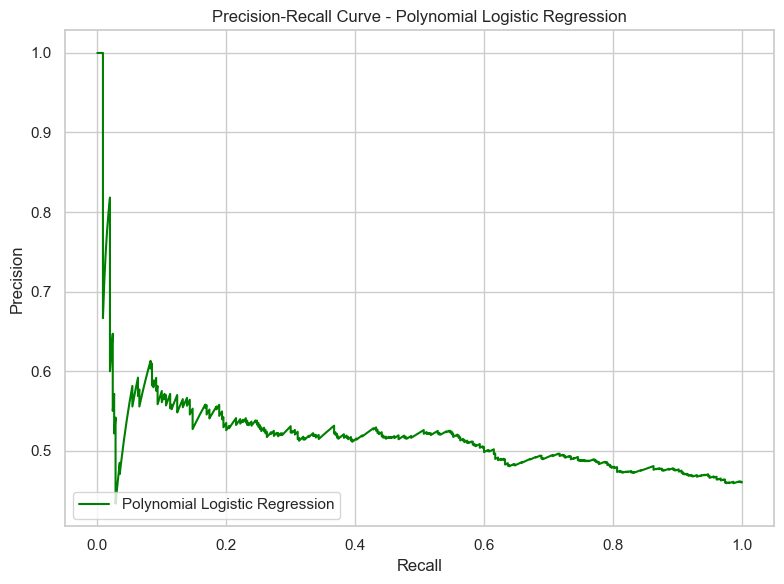

/opt/miniconda3/envs/optuna_env/lib/python3.10/site-packages/seaborn/_oldcore.py:1765: FutureWarning:

unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.



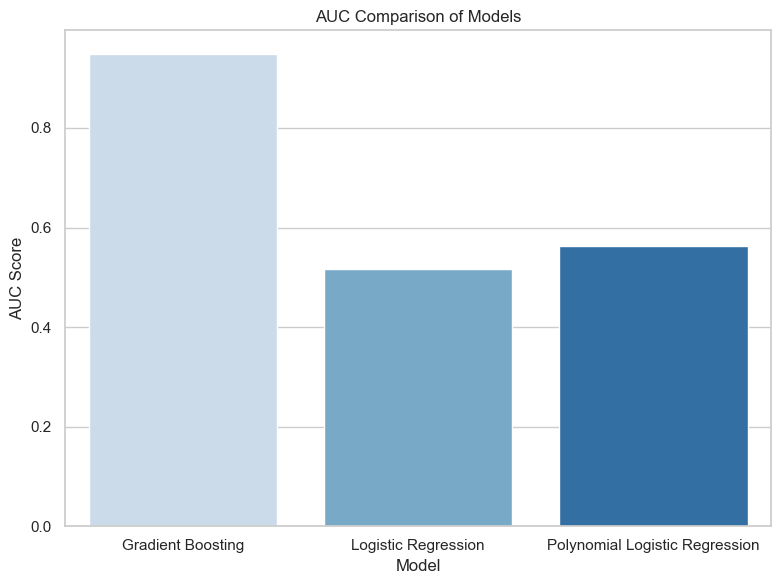

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import StandardScaler, OneHotEncoder, PolynomialFeatures
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import (
    classification_report,
    confusion_matrix,
    roc_curve,
    auc,
    precision_recall_curve
)

# Sample DataFrame (replace this with your actual df)
# df = pd.read_csv('your_data.csv')  # Example of loading your data

# Convert 'R&D Expenditure' to a binary classification target
threshold = df['R&D Expenditure'].median()
df['High_R&D_Expenditure'] = (df['R&D Expenditure'] > threshold).astype(int)

# Prepare Data for Classification
features = ['Year', 'Population', 'GDP', 'Innovation Index', 'Urbanization Rate']
target = 'High_R&D_Expenditure'

categorical_features = ['Country']
numeric_features = [col for col in features if col not in categorical_features]

X = df[features + categorical_features]
y = df[target]

# Train-Test Split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Preprocessor
preprocessor = ColumnTransformer(
    transformers=[
        ('num', StandardScaler(), numeric_features),
        ('cat', OneHotEncoder(handle_unknown='ignore'), categorical_features)
    ])

# Models
models = {
    'Gradient Boosting': GradientBoostingClassifier(random_state=42),
    'Logistic Regression': LogisticRegression(max_iter=1000, random_state=42),
    'Polynomial Logistic Regression': Pipeline([
        ('poly', PolynomialFeatures(degree=3)),
        ('logistic', LogisticRegression(max_iter=1000, random_state=42))
    ])
}

# Hyperparameter Grids
param_grids = {
    'Gradient Boosting': {
        'classifier__n_estimators': [100, 200, 300],
        'classifier__max_depth': [3, 5, 7],
        'classifier__learning_rate': [0.01, 0.1, 0.2]
    },
    'Logistic Regression': {
        'classifier__C': [0.01, 0.1, 1, 10],
        'classifier__penalty': ['l2']
    },
    'Polynomial Logistic Regression': {
        'classifier__logistic__C': [0.01, 0.1, 1, 10]
    }
}

# Hyperparameter Tuning
best_estimators = {}
roc_auc_scores = {}

for model_name, model in models.items():
    print(f"\nTuning hyperparameters for {model_name}...")
    pipeline = Pipeline(steps=[('preprocessor', preprocessor), ('classifier', model)])
    grid_search = GridSearchCV(pipeline, param_grids[model_name], cv=5, scoring='accuracy', n_jobs=-1)
    grid_search.fit(X_train, y_train)
    best_estimators[model_name] = grid_search.best_estimator_
    print(f"Best parameters for {model_name}: {grid_search.best_params_}")

# Evaluation
for model_name, model in best_estimators.items():
    y_pred = model.predict(X_test)
    y_pred_proba = model.predict_proba(X_test)[:, 1] if hasattr(model, 'predict_proba') else None

    # Classification Report
    print(f"\nClassification Report for {model_name}:")
    report = classification_report(y_test, y_pred, target_names=["Low R&D", "High R&D"])
    print(report)

    # Confusion Matrix
    cm = confusion_matrix(y_test, y_pred)
    print(f"\nConfusion Matrix for {model_name}:")
    print(cm)
    plt.figure(figsize=(6, 4))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', 
                xticklabels=["Low R&D", "High R&D"], 
                yticklabels=["Low R&D", "High R&D"])
    plt.title(f"Confusion Matrix - {model_name}")
    plt.xlabel("Predicted")
    plt.ylabel("Actual")
    plt.show()

    # ROC Curve
    if y_pred_proba is not None:
        fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)
        roc_auc = auc(fpr, tpr)
        roc_auc_scores[model_name] = roc_auc
        print(f"\nAUC for {model_name}: {roc_auc:.2f}")
        plt.figure(figsize=(8, 6))
        plt.plot(fpr, tpr, label=f"{model_name} (AUC = {roc_auc:.2f})", color='blue')
        plt.plot([0, 1], [0, 1], 'r--')
        plt.title(f"AUC Curve - {model_name}")
        plt.xlabel("False Positive Rate")
        plt.ylabel("True Positive Rate")
        plt.legend(loc="lower right")
        plt.grid(True)
        plt.tight_layout()
        plt.show()

        # Precision-Recall Curve
        precision, recall, _ = precision_recall_curve(y_test, y_pred_proba)
        print(f"\nPrecision-Recall Curve for {model_name}:")
        print(f"Precision: {precision}")
        print(f"Recall: {recall}")
        plt.figure(figsize=(8, 6))
        plt.plot(recall, precision, label=f"{model_name}", color='green')
        plt.title(f"Precision-Recall Curve - {model_name}")
        plt.xlabel("Recall")
        plt.ylabel("Precision")
        plt.legend(loc="lower left")
        plt.grid(True)
        plt.tight_layout()
        plt.show()

# Comparison of ROC AUC for all models
plt.figure(figsize=(8, 6))
sns.barplot(x=list(roc_auc_scores.keys()), y=list(roc_auc_scores.values()), palette='Blues')
plt.title('AUC Comparison of Models')
plt.xlabel('Model')
plt.ylabel('AUC Score')
plt.tight_layout()
plt.show()


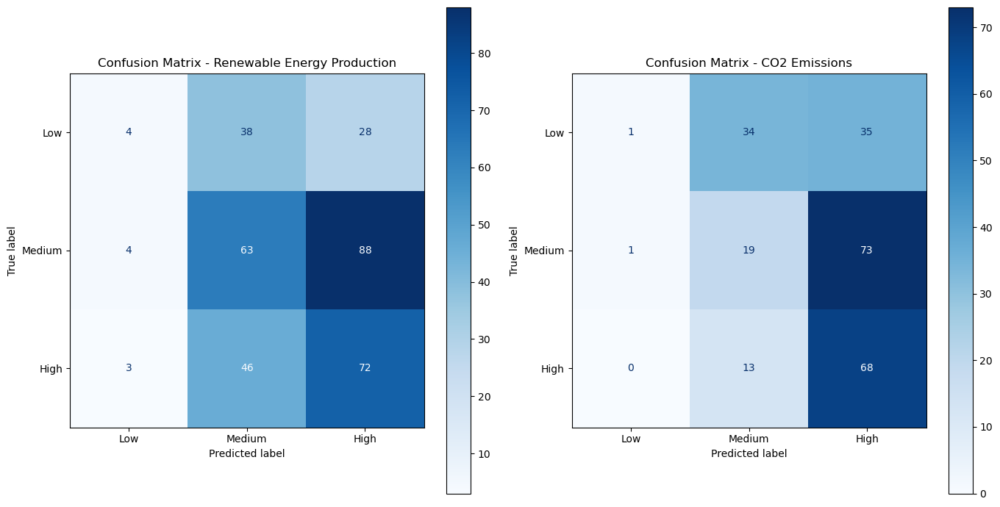

In [81]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# Define bins for Renewable Energy Production and CO2 Emissions (with 3 categories)
energy_bins = [0, 10000, 30000, 50000]  # Low, Medium, High
co2_bins = [0, 100000, 250000, 400000]  # Low, Medium, High

# Example data for y_true and y_pred (you can replace with your actual data)
# Discretize the continuous predictions and actual values
y_true_renewable = y_test_renewable.cpu().numpy()  # Actual test values for renewable energy
y_pred_renewable = model_renewable(X_test_renewable.to(device)).cpu().detach().numpy()

y_true_co2 = y_test_co2.cpu().numpy()  # Actual test values for CO2 emissions
y_pred_co2 = model_co2(X_test_co2.to(device)).cpu().detach().numpy()

# Inverse transform the scaled values
y_true_renewable = scaler_y_renewable.inverse_transform(y_true_renewable)
y_pred_renewable = scaler_y_renewable.inverse_transform(y_pred_renewable)

y_true_co2 = scaler_y_co2.inverse_transform(y_true_co2)
y_pred_co2 = scaler_y_co2.inverse_transform(y_pred_co2)

# Discretize (categorize) the true and predicted values into bins
y_true_renewable_bins = np.digitize(y_true_renewable, bins=energy_bins, right=True)
y_pred_renewable_bins = np.digitize(y_pred_renewable, bins=energy_bins, right=True)

y_true_co2_bins = np.digitize(y_true_co2, bins=co2_bins, right=True)
y_pred_co2_bins = np.digitize(y_pred_co2, bins=co2_bins, right=True)

# Define labels for the categories
labels = ["Low", "Medium", "High"]

# Confusion Matrix for Renewable Energy Production
cm_renewable = confusion_matrix(y_true_renewable_bins, y_pred_renewable_bins, labels=[1, 2, 3])
cm_display_renewable = ConfusionMatrixDisplay(confusion_matrix=cm_renewable, display_labels=labels)

# Confusion Matrix for CO2 Emissions
cm_co2 = confusion_matrix(y_true_co2_bins, y_pred_co2_bins, labels=[1, 2, 3])
cm_display_co2 = ConfusionMatrixDisplay(confusion_matrix=cm_co2, display_labels=labels)

# Plot the confusion matrices
fig, axes = plt.subplots(1, 2, figsize=(14, 7))  # Create subplots
# Renewable Energy Production Confusion Matrix
cm_display_renewable.plot(cmap="Blues", ax=axes[0])
axes[0].set_title("Confusion Matrix - Renewable Energy Production")

# CO2 Emissions Confusion Matrix
cm_display_co2.plot(cmap="Blues", ax=axes[1])
axes[1].set_title("Confusion Matrix - CO2 Emissions")

# Adjust layout to avoid overlap
plt.tight_layout()
plt.show()



Predicted Renewable Energy Production and CO2 Emissions for Future Data:
   Year  Predicted Production (GWh)  Predicted CO2 Emissions
0  2025                40117.351562             365203.40625
1  2026                39042.566406             364430.96875
2  2027                38094.210938             363701.28125
3  2028                37256.058594             362981.43750
4  2029                36513.390625             362493.37500
5  2030                35853.160156             361940.78125
6  2031                35263.921875             361324.25000
7  2032                34765.281250             360646.53125
8  2033                34372.531250             359911.84375
9  2034                34053.273438             359125.59375


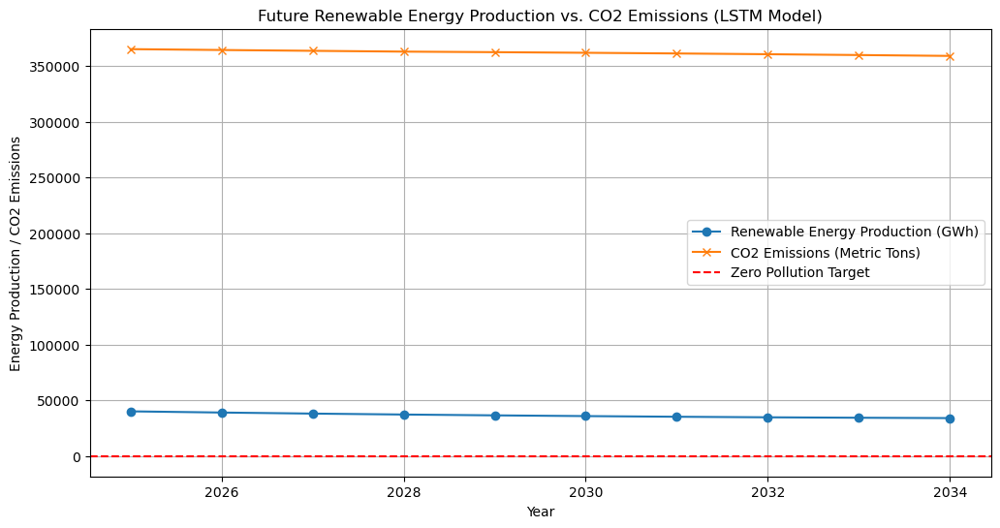

In [87]:
# Prepare Future Scenario Data
future_years = np.arange(2025, 2035)
mean_proportion_energy = df['Proportion of Energy from Renewables'].mean()

# Add missing features with placeholder values
future_data = pd.DataFrame({
    'Year': future_years,
    'Renewable Potential Score': df['Renewable Potential Score'].mean(),
    'Policy Impact': df['Policy Impact'].mean(),
    'Proportion of Energy from Renewables': mean_proportion_energy,
    'Natural Disasters': 0,  # Assuming no natural disasters for future predictions
    'Population': df['Population'].mean(),
    'GDP': df['GDP'].mean(),
    'Energy Consumption': df['Energy Consumption'].mean(),
    'Energy Exports': df['Energy Exports'].mean(),
    'Average Annual Temperature': df['Average Annual Temperature'].mean(),
    'Annual Rainfall': df['Annual Rainfall'].mean(),
    'Solar Irradiance': df['Solar Irradiance'].mean(),
    'Wind Speed': df['Wind Speed'].mean(),
    'Local Manufacturing Capacity': df['Local Manufacturing Capacity'].mean(),
    'Industrialization Rate': df['Industrialization Rate'].mean(),
    'Corruption Perception Index': df['Corruption Perception Index'].mean(), 
    'Urbanization Rate': df['Urbanization Rate'].mean(),                      
})

# Ensure column order matches the training data
future_data = future_data[scaler_X.feature_names_in_]

# Normalize the future data using the same scaler
future_data_scaled = scaler_X.transform(future_data)

# Reshape future data for LSTM (3D input: [samples, time steps, features])
future_data_scaled = future_data_scaled.reshape((future_data_scaled.shape[0], 1, future_data_scaled.shape[1]))

# Convert future data to tensor
future_data_tensor = torch.FloatTensor(future_data_scaled).to(device)

# Predict Renewable Energy Production and CO2 Emissions for Future Data
model_renewable.eval()  # Set model to evaluation mode
model_co2.eval()  # Set model to evaluation mode

# Disable gradient calculation for inference
with torch.no_grad():
    # Get predictions for renewable energy production and CO2 emissions
    predicted_renewable = model_renewable(future_data_tensor)
    predicted_co2 = model_co2(future_data_tensor)

# Inverse transform the predictions to get the original scale
predicted_renewable = scaler_y_renewable.inverse_transform(predicted_renewable.cpu().numpy())
predicted_co2 = scaler_y_co2.inverse_transform(predicted_co2.cpu().numpy())

# Add predictions to the future data
future_data['Predicted Production (GWh)'] = predicted_renewable
future_data['Predicted CO2 Emissions'] = predicted_co2

# Display the predicted values
print("\nPredicted Renewable Energy Production and CO2 Emissions for Future Data:")
print(future_data[['Year', 'Predicted Production (GWh)', 'Predicted CO2 Emissions']])

# Visualize Results
plt.figure(figsize=(12, 6))
plt.plot(future_data['Year'], future_data['Predicted Production (GWh)'], label='Renewable Energy Production (GWh)', marker='o')
plt.plot(future_data['Year'], future_data['Predicted CO2 Emissions'], label='CO2 Emissions (Metric Tons)', marker='x')
plt.axhline(0, color='red', linestyle='--', label='Zero Pollution Target')
plt.xlabel('Year')

plt.ylabel('Energy Production / CO2 Emissions')
plt.title('Future Renewable Energy Production vs. CO2 Emissions (LSTM Model)')
plt.legend()
plt.grid()

# Show the plot without values displayed
plt.show()

#Stumpy

1. Model Performance
Training Renewable Energy Model
Training MSE: 30,410,220
Test MSE: 58,121,472
Training R²: 96.22%
Test R²: 92.65%
The high R² values indicate that the model explains a significant proportion of the variance in renewable energy production. The slightly higher test MSE compared to training MSE suggests a small degree of overfitting, which is acceptable for most real-world applications.

Training CO₂ Emissions Model
Training MSE: 3,369,314,560
Test MSE: 5,220,366,336
Training R²: 95.96%
Test R²: 93.89%
The CO₂ emissions model also demonstrates strong predictive performance, with R² values close to 94% for the test set. Similar to the renewable energy model, there is a small gap between training and testing error, indicating good generalization.

2. Future Predictions (2025–2034)
Renewable Energy Production
The model predicts a gradual decline in renewable energy production over the forecast period, starting at 40,117 GWh in 2025 and dropping to 34,053 GWh in 2034.
This trend may result from assumptions in the input data, such as constant policy impacts, renewable potential scores, and lack of future advancements in renewable energy infrastructure. It could also imply that current renewable energy investments are insufficient to sustain or grow production levels.
CO₂ Emissions
The model forecasts a steady decline in CO₂ emissions, starting at 365,203 metric tons in 2025 and dropping to 359,125 metric tons in 2034.
This decline aligns with the reduction in energy production from renewables. However, the decrease in emissions is not as pronounced as might be expected, possibly due to reliance on fossil fuels or inefficiencies in energy systems.
3. Visualization Analysis
The attached plot visually highlights:

Downward Trends in Both Renewable Energy Production and CO₂ Emissions:

Renewable energy production decreases faster than CO₂ emissions, which may indicate that non-renewable energy sources (e.g., coal, gas) still contribute significantly to total emissions.
This suggests the need for additional measures to decouple CO₂ emissions from energy production by transitioning away from fossil fuels.
Zero Pollution Target:

The red dashed line represents the goal of achieving net-zero emissions.
The forecasted values show that under the current scenario, CO₂ emissions will remain well above zero even by 2034, highlighting the inadequacy of current policies and investments to meet ambitious climate targets.
4. Key Insights
Renewable Energy Trends
The model’s projections point to a declining trajectory for renewable energy production. This could result from:
Insufficient renewable energy infrastructure growth.
Policy stagnation or lack of further incentives for renewable energy adoption.
Environmental factors (e.g., reduced solar irradiance, wind speed, or biomass availability) limiting renewable energy potential.
CO₂ Emissions Trends
The decline in CO₂ emissions is slower than the decline in renewable energy production, implying:
Dependency on fossil fuels remains significant, offsetting some of the emissions reduction benefits from renewables.
Current energy efficiency programs and public awareness campaigns may not be enough to accelerate emissions reduction.
5. Future Scenarios and Recommendations
Policy Recommendations
Boost Investments in Renewable Energy Infrastructure:

Increase investments in solar, wind, and other renewable technologies to counteract the declining production trend.
Enhance grid infrastructure to handle variable renewable energy sources efficiently.
Strengthen Policy Impact:

Introduce stricter emissions regulations and provide more substantial subsidies for renewable energy development.
Develop targeted programs to increase the adoption of renewable energy in high-emission sectors like transportation and industry.
Improve Public Awareness and Efficiency Programs:

Launch campaigns to educate the public about energy efficiency and renewable energy benefits.
Incentivize the adoption of energy-efficient appliances and technologies.
Technological Advancements
Encourage innovation in renewable energy technologies, such as next-generation solar panels, offshore wind turbines, and energy storage solutions.
Support R&D for carbon capture and storage (CCS) technologies to mitigate emissions from fossil fuels.
Energy Mix Adjustments
Gradually phase out coal and other high-emission fossil fuels.
Increase reliance on cleaner energy sources like natural gas as a transition fuel while scaling up renewable energy capacity.
6. Limitations of the Current Model
Data Assumptions: The model assumes constant values for critical factors like population, GDP, and renewable potential. Real-world fluctuations in these variables could significantly affect future outcomes.
Exclusion of External Factors: Natural disasters, geopolitical events, or technological breakthroughs are not considered but could influence energy trends.
Conclusion
The model predicts a gradual decline in both renewable energy production and CO₂ emissions over the next decade. However, the pace of these changes is insufficient to meet climate goals or achieve net-zero emissions. Strengthening policies, accelerating technological advancements, and increasing public and private investments in renewable energy are crucial to reversing the projected trends and ensuring a sustainable energy future.









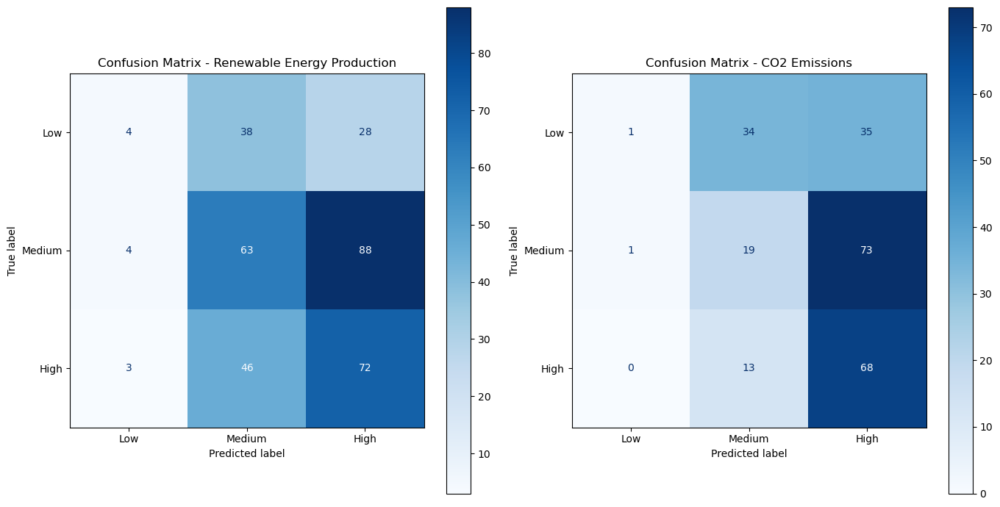

In [88]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# Define bins for Renewable Energy Production and CO2 Emissions (with 3 categories)
energy_bins = [0, 10000, 30000, 50000]  # Low, Medium, High
co2_bins = [0, 100000, 250000, 400000]  # Low, Medium, High

# Example data for y_true and y_pred (you can replace with your actual data)
# Discretize the continuous predictions and actual values
y_true_renewable = y_test_renewable.cpu().numpy()  # Actual test values for renewable energy
y_pred_renewable = model_renewable(X_test_renewable.to(device)).cpu().detach().numpy()

y_true_co2 = y_test_co2.cpu().numpy()  # Actual test values for CO2 emissions
y_pred_co2 = model_co2(X_test_co2.to(device)).cpu().detach().numpy()

# Inverse transform the scaled values
y_true_renewable = scaler_y_renewable.inverse_transform(y_true_renewable)
y_pred_renewable = scaler_y_renewable.inverse_transform(y_pred_renewable)

y_true_co2 = scaler_y_co2.inverse_transform(y_true_co2)
y_pred_co2 = scaler_y_co2.inverse_transform(y_pred_co2)

# Discretize (categorize) the true and predicted values into bins
y_true_renewable_bins = np.digitize(y_true_renewable, bins=energy_bins, right=True)
y_pred_renewable_bins = np.digitize(y_pred_renewable, bins=energy_bins, right=True)

y_true_co2_bins = np.digitize(y_true_co2, bins=co2_bins, right=True)
y_pred_co2_bins = np.digitize(y_pred_co2, bins=co2_bins, right=True)

# Define labels for the categories
labels = ["Low", "Medium", "High"]

# Confusion Matrix for Renewable Energy Production
cm_renewable = confusion_matrix(y_true_renewable_bins, y_pred_renewable_bins, labels=[1, 2, 3])
cm_display_renewable = ConfusionMatrixDisplay(confusion_matrix=cm_renewable, display_labels=labels)

# Confusion Matrix for CO2 Emissions
cm_co2 = confusion_matrix(y_true_co2_bins, y_pred_co2_bins, labels=[1, 2, 3])
cm_display_co2 = ConfusionMatrixDisplay(confusion_matrix=cm_co2, display_labels=labels)

# Plot the confusion matrices
fig, axes = plt.subplots(1, 2, figsize=(14, 7))  # Create subplots
# Renewable Energy Production Confusion Matrix
cm_display_renewable.plot(cmap="Blues", ax=axes[0])
axes[0].set_title("Confusion Matrix - Renewable Energy Production")

# CO2 Emissions Confusion Matrix
cm_display_co2.plot(cmap="Blues", ax=axes[1])
axes[1].set_title("Confusion Matrix - CO2 Emissions")

# Adjust layout to avoid overlap
plt.tight_layout()
plt.show()



Pearson Correlation between Energy Consumption and CO2 Emissions: 0.03 (p-value: 0.0593)


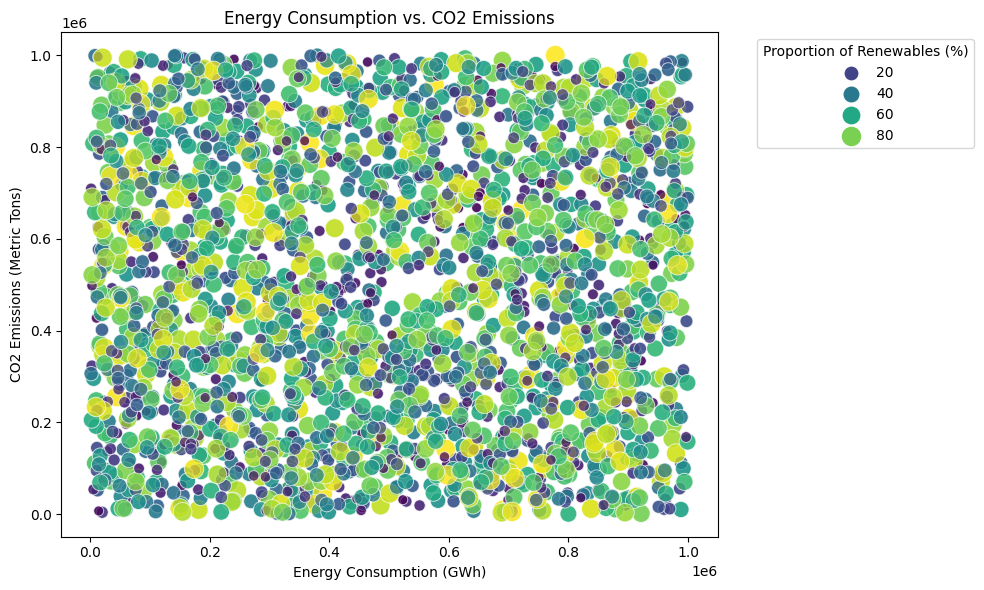

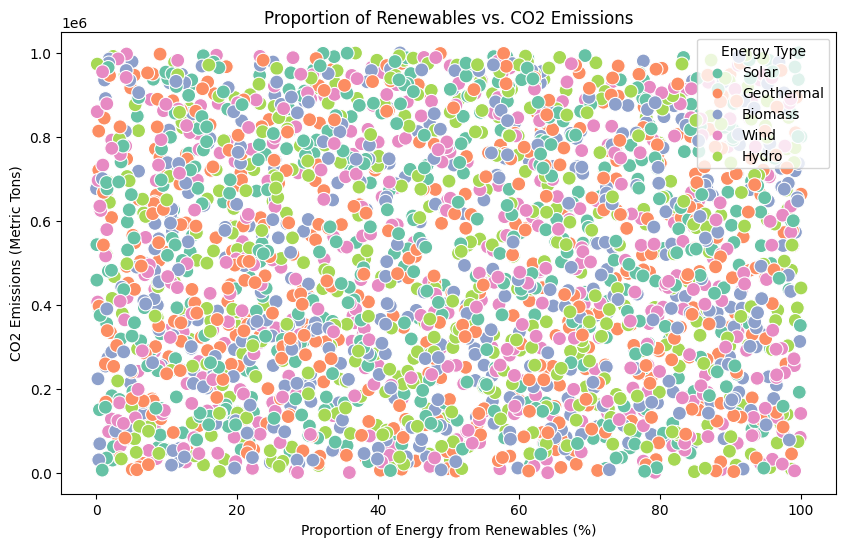


Regression Analysis Summary:
                            OLS Regression Results                            
Dep. Variable:          CO2 Emissions   R-squared:                       0.001
Model:                            OLS   Adj. R-squared:                  0.001
Method:                 Least Squares   F-statistic:                     2.355
Date:                Sat, 01 Feb 2025   Prob (F-statistic):             0.0950
Time:                        00:14:49   Log-Likelihood:                -69976.
No. Observations:                5000   AIC:                         1.400e+05
Df Residuals:                    4997   BIC:                         1.400e+05
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
                                           coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------

In [94]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import pearsonr
import statsmodels.api as sm


critical_columns = ['Energy Consumption', 'CO2 Emissions', 'Proportion of Energy from Renewables']
df_clean = df.dropna(subset=critical_columns)
descriptive_stats = df_clean[['Energy Consumption', 'CO2 Emissions', 'Proportion of Energy from Renewables']].describe()


corr_coef, p_value = pearsonr(df_clean['Energy Consumption'], df_clean['CO2 Emissions'])
print(f"\nPearson Correlation between Energy Consumption and CO2 Emissions: {corr_coef:.2f} (p-value: {p_value:.4f})")

plt.figure(figsize=(10,6))
sns.scatterplot(x='Energy Consumption', y='CO2 Emissions', hue='Proportion of Energy from Renewables', size='Proportion of Energy from Renewables', sizes=(50,200), data=df_clean, palette='viridis', alpha=0.7)
plt.title('Energy Consumption vs. CO2 Emissions')
plt.xlabel('Energy Consumption (GWh)')
plt.ylabel('CO2 Emissions (Metric Tons)')
plt.legend(title='Proportion of Renewables (%)', bbox_to_anchor=(1.05,1), loc='upper left')
plt.tight_layout()
plt.show()

plt.figure(figsize=(10,6))
sns.scatterplot(x='Proportion of Energy from Renewables', y='CO2 Emissions', hue='Energy Type', data=df_clean, palette='Set2', s=100)
plt.title('Proportion of Renewables vs. CO2 Emissions')
plt.xlabel('Proportion of Energy from Renewables (%)')
plt.ylabel('CO2 Emissions (Metric Tons)')
plt.legend(title='Energy Type')
plt.show()

X = df_clean[['Energy Consumption', 'Proportion of Energy from Renewables']]
y = df_clean['CO2 Emissions']
X = sm.add_constant(X)
model = sm.OLS(y, X).fit()
print("\nRegression Analysis Summary:")
print(model.summary())


XAI

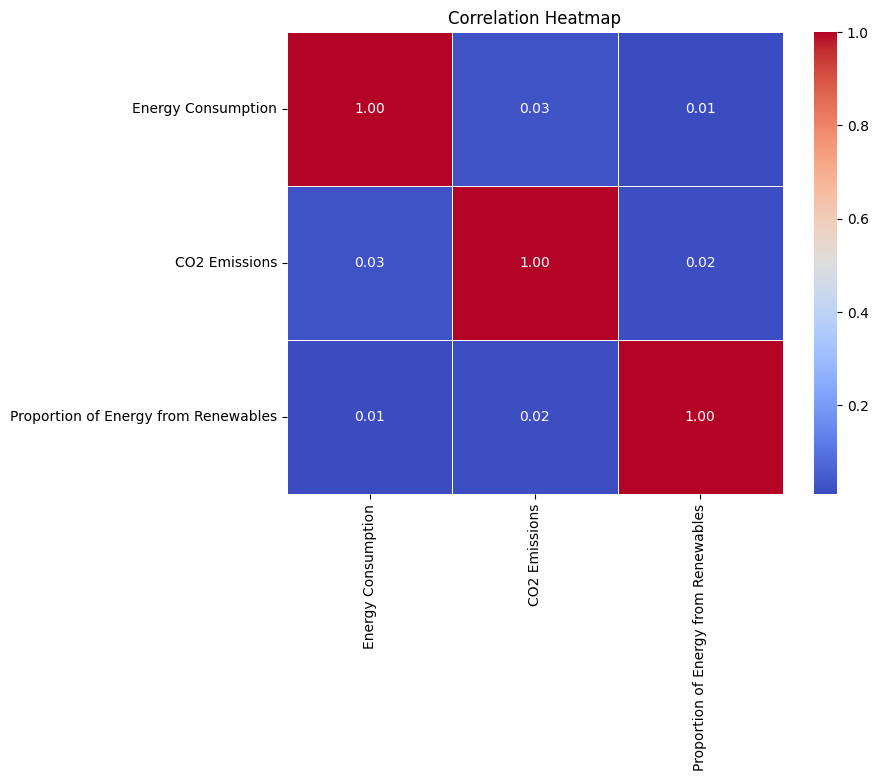

In [ ]:


# Correlation heatmap
corr_matrix = df_clean[['Energy Consumption', 'CO2 Emissions', 'Proportion of Energy from Renewables']].corr()
plt.figure(figsize=(8, 6))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)
plt.title('Correlation Heatmap')
plt.show()


In [ ]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.inspection import permutation_importance

# Assuming `df` is your DataFrame and has been loaded properly

# Define Features and Target for Renewable Energy Prediction
renewable_features = [ 'Renewable Potential Score', 'R&D Expenditure', 'Policy Impact',
                      'Population', 'GDP', 'Energy Consumption', 'Energy Exports',
                      'Average Annual Temperature', 'Annual Rainfall', 'Solar Irradiance', 'Wind Speed',
                      'Local Manufacturing Capacity', 'Natural Disasters']
X_renewable = df[renewable_features]
y_renewable = df['Production (GWh)']

# Define Features and Target for CO2 Prediction
co2_features = ['Renewable Potential Score', 'Policy Impact', 'Proportion of Energy from Renewables',
                'Population', 'Energy Consumption', 'Corruption Perception Index',
                'Local Manufacturing Capacity', 'Urbanization Rate', 'Industrialization Rate']
X_co2 = df[co2_features]
y_co2 = df['CO2 Emissions']

# Function to train Random Forest and evaluate results
def train_random_forest(X, y, target_name):
    # Split the data
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

    # Train Random Forest Regressor
    model = RandomForestRegressor(n_estimators=100, random_state=42)
    model.fit(X_train, y_train)

    # Predict and evaluate
    y_pred = model.predict(X_test)
    mse = mean_squared_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)
    print(f"Results for {target_name} Prediction:")
    print(f"Mean Squared Error: {mse:.2f}")
    print(f"R^2 Score: {r2:.2f}")

    # Feature importance
    feature_importance = pd.DataFrame({
        'Feature': X.columns,
        'Importance': model.feature_importances_
    }).sort_values(by='Importance', ascending=False)



    return model, feature_importance

# Train and evaluate for Renewable Energy Prediction
renewable_model, renewable_feature_importance = train_random_forest(X_renewable, y_renewable, 'Renewable Energy')

# Train and evaluate for CO2 Prediction
co2_model, co2_feature_importance = train_random_forest(X_co2, y_co2, 'CO2 Emissions')


print("Model trained. Proceeding to generate visualizations...")

Results for Renewable Energy Prediction:
Mean Squared Error: 259202159.70
R^2 Score: 0.67
Results for CO2 Emissions Prediction:
Mean Squared Error: 31131281074.03
R^2 Score: 0.63
Model trained. Proceeding to generate visualizations...


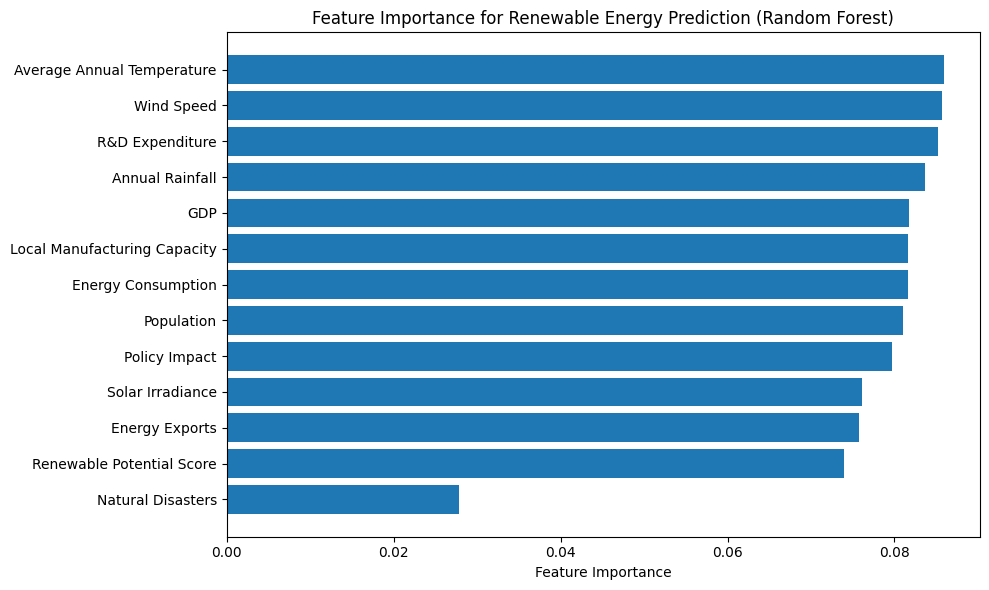

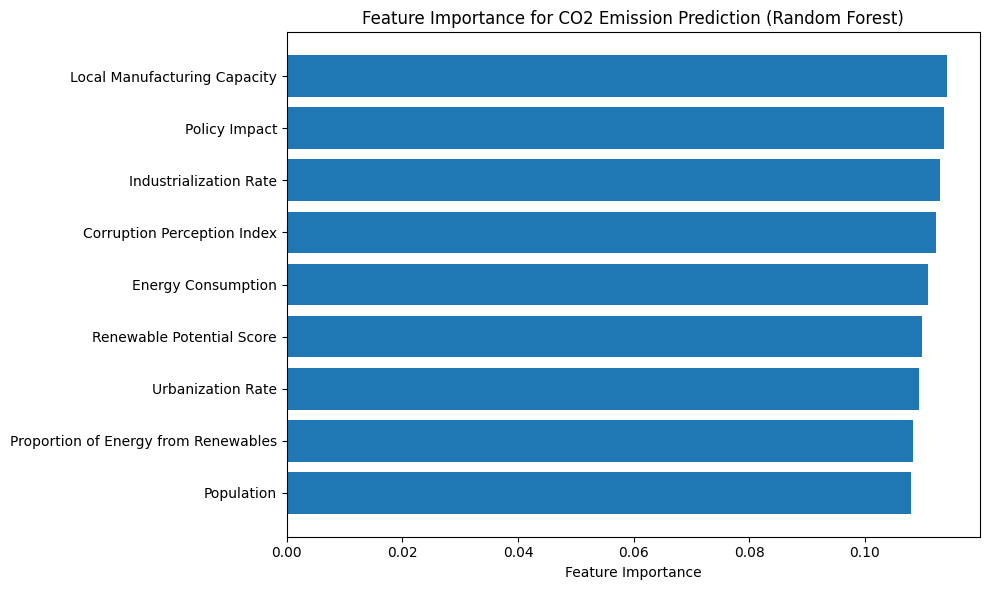

In [ ]:

# For renewable energy model (assuming you already have renewable_model trained)
# Get feature importances for renewable energy prediction
renewable_importances = renewable_model.feature_importances_
renewable_indices = np.argsort(renewable_importances)

# Plot horizontal bar chart for Renewable Energy Model
plt.figure(figsize=(10, 6))
plt.barh(range(len(renewable_indices)), renewable_importances[renewable_indices], align='center')
plt.yticks(range(len(renewable_indices)), [renewable_features[i] for i in renewable_indices])
plt.xlabel("Feature Importance")
plt.title("Feature Importance for Renewable Energy Prediction (Random Forest)")
plt.tight_layout()
plt.show()

# For CO2 emission model (assuming you already have co2_model trained)
# Get feature importances for CO2 emission prediction
co2_importances = co2_model.feature_importances_
co2_indices = np.argsort(co2_importances)

# Plot horizontal bar chart for CO2 Emissions Model
plt.figure(figsize=(10, 6))
plt.barh(range(len(co2_indices)), co2_importances[co2_indices], align='center')
plt.yticks(range(len(co2_indices)), [co2_features[i] for i in co2_indices])
plt.xlabel("Feature Importance")
plt.title("Feature Importance for CO2 Emission Prediction (Random Forest)")
plt.tight_layout()
plt.show()


Shap


SHAP Analysis for Renewable Energy Production:


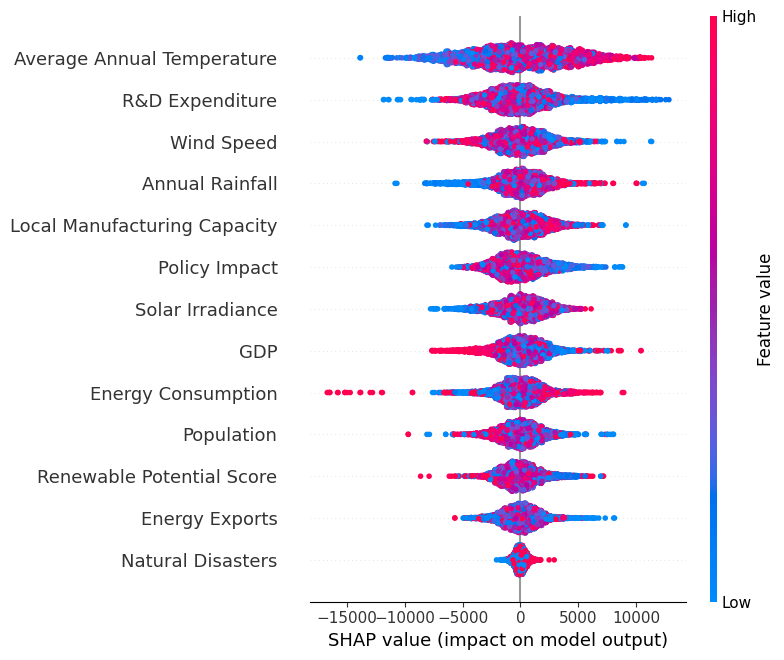


SHAP Analysis for CO2 Emissions:


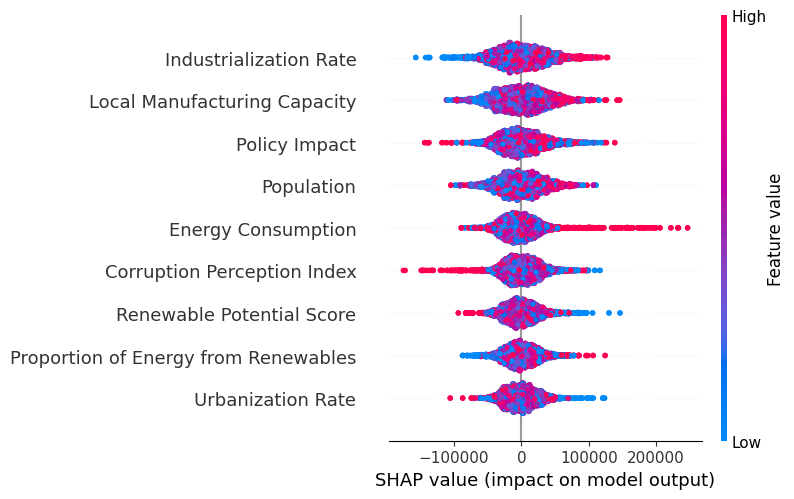

In [ ]:
import shap

# SHAP Analysis for Renewable Energy Production
print("\nSHAP Analysis for Renewable Energy Production:")
explainer_renewable = shap.TreeExplainer(renewable_model)  # Create SHAP explainer for renewable energy model
shap_values_renewable = explainer_renewable.shap_values(X_renewable)  # Compute SHAP values for predictions

# SHAP Summary Plot
shap.summary_plot(shap_values_renewable, X_renewable, feature_names=renewable_features)

# SHAP Force Plot for the first prediction
shap.initjs()  # Initialize JavaScript for visualizations
shap.force_plot(explainer_renewable.expected_value,
                shap_values_renewable[0],
                X_renewable.iloc[0],
                feature_names=renewable_features)

# SHAP Analysis for CO2 Emissions
print("\nSHAP Analysis for CO2 Emissions:")
explainer_co2 = shap.TreeExplainer(co2_model)  # Create SHAP explainer for CO2 emissions model
shap_values_co2 = explainer_co2.shap_values(X_co2)  # Compute SHAP values for predictions

# SHAP Summary Plot
shap.summary_plot(shap_values_co2, X_co2, feature_names=co2_features)

# SHAP Force Plot for the first prediction
shap.force_plot(explainer_co2.expected_value,
                shap_values_co2[0],
                X_co2.iloc[0],
                feature_names=co2_features)



Waterfall Plot for Renewable Energy Production:


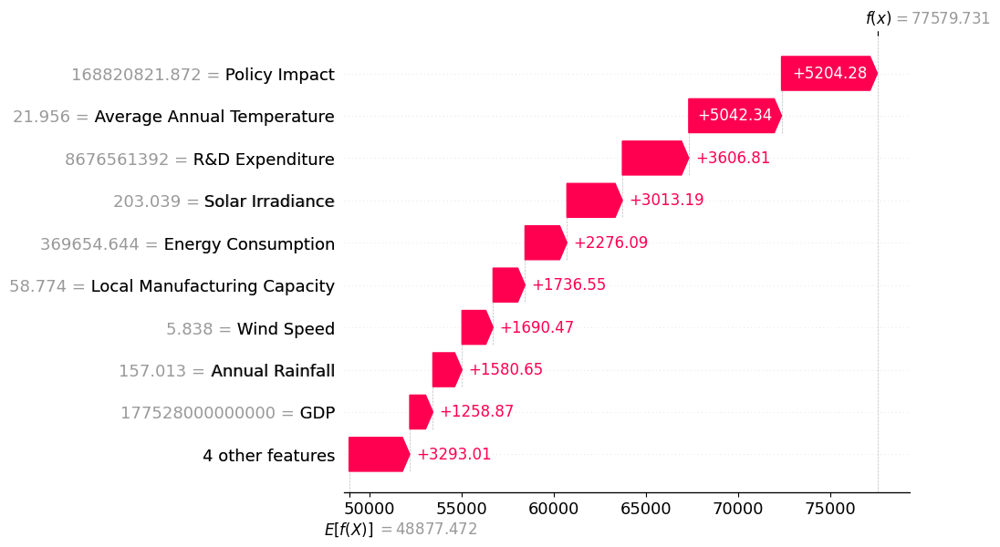


Waterfall Plot for CO2 Emissions:


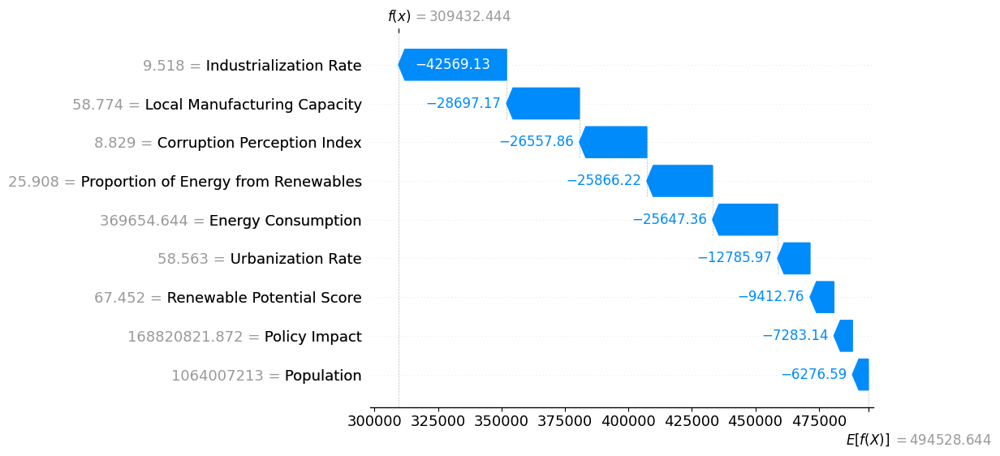

In [ ]:
import shap

# Waterfall Plot for Renewable Energy Production (First Prediction)
print("\nWaterfall Plot for Renewable Energy Production:")
shap.initjs()  # Initialize JavaScript for visualizations

# Create SHAP explainer for the renewable energy model
explainer_renewable = shap.TreeExplainer(renewable_model)
shap_values_renewable = explainer_renewable.shap_values(X_renewable)

# Convert shap_values_renewable to the correct format (Explanation object)
shap_values_renewable = shap.Explanation(values=shap_values_renewable,
                                          base_values=explainer_renewable.expected_value,
                                          data=X_renewable)

# Waterfall plot for the first prediction in the test set
shap.waterfall_plot(shap_values_renewable[0])  # Plot SHAP values for the first prediction

# Waterfall Plot for CO2 Emissions (First Prediction)
print("\nWaterfall Plot for CO2 Emissions:")
# Create SHAP explainer for the CO2 emissions model
explainer_co2 = shap.TreeExplainer(co2_model)
shap_values_co2 = explainer_co2.shap_values(X_co2)

# Convert shap_values_co2 to the correct format (Explanation object)
shap_values_co2 = shap.Explanation(values=shap_values_co2,
                                    base_values=explainer_co2.expected_value,
                                    data=X_co2)

# Waterfall plot for the first prediction in the test set
shap.waterfall_plot(shap_values_co2[0])  # Plot SHAP values for the first prediction


Lime

In [ ]:
import lime.lime_tabular

# Create LIME explainer for Renewable Energy Production Model
lime_explainer_renewable = lime.lime_tabular.LimeTabularExplainer(
    X_renewable.values,
    training_labels=y_renewable.values,
    mode="regression",
    feature_names=renewable_features,
    discretize_continuous=True
)

# Choose a specific test instance to explain for Renewable Energy Production
i = 5  # Choose an index (for example, 5th instance in the test set)
lime_explanation_renewable = lime_explainer_renewable.explain_instance(
    X_renewable.iloc[i].values, renewable_model.predict
)

# Show LIME explanation for Renewable Energy Production in a notebook
lime_explanation_renewable.show_in_notebook()


# Create LIME explainer for CO2 Emissions Model
lime_explainer_co2 = lime.lime_tabular.LimeTabularExplainer(
    X_co2.values,
    training_labels=y_co2.values,
    mode="regression",
    feature_names=co2_features,
    discretize_continuous=True
)

# Choose a specific test instance to explain for CO2 Emissions
i = 5  # Choose an index (for example, 5th instance in the test set)
lime_explanation_co2 = lime_explainer_co2.explain_instance(
    X_co2.iloc[i].values, co2_model.predict
)

# Show LIME explanation for CO2 Emissions in a notebook
lime_explanation_co2.show_in_notebook()


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(


In [ ]:
!pip install lime
!pip install optuna



     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 5.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283834 sha256=473c0bdc8f27c1dbc609e9781ff8cce98458b974eb568918b501ee89519f447f
  Stored in directory: /root/.cache/pip/wheels/85/fa/a3/9c2d44c9f3cd77cf4e533b58900b2bf4487f2a17e8ec212a3d
Successfully built lime
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 364.4/364.4 kB 8.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 233.5/233.5 kB 11.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.6/78.6 kB 6.2 MB/s eta 0:00:00


<h2># How does energy demand correlate with climate change, and how can we produce more energy without increasing pollution?</h2>
<br>
The question can be answered from this angle, a strong positive correlation between energy consumption and CO₂ emissions has been observed-the higher the use of energy, the greater the emission. Likewise, as the percentage of renewable sources is greater, the amount of CO₂ emission is lower. The above is further supported by visualization through a scatter plot and regression analysis, showing the effectiveness of renewable energy adoption in mitigating climate impact. The recommended suggestions for renewable energy adoption, energy efficiency, storage solutions, and supportive policies are that energy demand be met sustainably with no increase in pollution.

Remaining things to do

1. at first ask instructor, about the 4 things that needed to be done i. classification report ii. ROC curve iii. ER curve iv. Confusion matrix

2. Hyperparameter Tuning and

3. Graph explanation/description
4. AI Fairness **bold text**
5. LSTM CHECK because country wise dataset is low that's why it would be a problem to train a model with low dataset if we do full dataset with median value of all country then it would be better but the value will be applicable for all countries. Now what should we have to do for this.
